In [1]:
import pandas as pd
import numpy as np
import pydot
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, ConnectionPatch
import graphviz
import networkx as nx
from networkx.drawing.nx_pydot import from_pydot
import collections
from collections import deque, defaultdict, OrderedDict
import os
import math
import random
import re
from pathlib import Path
import matplotlib.cm as cm
from matplotlib.path import Path
import matplotlib.patches as patches
from matplotlib.patches import Polygon, Patch, Rectangle
from scipy.spatial import ConvexHull
from sklearn.manifold import MDS, TSNE, Isomap
from sklearn.metrics import pairwise_distances
from collections import defaultdict, OrderedDict
import scipy
from scipy import optimize
from scipy.interpolate import splprep, splev
from scipy.signal import convolve
from scipy.signal.windows import gaussian

In [3]:
#names of the dot files that contain the data:
data_name_1 = "../Dataset/JazzNetwork.dot"
data_name_2 = "../Dataset/LesMiserables.dot"
data_name_3 = "../Dataset/devonshiredebate_withclusters.dot"
data_name_4 = "../Dataset/g.20.27.dot"
data_name_5 = "../Dataset/g.42.88.dot"
data_name_6 = "../Dataset/GD97.dot"
data_name_7 = "../Dataset/LeagueNetwork.dot" 
data_name_8 = "../Dataset/mesh graph.dot"
data_name_9 = "../Dataset/noname.dot" 
data_name_10 = "../Dataset/polblogs.dot"
data_name_11 = "../Dataset/robot graph.dot"
data_name_12 = "../Dataset/rome.dot"
data_name_13 = "../Dataset/snail graph.dot"


# Functions

## step 1

In [4]:
def Random(filename):
    graph = pydot.graph_from_dot_file(filename)[0]
    nodes = graph.get_nodes()
    edges = graph.get_edges()

    node_positions = {}

    for node in nodes:
        pos = np.random.rand(2)
        node_positions[node.get_name()] = pos

    fig, ax = plt.subplots()

    # Draw lines for edges FIRST 
    for edge in edges:
        source_pos = node_positions[edge.get_source()]
        destination_pos = node_positions[edge.get_destination()]
        ax.add_patch(ConnectionPatch(
            source_pos, destination_pos, 'data', 'data', color='#A9A9A9', 
            linestyle=':', linewidth=0.3  
        ))

    for node in nodes:
        pos = node_positions[node.get_name()]
        ax.add_patch(Circle(pos, radius=0.03, edgecolor='black', facecolor='skyblue'))
        ax.text(pos[0], pos[1], node.get_name(), fontsize=10, ha='center', va='center')

    # Set plot limits
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.axis('off')

    plt.show()

def UniqueRandom(filename,show_edge_labels = False):
    graph = pydot.graph_from_dot_file(filename)[0]
    def get_unique_random_position(existing_positions, max_attempts=100):
        #Generate a unique random position that does not overlap significantly with existing ones.
        for _ in range(max_attempts):
            pos = (0.1 + (0.9 - 0.1) * np.random.rand(2))*10
            if all(np.linalg.norm(pos - existing) > 0.5 for existing in existing_positions.values()):
                return pos
        return np.random.rand(2)  # Fallback if no unique position is found

    nodes = graph.get_nodes()
    edges = graph.get_edges()

    node_positions = {}

    fig, ax = plt.subplots(figsize=(8, 8))

    # Assign unique random positions to nodes
    for node in nodes:
        node_name = node.get_name()
        if node_name.isdigit():  # Ensure we ignore special characters
            node_positions[node_name] = get_unique_random_position(node_positions)
            ax.add_patch(Circle(node_positions[node_name], radius=0.28, edgecolor='black', facecolor='skyblue'))
            ax.text(node_positions[node_name][0], node_positions[node_name][1], node_name, fontsize=8, ha='center', va='center')

    # Draw edges with weights
    for edge in edges:
        source, target = edge.get_source(), edge.get_destination()
        if source.isdigit() and target.isdigit():
            source_pos = node_positions[source]
            target_pos = node_positions[target]
            weight = edge.get_attributes().get("weight", "1")  # Get weight, default to 1
            ax.add_patch(ConnectionPatch(
                source_pos, target_pos, 'data', 'data', color='#A9A9A9', linestyle=':', linewidth=0.6
            ))

            # Only show if True
            if show_edge_labels:
                mid_pos = (source_pos + target_pos) / 2  # Midpoint for weight label
                ax.text(mid_pos[0], mid_pos[1], weight, fontsize=6, color='red', ha='center', va='center')


    ax.set_xlim(0, 10)
    ax.set_ylim(0, 10)
    ax.axis('off')

    plt.show()

def Circular(filename):
    graph = pydot.graph_from_dot_file(filename)[0]
   
   
    G_nx = nx.nx_pydot.from_pydot(graph)

    # Get nodes and their degrees
    node_degrees = dict(G_nx.degree())
    sorted_nodes = sorted(node_degrees, key=node_degrees.get, reverse=True)

    # Calculate positions in a circular layout
    num_nodes = len(sorted_nodes)
    angles = np.linspace(0, 2 * np.pi, num_nodes, endpoint=False)
    radius = 5

    node_positions = {}
    for i, node in enumerate(sorted_nodes):
        angle = angles[i]
        x = radius * np.cos(angle)
        y = radius * np.sin(angle)
        node_positions[node] = (x, y)

    # Initialize the plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot nodes
    for node, pos in node_positions.items():
        ax.add_patch(Circle(pos, radius=0.1, edgecolor='black', facecolor='skyblue'))
        ax.text(pos[0], pos[1], node, fontsize=8, ha='center', va='center')

    # Plot edges
    for edge in G_nx.edges():
        source_pos = node_positions[edge[0]]
        target_pos = node_positions[edge[1]]
        ax.add_patch(ConnectionPatch(
            source_pos, target_pos, 'data', 'data', color='#A9A9A9', linestyle=':', linewidth=0.6
        ))


    # Set plot limits
    ax.set_xlim(-radius-1, radius+1)
    ax.set_ylim(-radius-1, radius+1)
    ax.axis('off')

    plt.show()

## step 2

In [5]:

def parse_dot_file_bfs_dfs(file_path):
    graph = pydot.graph_from_dot_file(file_path)[0]
    adjacency_list = {}

    #list of edges run for each node of the graph

    for edge in graph.get_edges():
        src, dst = edge.get_source(), edge.get_destination()
        if src not in adjacency_list:
            adjacency_list[src] = []
        if dst not in adjacency_list:
            adjacency_list[dst] = []
        adjacency_list[src].append(dst)
        adjacency_list[dst].append(src)  # for undirected graph

    return adjacency_list

def extract_edges(graph):
    edges = []
    for node, neighbors in graph.items():
        for neighbor in neighbors:
            edge = (node, neighbor)
            if edge not in edges and (neighbor, node) not in edges:
                edges.append(edge)
    return edges

def bfs_tree(graph, root):
    visited = set()
    queue = deque([root])
    bfs_tree = {root: []}
    
    while queue:
        node = queue.popleft()
        visited.add(node)

        for neighbor in graph.get(node, []):
            if neighbor not in visited:
                visited.add(neighbor)
                queue.append(neighbor)
                bfs_tree[node].append(neighbor)
                bfs_tree[neighbor] = []
    
    return bfs_tree

def dfs_tree(graph, root, visited=None, tree=None):
    if visited is None:
        visited = set()
    if tree is None:
        tree = {root: []}

    visited.add(root)

    for neighbor in graph.get(root, []):
        if neighbor not in visited:
            tree[root].append(neighbor)
            tree[neighbor] = []
            dfs_tree(graph, neighbor, visited, tree)

    return tree

def missing_edges(spanning_tree, full_edge_list):
    # edges of the spanning tree
    sp_edges = [(node, child) for node, children in spanning_tree.items() for child in children]
    sp_edges_set = set(sp_edges)
    # all edges of the graph
    full_edges_set = set(full_edge_list)
    # edges not present in the spanning tree
    non_tree_edges = full_edges_set - sp_edges_set
    return non_tree_edges

def compute_postorder_spacing(tree, node, spacing, boundaries, min_separation=1.0):
    """ Postorder traversal to compute spacing between nodes. """
    if node not in tree or not tree[node]:  # No children
        boundaries[node] = (spacing[node], spacing[node])
        return
    
    children = tree[node]
    
    # Process all children first
    for child in children:
        compute_postorder_spacing(tree, child, spacing, boundaries, min_separation)
    
    # Special handling for nodes with 3+ children
    if len(children) >= 3:
        # Ensure adequate spacing between all children
        for i in range(len(children) - 1):
            current_child = children[i]
            next_child = children[i + 1]
            
            # Get current right boundary and next left boundary
            _, current_right = boundaries[current_child]
            next_left, _ = boundaries[next_child]
            
            # If children are too close, shift the next child and all its subtree
            if next_left - current_right < min_separation:
                shift_amount = (current_right + min_separation) - next_left
                
                # Shift the next child and all nodes in its subtree
                shift_subtree(tree, next_child, shift_amount, spacing, boundaries)
    
    # Calculate leftmost and rightmost boundaries from children
    leftmost = min(boundaries[child][0] for child in children)
    rightmost = max(boundaries[child][1] for child in children)
    
    # Center the parent node with respect to its children
    midpoint = (leftmost + rightmost) / 2
    spacing[node] = midpoint
    
    # Set the parent's boundaries to encompass all children
    # Add some padding to ensure parent doesn't overlap with other nodes
    padding = 0.5  # Adjust as needed
    boundaries[node] = (leftmost - padding, rightmost + padding)

def shift_subtree(tree, node, shift_amount, spacing, boundaries):
    """ Shift a node and all its descendants by a specified amount. """
    # Shift current node
    spacing[node] += shift_amount
    left, right = boundaries[node]
    boundaries[node] = (left + shift_amount, right + shift_amount)
    
    # Recursively shift all descendants
    if node in tree:
        for child in tree[node]:
            shift_subtree(tree, child, shift_amount, spacing, boundaries)

def not_using_compute_postorder_spacing(tree, node, spacing, boundaries):
    """ Postorder traversal to compute spacing between nodes. """
    if node not in tree:
        return

    leftmost, rightmost = None, None

    for child in tree[node]:
        compute_postorder_spacing(tree, child, spacing, boundaries)
        
        # Set boundaries for subtree
        if leftmost is None:
            leftmost = boundaries[child][0]
        rightmost = boundaries[child][1]

    if leftmost is not None:
        # Assign horizontal spacing based on children's boundaries
        boundaries[node] = (leftmost, rightmost)
        spacing[node] = (leftmost + rightmost) / 2
    else:
        # Leaf node case
        boundaries[node] = (spacing[node], spacing[node])

def assign_preorder_positions(tree, node, x_positions, y_positions, depth, spacing):
    """ Preorder traversal to assign final x and y coordinates. """
    x_positions[node] = spacing[node]
    y_positions[node] = -depth  # Negative depth for layered layout

    for child in tree[node]:
        assign_preorder_positions(tree, child, x_positions, y_positions, depth + 1, spacing)

def draw_layered_tree(tree, title="Level-Based Tree Layout", show_node_ids=True):
    """ Draw the tree with improved positioning. """
    spacing = {}  # Computed x-coordinates
    boundaries = {}  # Store subtree boundaries

    # Assign initial x-coordinates (order of appearance)
    order = 0
    for node in tree:
        spacing[node] = order
        order += 2  # Assign initial spacing (will be refined in postorder)

    # Compute proper spacing using postorder traversal
    root = next(iter(tree))  # Get root node
    compute_postorder_spacing(tree, root, spacing, boundaries)

    # Assign final positions using preorder traversal
    x_positions, y_positions = {}, {}
    assign_preorder_positions(tree, root, x_positions, y_positions, depth=0, spacing=spacing)

    # Draw the tree
    plt.figure(figsize=(8, 6))
    for parent, children in tree.items():
        for child in children:
            x1, y1 = x_positions[parent], y_positions[parent]
            x2, y2 = x_positions[child], y_positions[child]
            plt.plot([x1, x2], [y1, y2], 'k-', linewidth=0.2)

    if show_node_ids:
        for node, (x, y) in zip(x_positions.keys(), zip(x_positions.values(), y_positions.values())):
            plt.text(x, y, node, ha='center', va='center', fontsize=5,
                     bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='circle'))
    else: # without node ids
        for node, (x, y) in zip(x_positions.keys(), zip(x_positions.values(), y_positions.values())):
            plt.text(x, y, " ", ha='center', va='center', fontsize=2,
                     bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='circle'))

    # Draw red dotted lines at each level
    unique_levels = sorted(set(y_positions.values()), reverse=True)
    for i, level in enumerate(unique_levels):
        plt.axhline(y=level, color='red', linestyle='--', linewidth=0.5)
        plt.text(min(x_positions.values()) - 15.5, level + 0.1, f"level {i}", color='red', fontsize=6, va='center')

    plt.title(title)
    plt.axis('off')
    plt.show()

def draw_tree_with_all_edges(non_tree_edges, tree, title="Level-Based Tree Layout", random=True):
    """ Draw the tree with improved positioning. """
    spacing = {}  # Computed x-coordinates
    boundaries = {}  # Store subtree boundaries

    # Assign initial x-coordinates (order of appearance)
    order = 0
    for node in tree:
        spacing[node] = order
        order += 2  # Assign initial spacing (will be refined in postorder)

    # Compute proper spacing using postorder traversal
    root = next(iter(tree))  # Get root node
    compute_postorder_spacing(tree, root, spacing, boundaries)

    # Assign final positions using preorder traversal
    x_positions, y_positions = {}, {}
    assign_preorder_positions(tree, root, x_positions, y_positions, depth=0, spacing=spacing)

    # Draw the tree
    plt.figure(figsize=(8, 6))
    for parent, children in tree.items():
        for child in children:
            x1, y1 = x_positions[parent], y_positions[parent]
            x2, y2 = x_positions[child], y_positions[child]
            plt.plot([x1, x2], [y1, y2], 'k-', linewidth=0.2)

    for node, (x, y) in zip(x_positions.keys(), zip(x_positions.values(), y_positions.values())):
        plt.text(x, y, node, ha='center', va='center', fontsize=2,
                 bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='circle'))
    if random:
        # draw the non-tree edges as bended lines between nodes with different colors:
        colors = plt.cm.rainbow(np.linspace(0, 1, len(non_tree_edges)))
        for edge, color in zip(non_tree_edges, colors):
            x1, y1 = x_positions[edge[0]], y_positions[edge[0]]
            x2, y2 = x_positions[edge[1]], y_positions[edge[1]]

            # Generate random curvature
            curvature = np.random.uniform(-0.2, 0.2)

            # Calculate control points for Bezier curve
            ctrl_x = (x1 + x2) / 2 + curvature * (y2 - y1)
            ctrl_y = (y1 + y2) / 2 + curvature * (x1 - x2)

            # Plot Bezier curve
            bezier_x = [x1, ctrl_x, x2]
            bezier_y = [y1, ctrl_y, y2]
            plt.plot(bezier_x, bezier_y, linestyle='--', linewidth=0.2, color=color)
    else:
        for edge in non_tree_edges:
            x1, y1 = x_positions[edge[0]], y_positions[edge[0]]
            x2, y2 = x_positions[edge[1]], y_positions[edge[1]]
            plt.plot([x1, x2], [y1, y2], 'b--', linewidth=0.2)

    plt.title(title)
    plt.axis('off')
    plt.show()

def save_drawing(tree, image_title):
    """ Draw the tree with improved positioning. """
    spacing = {}  # Computed x-coordinates
    boundaries = {}  # Store subtree boundaries

    # Assign initial x-coordinates (order of appearance)
    order = 0
    for node in tree:
        spacing[node] = order
        order += 2  # Assign initial spacing (will be refined in postorder)

    # Compute proper spacing using postorder traversal
    root = next(iter(tree))  # Get root node
    compute_postorder_spacing(tree, root, spacing, boundaries)

    # Assign final positions using preorder traversal
    x_positions, y_positions = {}, {}
    assign_preorder_positions(tree, root, x_positions, y_positions, depth=0, spacing=spacing)

    # Draw the tree
    plt.figure(figsize=(8, 6))
    for parent, children in tree.items():
        for child in children:
            x1, y1 = x_positions[parent], y_positions[parent]
            x2, y2 = x_positions[child], y_positions[child]
            plt.plot([x1, x2], [y1, y2], 'k-', linewidth=0.2)

    for node, (x, y) in zip(x_positions.keys(), zip(x_positions.values(), y_positions.values())):
        plt.text(x, y, node, ha='center', va='center', fontsize=8,
                bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='circle'))

    plt.title(image_title)
    plt.axis('off')
    plt.savefig(image_title)


## step 3

In [6]:
def draw_colorful_force_directed_graph_fruchterman_reingold_inertia(file_path, iterations=100, C=1.0, 
                                                  save_frames=True, output_dir="../Outputs_force", 
                                                  convergence_threshold=0.001, display_node_id=False):
    # Output directory
    output_dir = os.path.join(output_dir, os.path.basename(file_path))
    if save_frames and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # File name
    file_name = os.path.basename(file_path)
    graph_name = os.path.splitext(file_name)[0]
    graph_name = re.sub(r'[^\w\-.]', '', graph_name)
    
    # Graph with NetworkX: nodes and edges
    nx_graph = nx.nx_pydot.read_dot(file_path)
    nodes = list(nx_graph.nodes())
    edges = list(nx_graph.edges())

    # SCALING: 
    # - bounding box size
    n = len(nodes) # number of nodes
    scale_factor = math.sqrt(n) / 4
    width = height = max(1.0, scale_factor)
    area = width * height
    # - canvas size
    fig_width = max(8, min(24, 8 + math.sqrt(n)))
    fig_height = max(6, min(20, 6 + math.sqrt(n)))
    # - node size, font size and edge_width
    node_size = max(30, min(200, 800 / math.sqrt(n)))
    font_size = max(4, min(12, 14 / math.sqrt(n)))
    edge_width = max(0.5, min(5, 5 / math.sqrt(n)))

    # Node degrees for coloring and mass
    node_degrees = {node: len(list(nx_graph.neighbors(node))) for node in nodes}
    min_degree = min(node_degrees.values()) if node_degrees else 0
    max_degree = max(node_degrees.values()) if node_degrees else 1
    # Colormap based on degrees of nodes
    cmap = plt.cm.cool
    normalize = plt.Normalize(min_degree, max_degree)
    # Nodes mass for inertia on attractive forces
    node_masses = {node: 1 + node_degrees[node] / 2 for node in nodes}
    
    # Constant l = C · √(area/n)
    l = C * math.sqrt(area / n)
    # Initial temperature set to 0.1. It will decrease with each iteration
    t = 0.1
    
    # Initial random positions of the nodes within the bounding box
    pos = {node: np.array([random.random() * width, random.random() * height]) for node in nodes}
    # Variables for convergence
    old_positions = {node: np.array([0.0, 0.0]) for node in nodes}
    max_movement = float('inf')

    # Prepare the canvas for the drawing
    plt.figure(figsize=(fig_width, fig_height))
    
    # Force-directed loop
    i = 0
    while i < iterations and max_movement > convergence_threshold:
        # Save old positions to calculate movement
        for node in nodes:
            old_positions[node] = np.copy(pos[node])
        
        # Initialize force vectors for each node
        f_rep = {node: np.array([0.0, 0.0]) for node in nodes}
        f_attr = {node: np.array([0.0, 0.0]) for node in nodes}
        f_total = {node: np.array([0.0, 0.0]) for node in nodes}
        
        # PHASE 1: REPULSIVE forces (between all nodes)
        for u in nodes:
            for v in nodes:
                if u != v:
                    delta = pos[v] - pos[u] # vector from u to v
                    distance = max(0.1, np.linalg.norm(delta)) # euclidean distance with a lower boundry of 0.1 to avoid node collision
                    direction = delta / distance # direction

                    repulsive_magnitude = l * l / distance # scalar component of the repulsive force
                    
                    # Calculate and apply the repulsive force
                    f_rep[u] -= direction * repulsive_magnitude
        
        # PHASE 2: ATTRACTIVE forces (only between nodes connected by edges)
        for u, v in edges:
            delta = pos[v] - pos[u] # vector from u to v
            distance = max(0.1, np.linalg.norm(delta)) # euclidean distance with a lower boundry of 0.1 to avoid node collision
            direction = delta / distance # direction
            
            attractive_magnitude = distance * distance / l # scalar component of the  attractive force
            
            # Calculate and apply the attractive force with inertia
            f_attr[u] += direction * (attractive_magnitude / node_masses[u])
        
        # PHASE 3: TOTAL force = ATTRACTIVE + REPULSIVE => update positions within the 
        for v in nodes:
            f_total[v] = f_rep[v] + f_attr[v] # TOTAL force
            
            # Calculate new positions after applying the forces, with temperature
            pos[v] = pos[v] + t * f_total[v]
            # Constrain nodes within bounding box space
            pos[v][0] = min(width - 0.03, max(0.03, pos[v][0])) # orizontal position
            pos[v][1] = min(height - 0.03, max(0.03, pos[v][1])) # vertical position
        
        # Calculate maximum movement among all nodes to determine convergence
        movements = [np.linalg.norm(pos[node] - old_positions[node]) for node in nodes]
        max_movement = max(movements) if movements else 0
        
        
        # Draw the graph: every 10 iterations or at the last iteration or if it converged to a minimum movement
        if i % 10 == 0 or i == iterations - 1 or max_movement <= convergence_threshold:
            plt.clf()
            # Draw edges
            for u, v in edges:
                plt.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], color='gray', alpha=0.7, zorder=1, linewidth=edge_width)
            
            # Draw nodes with color based on degree
            for node in nodes:
                node_color = cmap(normalize(node_degrees[node]))
                plt.scatter(pos[node][0], pos[node][1], s=node_size, color=node_color, edgecolor='black', zorder=2)
                if display_node_id:
                    plt.text(pos[node][0], pos[node][1], str(node), ha='center', va='center', fontsize=font_size, zorder=3)
                else:
                    plt.text(pos[node][0], pos[node][1], " ", ha='center', va='center', fontsize=font_size, zorder=3)
            
            # Add colorbar
            if i % 10 == 0 or i == iterations - 1 or max_movement <= convergence_threshold:
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=normalize)
                sm.set_array([])
                cbar = plt.colorbar(sm, ax=plt.gca(), shrink=0.75)
                cbar.set_label('Node Degree')
            
            # Set axis limits with proper margin (within bounding box)
            margin = 0.3 * width
            plt.xlim(-margin, width + margin)
            plt.ylim(-margin, height + margin)
            plt.title(f'Fruchterman-Reingold with Inertia for {graph_name} with C={C} \n Iteration: {i+1} and Max movement: {max_movement:.6f}')
            plt.axis('off')
            plt.tight_layout()
            
            # Save the current frame
            if save_frames:
                frame_path = os.path.join(output_dir, f"{graph_name}FRI_C{C}_iter{i+1:04d}.png")
                plt.savefig(frame_path, dpi=150)
                print(f"Saved frame {i+1} to {frame_path}")
            
            # Pause to allow interface update
            plt.pause(0.01)
        
        i += 1
        t = t * 0.95 # update cooling for next iteration
    
    # Convergence message
    if max_movement <= convergence_threshold:
        print(f"Algorithm converged at iteration {i} with maximum movement {max_movement:.6f}")
    else:
        print(f"Algorithm terminated after {i} iterations. Final movement: {max_movement:.6f}")
    
    plt.show()
    
    
def draw_force_directed_graph_fruchterman_reingold_inertia(file_path, iterations=100, C=1.0, 
                                                  save_frames=True, output_dir="../Outputs_force", 
                                                  convergence_threshold=0.001, display_node_id=False):
    # Output directory
    output_dir = os.path.join(output_dir, os.path.basename(file_path))
    if save_frames and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # File name
    file_name = os.path.basename(file_path)
    graph_name = os.path.splitext(file_name)[0]
    graph_name = re.sub(r'[^\w\-.]', '', graph_name)
    
    # Graph with NetworkX: nodes and edges
    nx_graph = nx.nx_pydot.read_dot(file_path)
    nodes = list(nx_graph.nodes())
    edges = list(nx_graph.edges())

    # SCALING: 
    # - bounding box size
    n = len(nodes) # number of nodes
    scale_factor = math.sqrt(n) / 4
    width = height = max(1.0, scale_factor)
    area = width * height
    # - canvas size
    fig_width = max(8, min(24, 8 + math.sqrt(n)))
    fig_height = max(6, min(20, 6 + math.sqrt(n)))
    # - node size, font size and edge_width
    node_size = max(30, min(200, 800 / math.sqrt(n)))
    font_size = max(4, min(12, 14 / math.sqrt(n)))
    edge_width = max(0.5, min(5, 5 / math.sqrt(n)))

    # Node degrees for mass
    node_degrees = {node: len(list(nx_graph.neighbors(node))) for node in nodes}
    node_masses = {node: 1 + node_degrees[node] / 2 for node in nodes}
    
    # Constant l = C · √(area/n)
    l = C * math.sqrt(area / n)
    # Initial temperature set to 0.1. It will decrease with each iteration
    t = 0.1
    
    # Initial random positions of the nodes within the bounding box
    pos = {node: np.array([random.random() * width, random.random() * height]) for node in nodes}
    # Variables for convergence
    old_positions = {node: np.array([0.0, 0.0]) for node in nodes}
    max_movement = float('inf')

    # Prepare the canvas for the drawing
    plt.figure(figsize=(fig_width, fig_height))
    
    # Force-directed loop
    i = 0
    while i < iterations and max_movement > convergence_threshold:
        # Save old positions to calculate movement
        for node in nodes:
            old_positions[node] = np.copy(pos[node])
        
        # Initialize force vectors for each node
        f_rep = {node: np.array([0.0, 0.0]) for node in nodes}
        f_attr = {node: np.array([0.0, 0.0]) for node in nodes}
        f_total = {node: np.array([0.0, 0.0]) for node in nodes}
        
        # PHASE 1: REPULSIVE forces (between all nodes)
        for u in nodes:
            for v in nodes:
                if u != v:
                    delta = pos[v] - pos[u] # vector from u to v
                    distance = max(0.1, np.linalg.norm(delta)) # euclidean distance with a lower boundry of 0.1 to avoid node collision
                    direction = delta / distance # direction

                    repulsive_magnitude = l * l / distance # scalar component of the repulsive force
                    
                    # Calculate and apply the repulsive force
                    f_rep[u] -= direction * repulsive_magnitude
        
        # PHASE 2: ATTRACTIVE forces (only between nodes connected by edges)
        for u, v in edges:
            delta = pos[v] - pos[u] # vector from u to v
            distance = max(0.1, np.linalg.norm(delta)) # euclidean distance with a lower boundry of 0.1 to avoid node collision
            direction = delta / distance # direction
            
            attractive_magnitude = distance * distance / l # scalar component of the  attractive force
            
            # Calculate and apply the attractive force with inertia
            f_attr[u] += direction * (attractive_magnitude / node_masses[u])
        
        # PHASE 3: TOTAL force = ATTRACTIVE + REPULSIVE => update positions within the 
        for v in nodes:
            f_total[v] = f_rep[v] + f_attr[v] # TOTAL force
            
            # Calculate new positions after applying the forces, with temperature
            pos[v] = pos[v] + t * f_total[v]
            # Constrain nodes within bounding box space
            pos[v][0] = min(width - 0.03, max(0.03, pos[v][0])) # orizontal position
            pos[v][1] = min(height - 0.03, max(0.03, pos[v][1])) # vertical position
        
        # Calculate maximum movement among all nodes to determine convergence
        movements = [np.linalg.norm(pos[node] - old_positions[node]) for node in nodes]
        max_movement = max(movements) if movements else 0
        
        
        # Draw the graph: every 10 iterations or at the last iteration or if it converged to a minimum movement
        if i % 10 == 0 or i == iterations - 1 or max_movement <= convergence_threshold:
            plt.clf()
            # Draw edges
            for u, v in edges:
                plt.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], color='gray', alpha=0.7, zorder=1, linewidth=edge_width)
            
            # Draw nodes with scaled size
            for node in nodes:
                plt.scatter(pos[node][0], pos[node][1], s=node_size, color='skyblue', edgecolor='black', zorder=2)
                if display_node_id:
                    plt.text(pos[node][0], pos[node][1], str(node), ha='center', va='center', fontsize=font_size, zorder=3)
                else:
                    plt.text(pos[node][0], pos[node][1], " ", ha='center', va='center', fontsize=font_size, zorder=3)
            
            # Set axis limits with proper margin (within bounding box)
            margin = 0.3 * width
            plt.xlim(-margin, width + margin)
            plt.ylim(-margin, height + margin)
            plt.title(f'Fruchterman-Reingold with Inertia for {graph_name} with C={C} \n Iteration: {i+1} and Max movement: {max_movement:.6f}')
            plt.axis('off')
            plt.tight_layout()
            
            # Save the current frame
            if save_frames:
                frame_path = os.path.join(output_dir, f"{graph_name}FRI_C{C}_iter{i+1:04d}.png")
                plt.savefig(frame_path, dpi=150)
                print(f"Saved frame {i+1} to {frame_path}")
            
            # Pause to allow interface update
            plt.pause(0.01)
        
        i += 1
        t = t * 0.95 # update cooling for next iteration
    
    # Convergence message
    if max_movement <= convergence_threshold:
        print(f"Algorithm converged at iteration {i} with maximum movement {max_movement:.6f}")
    else:
        print(f"Algorithm terminated after {i} iterations. Final movement: {max_movement:.6f}")
    
    plt.show()

## step 4

In [7]:
def parse_dot_file(file_path):
    """
    Process the input data (path of the graph) and extract nodes and edges. 
    If the graph is undirected, it will be converted to a directed graph by putting both way edges (i.e. A->B and B->A).
    """

    # Load the graph directly with NetworkX
    nx_graph = nx.nx_pydot.read_dot(file_path)

    # Extract nodes and edges without their attributes
    nodes = nx_graph.nodes(data=False)
    edges = list(nx_graph.edges(data=False))  # Convert EdgeView to list

    # Check graph type
    is_directed = nx.is_directed(nx_graph)
    print(f"Graph is {'directed' if is_directed else 'undirected'}")
    
    if not is_directed:
        print(f"\nNumber of edges before conversion: {len(edges)}")
        # Create a new list with reversed edges and extend the original list
        reversed_edges = [(v, u) for u, v in edges]
        edges.extend(reversed_edges)
        print(f"\nNumber of edges after conversion: {len(edges)}")

    return list(nodes), edges

def circular_visualize_graph(nodes, edges):
    """Plot the directed graph using Matplotlib."""
    V = len(nodes)
    
    # Assign positions to nodes (circular layout)
    theta = np.linspace(0, 2 * np.pi, V, endpoint=False)
    node_positions = {node: (np.cos(theta[i]), np.sin(theta[i])) for i, node in enumerate(nodes)}

    # Plot nodes
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(*zip(*node_positions.values()), s=500, c="lightblue", edgecolors="black", zorder=2)

    # Plot directed edges
    for src, dst in edges:
        x1, y1 = node_positions[src]
        x2, y2 = node_positions[dst]
        ax.annotate("", xy=(x2, y2), xytext=(x1, y1),
                    arrowprops=dict(arrowstyle="->", color="gray", lw=1.5, alpha=0.7))

    # Label nodes
    for node, (x, y) in node_positions.items():
        ax.text(x, y, node, fontsize=12, ha='center', va='center', fontweight='bold')

    # Hide axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)

    plt.title("circular visualization of the graph")
    plt.show()

def trivial_heuristic(nodes, edges):
    """
    Identify edges that need to be reversed from the ordering of the nodes, in order to remove cycles.
    
    Args:
        nodes: List of nodes in the graph
        edges: List of edges as tuples (source, destination)
        
    Returns:
        tuple: (A, A_reverse) where:
            - A: List of edges that should remain unchanged (left to right)
            - A_reverse: List of edges that should be reversed (right to left)
    """
    # Create node positions ordering
    node_pos_ordered = {node: np.array([idx]) for idx, node in enumerate(nodes)}
     
    # Separate edges into those to keep and those to reverse
    A = []  # edges to keep (left to right)
    A_reverse = []  # edges to reverse (right to left)
    
    for src, dest in edges:
        # If destination is to the left of source, it's a backward edge
        if node_pos_ordered[dest] < node_pos_ordered[src]:
            A_reverse.append((src, dest))
        else:
            A.append((src, dest))
    
    return A, A_reverse

def reversed_edges(A, A_reverse):
    """Return the reversed edges that solve the loops"""
    A_reversed = [(dst, src) for src, dst in A_reverse]
    print(f"\nNumber of edges that have been reversed: {len(A_reversed)}")
    print(f"\nList of reversed edges: {A_reversed}")
    final_reversed = A_reversed + A
    
    return final_reversed, A_reversed

def circular_reverse_graph(nodes, edges, reversed_e, unchanged_e):
    """
    Plot the directed graph using Matplotlib.
    
    Parameters:
        nodes: List of nodes
        edges: List of all edges
        reversed_e: List of edges that were changed (to be drawn in red)
        unchanged_e: List of edges that were not changed (to be drawn in black)
    """

    # Assign positions to nodes (circular layout)
    V = len(nodes)
    theta = np.linspace(0, 2 * np.pi, V, endpoint=False)
    node_positions = {node: (np.cos(theta[i]), np.sin(theta[i])) for i, node in enumerate(nodes)}

    # Plot nodes
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(*zip(*node_positions.values()), s=500, c="lightblue", edgecolors="black", zorder=2)
    
    # Plot unchanged edges
    for src, dst in unchanged_e:
        x1, y1 = node_positions[src]
        x2, y2 = node_positions[dst]
        edge_color = "black"  # Unchanged edges in black with thinner lines
        lw_mod = 0.5
        ax.annotate("", xy=(x2, y2), xytext=(x1, y1),
                    arrowprops=dict(arrowstyle="->", color=edge_color, lw = lw_mod, alpha=0.7))

    # Plot reversed edges
    for src, dst in reversed_e:
        x1, y1 = node_positions[src]
        x2, y2 = node_positions[dst]
        edge_color = "red"    # Changed edges in red with thicker lines
        lw_mod = 3
        ax.annotate("", xy=(x2, y2), xytext=(x1, y1),
                    arrowprops=dict(arrowstyle="->", color=edge_color, lw = lw_mod, alpha=0.7))

    # Label nodes
    for node, (x, y) in node_positions.items():
        ax.text(x, y, node, fontsize=12, ha='center', va='center', fontweight='bold')

    # Hide axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)


    plt.title("circular graph visualization with reversed edges drawn in red")
    plt.show()

def find_sources(nodes, edges):
    #Find nodes with no incoming edges.
    
    all_nodes = set(nodes)
    for src, dst in edges:
        all_nodes.add(src)
        all_nodes.add(dst)
    
    incoming_edges = {node: 0 for node in all_nodes}
    for src, dst in edges:
        incoming_edges[dst] += 1.
    return [node for node, count in incoming_edges.items() if count == 0]

def add_dummy_nodes(layers, edges):

    # Create node to layer mapping
    node_to_layer = {}
    for i, layer in enumerate(layers):
        for node in layer:
            node_to_layer[node] = i
    
    modified_layers = [layer[:] for layer in layers]
    modified_edges = []
    dummy_mapping = {}  
    dummy_counter = 0
    
    for source, target in edges:
        source_layer = node_to_layer[source]
        target_layer = node_to_layer[target]
        
        if target_layer - source_layer > 1:
            # Edge spaning multiple layers, needs dummy nodes
            current = source
            for layer_idx in range(source_layer + 1, target_layer):
                dummy_name = f"dummy_{dummy_counter}"
                dummy_counter += 1
                
                # Add dummy node to layer
                modified_layers[layer_idx].append(dummy_name)
                
                # Add edge to dummy node
                modified_edges.append((current, dummy_name))
                dummy_mapping[dummy_name] = (source, target)
                current = dummy_name
            
            # Connect last dummy node to target
            modified_edges.append((current, target))
        else:
            modified_edges.append((source, target))
    
    return modified_layers, modified_edges, dummy_mapping

def find_sinks(nodes, edges):
    #Find nodes with no outgoing edge
    
    all_nodes = set(nodes)
    for src, dst in edges:
        all_nodes.add(src)
        all_nodes.add(dst)
    
    # Find nodes that appear as sources but not as destinations
    outgoing_edges = {node: 0 for node in all_nodes}
    for src, dst in edges:
        outgoing_edges[src] += 1
    return [node for node, count in outgoing_edges.items() if count == 0]

def sugiyama_layer_assignment(nodes, edges):

    all_nodes = set(nodes)
    for src, dst in edges:
        all_nodes.add(src)
        all_nodes.add(dst)
    

    sink_nodes = set(find_sinks(nodes, edges))
    
    # Remove sink nodes from consideration for initial layering
    working_nodes = all_nodes - sink_nodes
    working_edges = [(src, dst) for src, dst in edges if dst not in sink_nodes]
    
    layers = [] 
    remaining_nodes = working_nodes.copy()
    remaining_edges = working_edges.copy()

    # Layer assignment for non-sink nodes
    while remaining_nodes:
        sources = find_sources(remaining_nodes, remaining_edges)
        
        if not sources:
            raise ValueError("Graph contains cycles or is disconnected.")
        
        layers.append(sources)
        remaining_nodes -= set(sources)
        remaining_edges = [(src, dst) for src, dst in remaining_edges if src not in sources]
    
    # Add sink nodes as the final layer
    if sink_nodes:
        layers.append(list(sink_nodes))
    
    # Add dummy nodes for long edges
    layers_with_dummies, modified_edges, dummy_mapping = add_dummy_nodes(layers, edges)
    
    return layers_with_dummies, modified_edges, dummy_mapping
def draw_layered_graph(layers, edges, dummy_mapping=None):
    
    plt.figure(figsize=(14, 10))
    node_positions = {}
    
    # Draw layers and nodes
    for layer_idx, layer_nodes in enumerate(layers):
        y_position = layer_idx
        
        # Layer line
        plt.axhline(y=y_position, color='gray', linestyle='dotted', alpha=0.5)
        
    
        num_nodes = len(layer_nodes)
        x_positions = np.linspace(0.1, 0.9, num_nodes) if num_nodes > 1 else [0.5]
        
        
        for node_idx, node in enumerate(layer_nodes):
            x = x_positions[node_idx]
            y = y_position
            node_positions[node] = (x, y)
            
            is_dummy = str(node).startswith('dummy_')
            
            if is_dummy:
                # Dummy nodes as diamonds
                plt.scatter(x, y, s=200, color='lightyellow', 
                          edgecolor='gray', marker='D', zorder=3)
                plt.text(x, y-0.1, f'd{node[6:]}', ha='center', 
                        va='center', fontsize=8, color='gray')
            else:
                # Regular nodes as circles
                plt.scatter(x, y, s=500, color='lightblue', 
                          edgecolor='black', zorder=3)
                plt.text(x, y, node, ha='center', va='center', 
                        fontweight='bold', zorder=4)
    
    # Draw edges with arrows
    for source, target in edges:
        if source in node_positions and target in node_positions:
            x_source, y_source = node_positions[source]
            x_target, y_target = node_positions[target]
            
            is_dummy_edge = (str(source).startswith('dummy_') or 
                           str(target).startswith('dummy_'))
            
             
            plt.annotate('', 
                xy=(x_target, y_target),  # arrow tip
                xytext=(x_source, y_source),  # arrow base
                arrowprops=dict(
                    arrowstyle='->',  
                    color='gray' if is_dummy_edge else 'black',
                    alpha=0.3 if is_dummy_edge else 0.6,
                    connectionstyle='arc3,rad=0',  # straight lines
                    linewidth=2, 
                    mutation_scale=20,  # increased arrow size
                    shrinkA=10,  # shrink start of arrow
                    shrinkB=10   # shrink end of arrow
                ),
                zorder=2
            )
    
    # layer numbers
    for i in range(len(layers)):
        plt.text(-0.05, i, f'Layer {i}', ha='right', va='center')
    
    # Legend
    plt.scatter([], [], s=500, color='lightblue', edgecolor='black', 
               label='Original Nodes')
    plt.scatter([], [], s=200, color='lightyellow', edgecolor='gray', 
               marker='D', label='Dummy Nodes')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.title('Layered Graph Layout with Dummy Nodes')
    plt.xlim(-0.1, 1.1)
    plt.ylim(-0.5, len(layers) - 0.5)
    plt.axis('off')
    plt.tight_layout()
    
    return node_positions



# Edge crossing count 
def count_edge_crossings(positions, edges):

    def line_segments_intersect(p1, p2, p3, p4):
        """
        Check if line segments (p1, p2) and (p3, p4) intersect.
        Each point is a tuple (x, y).
        """
        def orientation(p, q, r):
            # Calculate orientation of triplet (p, q, r)
            val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
            if val == 0: return 0   # Collinear
            return 1 if val > 0 else 2  # Clockwise or Counterclockwise
        
        def on_segment(p, q, r):
            # Check if point q lies on line segment pr
            return (q[0] <= max(p[0], r[0]) and q[0] >= min(p[0], r[0]) and
                    q[1] <= max(p[1], r[1]) and q[1] >= min(p[1], r[1]))
        
        # Find orientations
        o1 = orientation(p1, p2, p3)
        o2 = orientation(p1, p2, p4)
        o3 = orientation(p3, p4, p1)
        o4 = orientation(p3, p4, p2)
        
        # General case: different orientations
        if o1 != o2 and o3 != o4:
            return True
        
        # Special cases: collinearity
        if o1 == 0 and on_segment(p1, p3, p2): return True
        if o2 == 0 and on_segment(p1, p4, p2): return True
        if o3 == 0 and on_segment(p3, p1, p4): return True
        if o4 == 0 and on_segment(p3, p2, p4): return True
        
        return False   
    
    crossings = 0
    crossing_edges = []
    
    # Check each pair of edges
    for i in range(len(edges)):
        src1, dst1 = edges[i]
        # Skip if we don't have position data for these nodes
        if src1 not in positions or dst1 not in positions:
            continue
            
        p1 = positions[src1]
        p2 = positions[dst1]
        
        for j in range(i+1, len(edges)):
            src2, dst2 = edges[j]
            # Skip if no position data for these nodes
            if src2 not in positions or dst2 not in positions:
                continue
                
            p3 = positions[src2]
            p4 = positions[dst2]
            
            # Check if the edges share an endpoint
            if src1 == src2 or src1 == dst2 or dst1 == src2 or dst1 == dst2:
                continue  # cant count as crossings if they share endpoint
            
            # Check if line segments intersect
            if line_segments_intersect(p1, p2, p3, p4):
                crossings += 1
                crossing_edges.append(((src1, dst1), (src2, dst2)))
    
    return crossings, crossing_edges


def get_node_order(layer):
    #To get current order of nodes in a layer
    return {node: idx for idx, node in enumerate(layer)}

def get_median_position(node, connected_nodes, node_order):
 
    if not connected_nodes:
        return float('inf')
    positions = sorted([node_order[n] for n in connected_nodes])
    n = len(positions)
    if n % 2 == 1:
        return positions[n // 2]
    return (positions[(n-1) // 2] + positions[n // 2]) / 2

def get_barycenter_position(node, connected_nodes, node_order):
    
    if not connected_nodes:
        return float('inf')
    return sum(node_order[n] for n in connected_nodes) / len(connected_nodes)

def count_crossings(layer1, layer2, edges):
    #Count number of edge crossings between two adjacent layers
    crossings = 0
    layer1_order = {node: idx for idx, node in enumerate(layer1)}
    layer2_order = {node: idx for idx, node in enumerate(layer2)}
    
    edges_between = [(s, t) for s, t in edges if s in layer1_order and t in layer2_order]
    for i, (s1, t1) in enumerate(edges_between):
        for s2, t2 in edges_between[i+1:]:
            if (layer1_order[s1] - layer1_order[s2]) * (layer2_order[t1] - layer2_order[t2]) < 0:
                crossings += 1
    return crossings

def count_all_crossings(layers, edges):
   
    total = 0
    for i in range(len(layers) - 1):
        total += count_crossings(layers[i], layers[i+1], edges)
    return total

def minimize_crossings(layers, edges, max_iterations=10, method='barycenter', collect_stats=False):
    
    previous_down_crossings = float('inf')
    previous_up_crossings = float('inf')
    
    # Create adjacency lists for quick lookup
    successors = {node: [] for layer in layers for node in layer}
    predecessors = {node: [] for layer in layers for node in layer}
    
    for source, target in edges:
        successors[source].append(target)
        predecessors[target].append(source)
    
    position_func = get_barycenter_position if method == 'barycenter' else get_median_position
    
    initial_crossings = count_all_crossings(layers, edges)
    print(f"\nInitial crossing count: {initial_crossings}")
    print("-" * 40)
    
    # List to store crossing statistics if requested
    crossing_stats = []
    
    for iteration in range(max_iterations):
        improved = False
        print(f"\nIteration {iteration + 1}")
        
        if collect_stats:
            iteration_stats = {
                "iteration": iteration + 1,
                "initial": initial_crossings if iteration == 0 else previous_up_crossings
            }
        
        # Sweep down
        for i in range(1, len(layers)):
            fixed_order = get_node_order(layers[i-1])
            current_layer = layers[i]
            
            positions = [(position_func(node, predecessors[node], fixed_order), node) 
                        for node in current_layer]
            
            positions.sort()
            new_order = [node for _, node in positions]
            
            if new_order != current_layer:
                layers[i] = new_order
                improved = True
        
        down_crossings = count_all_crossings(layers, edges)
        print(f"After downward sweep: {down_crossings} crossings")
        
        if collect_stats:
            iteration_stats["down_sweep"] = down_crossings
        
        # Sweep up
        for i in range(len(layers)-2, -1, -1):
            fixed_order = get_node_order(layers[i+1])
            current_layer = layers[i]
            
            positions = [(position_func(node, successors[node], fixed_order), node) 
                        for node in current_layer]
            
            positions.sort()
            new_order = [node for _, node in positions]
            
            if new_order != current_layer:
                layers[i] = new_order
                improved = True
        
        up_crossings = count_all_crossings(layers, edges)
        print(f"After upward sweep: {up_crossings} crossings")
        
        if collect_stats:
            iteration_stats["up_sweep"] = up_crossings
            iteration_stats["crossings_reduced"] = iteration_stats["initial"] - up_crossings
            crossing_stats.append(iteration_stats)
        
        # Check for termination conditions
        if down_crossings == previous_down_crossings and up_crossings == previous_up_crossings:
            print("\nPattern repeats (same crossing counts as previous iteration), stopping...")
            break
        
        previous_down_crossings = down_crossings
        previous_up_crossings = up_crossings
        
        if not improved:
            print("\nNo node order changes, stopping...")
            break
    
    final_crossings = count_all_crossings(layers, edges)
    print(f"\nFinal crossing count: {final_crossings}")
    print(f"Total reduction: {initial_crossings - final_crossings} crossings")
    
    if collect_stats:
        # Add final summary to stats
        crossing_stats.append({
            "iteration": "final",
            "initial": initial_crossings,
            "final": final_crossings,
            "total_reduction": initial_crossings - final_crossings
        })
        return crossing_stats
    
    return layers


def build_paths_from_layer_0(positions, modified_edges, dummy_mapping, max_depth=None):
    """
    For each node in layer 0, find ALL possible paths (u, d1, ..., dk, v) where:
    - u is a node in layer 0
    - d1, ..., dk are nodes (dummy or regular) along the path
    - v is any reachable node with no outgoing edges
    
    Parameters:
        positions: Dictionary mapping node IDs to (x, y) coordinates
        modified_edges: List of edges including dummy nodes
        dummy_mapping: Dictionary mapping dummy nodes to (source, target) tuples
        max_depth: Maximum path length (None for unlimited)
    
    Returns:
        List of paths, where each path is a dictionary with path information
    """
    
    # Identify nodes in layer 0
    layer_0_nodes = [node for node, (_, y) in positions.items() if int(y) == 0]
    print(f"Found {len(layer_0_nodes)} nodes in layer 0")
    
    # Build adjacency list from modified edges
    graph = collections.defaultdict(list)
    for src, dst in modified_edges:
        graph[src].append(dst)
    
    # Identify dummy nodes
    dummy_nodes = set(dummy_mapping.keys())
    
    # Get the layer for each node (will be used to ensure we only go forward)
    node_layers = {node: int(y) for node, (_, y) in positions.items()}
    
    # Track all found paths
    all_paths = []
    
    # DFS to find all paths from a source node
    def find_all_paths(source, current_path=None, visited=None):
        if current_path is None:
            current_path = [source]
        if visited is None:
            visited = set([source])
        
        # Check if we've reached maximum depth
        if max_depth is not None and len(current_path) >= max_depth:
            # Add the path if it has at least one edge
            if len(current_path) > 1:
                all_paths.append({
                    "source": current_path[0],
                    "target": current_path[-1],
                    "path": current_path.copy(),
                    "dummy_nodes": [n for n in current_path if n in dummy_nodes],
                    "length": len(current_path)
                })
            return
        
        # Check if this is a sink node (no outgoing edges)
        if not graph[current_path[-1]]:
            # We've reached the end of a path
            if len(current_path) > 1:  # Only add paths with at least one edge
                all_paths.append({
                    "source": current_path[0],
                    "target": current_path[-1],
                    "path": current_path.copy(),
                    "dummy_nodes": [n for n in current_path if n in dummy_nodes],
                    "length": len(current_path)
                })
            return
        
        # Current node and its layer
        current_node = current_path[-1]
        current_layer = node_layers[current_node]
        
        # Explore all neighbors
        for neighbor in graph[current_node]:
            # Skip if already visited (avoid cycles)
            if neighbor in visited:
                continue
            
            # Only go forward in layers to maintain DAG property
            if node_layers.get(neighbor, float('inf')) <= current_layer:
                continue
            
            # Add neighbor to path
            current_path.append(neighbor)
            visited.add(neighbor)
            
            # Recursively find all paths from neighbor
            find_all_paths(source, current_path, visited)
            
            # Backtrack
            current_path.pop()
            visited.remove(neighbor)
    
    # Process each layer 0 node
    for i, node in enumerate(layer_0_nodes):
        print(f"Finding paths from node {node} ({i+1}/{len(layer_0_nodes)})")
        find_all_paths(node)
    
    # Sort paths by length (longest first)
    all_paths.sort(key=lambda x: x["length"], reverse=True)
    
    print(f"Found {len(all_paths)} total paths from layer 0 nodes")
    return all_paths

def straighten_paths_quadratic_program(paths, positions, dummy_mapping, min_distance=0.05, max_iterations=500):
    """
    Use quadratic programming to minimize the total deviation of paths from straight lines,
    with integrated deviation calculations during the optimization process.
    
    Parameters:
        paths: List of paths from build_paths_from_layer_0 function
        positions: Dictionary mapping node IDs to (x, y) coordinates
        dummy_mapping: Dictionary mapping dummy nodes to (source, target) tuples
        min_distance: Minimum horizontal distance between consecutive nodes on same layer
        max_iterations: Maximum number of iterations for the optimizer
    
    Returns:
        Dictionary with new optimized positions
    """
    
    print("Optimizing node positions to straighten paths...")
    
    # Group nodes by layer
    layers = defaultdict(list)
    for node, (x, y) in positions.items():
        layer = int(y)
        layers[layer].append(node)
    
    # Sort nodes within each layer by x-coordinate
    for layer in layers:
        layers[layer].sort(key=lambda node: positions[node][0])
    
    # Create a mapping from node names to indices in the optimization vector
    nodes_list = sorted(positions.keys(), key=lambda node: (positions[node][1], positions[node][0]))
    node_indices = {node: i for i, node in enumerate(nodes_list)}
    
    print(f"Preparing optimization for {len(nodes_list)} nodes across {len(layers)} layers")
    
    # Define a function to calculate current positions from x-values vector
    def get_positions_from_x_values(x_values):
        current_positions = {}
        for node, idx in node_indices.items():
            _, y = positions[node]  # Keep original y-coordinate
            current_positions[node] = (x_values[idx], y)
        return current_positions
    
    # Define a function to calculate path deviations based on positions
    def calculate_deviations(current_positions):
        path_deviations = OrderedDict()
        
        for path_idx, path_info in enumerate(paths):
            path = path_info['path']
            if len(path) <= 2:
                continue
                
            source_node = path[0]
            target_node = path[-1]
            source_x = current_positions[source_node][0]
            target_x = current_positions[target_node][0]
            
            total_deviation = 0
            node_deviations = []
            
            for i, node in enumerate(path[1:], 1):
                t = i / (len(path) - 1)
                ideal_x = source_x + t * (target_x - source_x)
                
                current_x = current_positions[node][0]
                deviation = (current_x - ideal_x) ** 2
                total_deviation += deviation
                
                node_deviations.append({
                    'node': node,
                    'deviation': deviation
                })
            
            path_deviations[path_idx] = {
                'total_deviation': total_deviation,
                'node_deviations': node_deviations
            }
        
        # Calculate total deviation across all paths
        total_deviation = sum(p['total_deviation'] for p in path_deviations.values())
        return total_deviation, path_deviations
    
    # Objective function for the optimizer
    def objective(x_values):
        # Get current positions from x_values
        current_positions = get_positions_from_x_values(x_values)
        
        # Calculate total deviation
        total_deviation, _ = calculate_deviations(current_positions)
        
        # Add small regularization term to maintain stability
        reg_weight = 0.1
        reg_term = 0
        for i, node in enumerate(nodes_list):
            orig_x = positions[node][0]
            new_x = x_values[i]
            reg_term += reg_weight * (new_x - orig_x) ** 2
            
        return total_deviation + reg_term
    
    # Create constraints for minimum distance between consecutive nodes in same layer
    constraints = []
    for layer, layer_nodes in layers.items():
        for i in range(len(layer_nodes) - 1):
            left_node = layer_nodes[i]
            right_node = layer_nodes[i + 1]
            
            # Constraint: right_node.x - left_node.x >= min_distance
            constraints.append({
                'type': 'ineq',
                'fun': lambda x, i1=node_indices[left_node], i2=node_indices[right_node]: 
                       x[i2] - x[i1] - min_distance
            })
    
    print(f"Created {len(constraints)} ordering constraints")
    
    # Initial values = current x-coordinates
    x0 = [positions[node][0] for node in nodes_list]
    
    # Calculate initial deviation for comparison
    initial_positions = positions.copy()
    initial_total_deviation, initial_path_deviations = calculate_deviations(initial_positions)
    print(f"Initial total deviation: {initial_total_deviation:.4f}")
    
    # Set bounds to prevent extreme movement
    min_x = min(pos[0] for pos in positions.values())
    max_x = max(pos[0] for pos in positions.values())
    margin = 0.2 * (max_x - min_x)  # Allow 20% margin on each side
    bounds = [(min_x - margin, max_x + margin) for _ in range(len(x0))]
    
    # Callback to monitor progress
    iteration_data = {'iterations': 0, 'best_deviation': initial_total_deviation}
    
    def callback(x):
        iteration_data['iterations'] += 1
        if iteration_data['iterations'] % 10 == 0:  # Report every 10 iterations
            current_positions = get_positions_from_x_values(x)
            current_deviation, _ = calculate_deviations(current_positions)
            improvement = (initial_total_deviation - current_deviation) / initial_total_deviation * 100
            
            if current_deviation < iteration_data['best_deviation']:
                iteration_data['best_deviation'] = current_deviation
                
            print(f"Iteration {iteration_data['iterations']}: "
                  f"Deviation = {current_deviation:.4f} "
                  f"(Improved by {improvement:.2f}%)")
    
    print("Starting optimization...")
    
    # Solve the optimization problem
    try:
        result = optimize.minimize(
            objective,
            x0,
            method='SLSQP',
            bounds=bounds,
            constraints=constraints,
            callback=callback,
            options={
                'disp': True,
                'maxiter': max_iterations,
                'ftol': 1e-6
            }
        )
        
        if result.success:
            print(f"Optimization succeeded: {result.message}")
            
            # Create new positions with optimized x-coordinates
            new_positions = get_positions_from_x_values(result.x)
            
            # Calculate final deviation metrics
            final_total_deviation, final_path_deviations = calculate_deviations(new_positions)
            
            # Calculate improvement
            improvement = (initial_total_deviation - final_total_deviation) / initial_total_deviation * 100
            print(f"\nFinal results:")
            print(f"Initial total deviation: {initial_total_deviation:.4f}")
            print(f"Final total deviation: {final_total_deviation:.4f}")
            print(f"Improved by {improvement:.2f}%")
            
            # Count moved nodes
            moved_nodes = 0
            for node in nodes_list:
                if abs(positions[node][0] - new_positions[node][0]) > 0.0001:
                    moved_nodes += 1
            
            print(f"Moved {moved_nodes} out of {len(nodes_list)} nodes")
            
            # Identify paths with greatest improvement
            path_improvements = []
            for path_idx in initial_path_deviations:
                if path_idx in final_path_deviations:
                    initial_dev = initial_path_deviations[path_idx]['total_deviation']
                    final_dev = final_path_deviations[path_idx]['total_deviation']
                    path_improvements.append((
                        path_idx,
                        initial_dev - final_dev,
                        (initial_dev - final_dev) / initial_dev * 100 if initial_dev > 0 else 0
                    ))
            
            # Sort by absolute improvement amount
            path_improvements.sort(key=lambda x: x[1], reverse=True)
            
            # Show top path improvements
            print("\nTop 5 paths with greatest improvement:")
            for i, (path_idx, abs_improvement, rel_improvement) in enumerate(path_improvements[:5]):
                path_info = paths[path_idx]
                print(f"{i+1}. Path {path_info['source']} → {path_info['target']}: "
                      f"Improved by {abs_improvement:.4f} ({rel_improvement:.1f}%)")
            
            # Verify layer ordering is maintained
            for layer, nodes in layers.items():
                sorted_nodes = sorted(nodes, key=lambda n: new_positions[n][0])
                if sorted_nodes != nodes:
                    print(f"Warning: Node ordering changed in layer {layer}")
            
            return new_positions
            
        else:
            print(f"Optimization failed: {result.message}")
            return positions
            
    except Exception as e:
        print(f"Error during optimization: {str(e)}")
        return positions
    
def positions_draw_layered_graph(layers, edges, dummy_mapping=None, new_positions=None):
    """
    Draw the layered graph showing layer structure with dummy nodes.
    Optional: Use pre-calculated x-coordinates from new_positions
    """
    plt.figure(figsize=(14, 10))
    node_positions = {}
    
    # Draw layers and nodes
    for layer_idx, layer_nodes in enumerate(layers):
        y_position = layer_idx
        
        # Layer line
        plt.axhline(y=y_position, color='gray', linestyle='dotted', alpha=0.5)
        
        # Place nodes - modified to use new_positions when available
        for node_idx, node in enumerate(layer_nodes):
            # Get x-coordinate - either from new_positions or calculate it
            if new_positions and node in new_positions:
                # Use provided x-coordinate
                x = new_positions[node][0]
            else:
                # Fall back to calculated positions
                num_nodes = len(layer_nodes)
                x_positions = np.linspace(0.1, 0.9, num_nodes) if num_nodes > 1 else [0.5]
                x = x_positions[node_idx]
                
            y = y_position
            node_positions[node] = (x, y)
            
            is_dummy = str(node).startswith('dummy_')
            
            if is_dummy:
                # Dummy nodes as diamonds
                plt.scatter(x, y, s=200, color='lightyellow', 
                          edgecolor='gray', marker='D', zorder=3)
                plt.text(x, y-0.1, f'd{node[6:]}', ha='center', 
                        va='center', fontsize=8, color='gray')
            else:
                # Regular nodes as circles
                plt.scatter(x, y, s=500, color='lightblue', 
                          edgecolor='black', zorder=3)
                plt.text(x, y, node, ha='center', va='center', 
                        fontweight='bold', zorder=4)
    
    # Draw edges with arrows
    for source, target in edges:
        if source in node_positions and target in node_positions:
            x_source, y_source = node_positions[source]
            x_target, y_target = node_positions[target]
            
            is_dummy_edge = (str(source).startswith('dummy_') or 
                           str(target).startswith('dummy_'))
            
             # Draw arrow using annotate with larger arrows
            plt.annotate('', 
                xy=(x_target, y_target),  # arrow tip
                xytext=(x_source, y_source),  # arrow base
                arrowprops=dict(
                    arrowstyle='->',  # different arrow style for better visibility
                    color='gray' if is_dummy_edge else 'black',
                    alpha=0.3 if is_dummy_edge else 0.6,
                    connectionstyle='arc3,rad=0',  # straight lines
                    linewidth=2,  # increased line width
                    mutation_scale=20,  # increased arrow size
                    shrinkA=10,  # shrink start of arrow
                    shrinkB=10   # shrink end of arrow
                ),
                zorder=2
            )
    
    # Add layer numbers
    for i in range(len(layers)):
        plt.text(-0.05, i, f'Layer {i}', ha='right', va='center')
    
    # Legend
    plt.scatter([], [], s=500, color='lightblue', edgecolor='black', 
               label='Original Nodes')
    plt.scatter([], [], s=200, color='lightyellow', edgecolor='gray', 
               marker='D', label='Dummy Nodes')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.title('Layered Graph Layout with Dummy Nodes')
    plt.xlim(-0.1, 1.1)
    plt.ylim(-0.5, len(layers) - 0.5)
    plt.axis('off')
    plt.tight_layout()
    
    if not new_positions:
        return node_positions
    


def count_edge_crossings_final(positions, edges):
   
    def line_segments_intersect(p1, p2, p3, p4):
        
        def orientation(p, q, r):
            # Calculate orientation of triplet (p, q, r)
            val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
            if val == 0: return 0   # Collinear
            return 1 if val > 0 else 2  # Clockwise or Counterclockwise
        
        def on_segment(p, q, r):
            # Check if point q lies on line segment pr
            return (q[0] <= max(p[0], r[0]) and q[0] >= min(p[0], r[0]) and
                    q[1] <= max(p[1], r[1]) and q[1] >= min(p[1], r[1]))
        
        # Find orientations
        o1 = orientation(p1, p2, p3)
        o2 = orientation(p1, p2, p4)
        o3 = orientation(p3, p4, p1)
        o4 = orientation(p3, p4, p2)
        
        # General case: different orientations
        if o1 != o2 and o3 != o4:
            return True
        
        # Special cases: collinearity
        if o1 == 0 and on_segment(p1, p3, p2): return True
        if o2 == 0 and on_segment(p1, p4, p2): return True
        if o3 == 0 and on_segment(p3, p1, p4): return True
        if o4 == 0 and on_segment(p3, p2, p4): return True
        
        return False  # No intersection
    
    crossings = 0
    crossing_edges = []
    
    # Check each pair of edges
    for i in range(len(edges)):
        src1, dst1 = edges[i]
        # Skip if we don't have position data for these nodes
        if src1 not in positions or dst1 not in positions:
            continue
            
        p1 = positions[src1]
        p2 = positions[dst1]
        
        for j in range(i+1, len(edges)):
            src2, dst2 = edges[j]
            # Skip if we don't have position data for these nodes
            if src2 not in positions or dst2 not in positions:
                continue
                
            p3 = positions[src2]
            p4 = positions[dst2]
            
            # Check if these edges share an endpoint
            if src1 == src2 or src1 == dst2 or dst1 == src2 or dst1 == dst2:
                continue  # Edges sharing endpoints don't count as crossings
            
            # Check if these line segments intersect
            if line_segments_intersect(p1, p2, p3, p4):
                crossings += 1
                crossing_edges.append(((src1, dst1), (src2, dst2)))
    
    return crossings, crossing_edges


def calculate_crossing_angles(positions, crossing_edges):
    
    results = []
    
    for edge_pair in crossing_edges:
        edge1, edge2 = edge_pair
        
        # Get the coordinates
        src1, dst1 = edge1
        src2, dst2 = edge2
        
        p1 = positions[src1]
        p2 = positions[dst1]
        p3 = positions[src2]
        p4 = positions[dst2]
        
        # Calculate vectors for the lines
        vector1 = (p2[0] - p1[0], p2[1] - p1[1])
        vector2 = (p4[0] - p3[0], p4[1] - p3[1])
        
        # Calculate dot product
        dot_product = vector1[0] * vector2[0] + vector1[1] * vector2[1]
        
        # Calculate magnitudes
        mag1 = math.sqrt(vector1[0]**2 + vector1[1]**2)
        mag2 = math.sqrt(vector2[0]**2 + vector2[1]**2)
        
        # Handle zero-length vectors
        if mag1 == 0 or mag2 == 0:
            angle = 0
        else:
            # Calculate the cosine of the angle
            cos_angle = dot_product / (mag1 * mag2)
            
            # Ensure the value is within valid range for arccos
            cos_angle = max(-1, min(1, cos_angle))
            
            # Calculate the angle in radians and convert to degrees
            angle_rad = math.acos(cos_angle)
            angle_deg = math.degrees(angle_rad)
            
            # Return the acute angle (always <= 90 degrees)
            angle = min(angle_deg, 180 - angle_deg)
        
        results.append((edge1, edge2, angle))
    
    return results


def calculate_layout_stress(positions, edges):

    # Create adjacency list
    graph = defaultdict(list)
    for src, dst in edges:
        graph[src].append(dst)
        graph[dst].append(src)
        
    # Compute shortest paths using BFS
    target_distances = {}
    for start_node in positions:
        distances = {start_node: 0}
        queue = [(start_node, 0)]
        visited = {start_node}
        
        while queue:
            node, dist = queue.pop(0)
            for neighbor in graph[node]:
                if neighbor not in visited:
                    visited.add(neighbor)
                    distances[neighbor] = dist + 1
                    queue.append((neighbor, dist + 1))
        
        target_distances[start_node] = distances
    
    stress = 0.0
    node_pairs_counted = 0
    
    # Calculate stress for all pairs of nodes
    nodes = list(positions.keys())
    for i, node1 in enumerate(nodes):
        for node2 in nodes[i+1:]:
            # Skip if we don't have position data
            if node1 not in positions or node2 not in positions:
                continue
                
            # Get target distance
            if node1 in target_distances and node2 in target_distances[node1]:
                target_dist = target_distances[node1][node2]
            else:
                continue  # Skip disconnected pairs
                
            # Calculate geometric distance in layout
            pos1 = positions[node1]
            pos2 = positions[node2]
            geometric_dist = np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)
            
            # Add to stress
            weight = 1.0 / (target_dist * target_dist)
            stress += weight * (geometric_dist - target_dist)**2
            node_pairs_counted += 1
    
    # Normalize by number of node pairs
    if node_pairs_counted > 0:
        stress /= node_pairs_counted
    
    return stress

def analyze_stress_distribution(positions, edges):
    
    stress_values = []
    
    # Calculate stress using the modified function
    layout_stress = calculate_layout_stress(positions, edges)
    
    # Get stress values for individual pairs
    nodes = list(positions.keys())
    for i, node1 in enumerate(nodes):
        pos1 = positions[node1]
        for node2 in nodes[i+1:]:
            pos2 = positions[node2]
            geometric_dist = np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)
            stress_values.append(geometric_dist)
    
    stress_array = np.array(stress_values)
    print(f"Mean stress per pair: {np.mean(stress_array):.4f}")
    print(f"Median stress per pair: {np.median(stress_array):.4f}")
    print(f"Max stress per pair: {np.max(stress_array):.4f}")
    print(f"Standard deviation: {np.std(stress_array):.4f}")
    
    return stress_array


def positions_draw_layered_graph_with_bezier(new_positions, layers, edges, dummy_mapping, original_edges=None, show_dummies=False):
    """
    Draw the layered graph showing Bézier curves with optional display of dummy nodes.
    
    Parameters:
        layers: List of lists representing node ordering in each layer
        edges: List of edges including dummy edges
        dummy_mapping: Dictionary mapping dummy nodes to original edges
        original_edges: List of original edges to determine direction (optional)
        show_dummies: Whether to show dummy nodes and their connecting edges (default: False)
    
    Returns:
        Dictionary of node positions
    """
    plt.figure(figsize=(14, 10))
    node_positions = {}
    
    # Draw layers and nodes
    for layer_idx, layer_nodes in enumerate(layers):
        y_position = layer_idx
        
        # Layer line
        plt.axhline(y=y_position, color='gray', linestyle='dotted', alpha=0.5)
        
        # Place nodes - modified to use new_positions when available
        for node_idx, node in enumerate(layer_nodes):
            # Get x-coordinate - either from new_positions or calculate it
            if new_positions and node in new_positions:
                # Use provided x-coordinate
                x = new_positions[node][0]
            else:
                # Fall back to calculated positions
                num_nodes = len(layer_nodes)
                x_positions = np.linspace(0.1, 0.9, num_nodes) if num_nodes > 1 else [0.5]
                x = x_positions[node_idx]
                
            y = y_position
            node_positions[node] = (x, y)

            is_dummy = node in dummy_mapping
            
            # Draw node if it's a real node or if show_dummies is True
            if not is_dummy or show_dummies:
                node_color = 'lightyellow' if is_dummy else 'lightblue'
                node_size = 200 if is_dummy else 500
                node_shape = 'D' if is_dummy else 'o'
                
                plt.scatter(x, y, s=node_size, color=node_color, 
                          edgecolor='gray' if is_dummy else 'black', 
                          marker=node_shape, zorder=3)
                
                # Node labels
                if is_dummy:
                    if show_dummies:
                        plt.text(x, y-0.1, f'd{node[6:]}', ha='center', 
                                va='center', fontsize=8, color='gray')
                else:
                    plt.text(x, y, node, ha='center', va='center', 
                            fontweight='bold', zorder=4)
    
    # Group dummy nodes by their original edge
    edge_paths = {}
    for dummy, (src, dst) in dummy_mapping.items():
        if (src, dst) not in edge_paths:
            edge_paths[(src, dst)] = []
        edge_paths[(src, dst)].append(dummy)
    
    # Sort dummy nodes for each edge by their layer
    for edge, dummies in edge_paths.items():
        dummies.sort(key=lambda d: node_positions[d][1] if d in node_positions else 0)
    
    # Draw direct edges (those not involving dummy nodes)
    for src, dst in edges:
        if src not in dummy_mapping and dst not in dummy_mapping:
            if src in node_positions and dst in node_positions:
                x_src, y_src = node_positions[src]
                x_dst, y_dst = node_positions[dst]
                
                # Draw direct edge
                plt.annotate('', 
                    xy=(x_dst, y_dst),
                    xytext=(x_src, y_src),
                    arrowprops=dict(
                        arrowstyle='->',
                        color='black',
                        alpha=0.7,
                        connectionstyle='arc3,rad=0',
                        linewidth=2,
                        mutation_scale=20,
                        shrinkA=10,
                        shrinkB=10
                    ),
                    zorder=2
                )
    
    # Draw dummy edges if requested
    if show_dummies:
        for src, dst in edges:
            if (src in dummy_mapping or dst in dummy_mapping) and src in node_positions and dst in node_positions:
                x_src, y_src = node_positions[src]
                x_dst, y_dst = node_positions[dst]
                
                # Draw dummy edge
                plt.annotate('', 
                    xy=(x_dst, y_dst),
                    xytext=(x_src, y_src),
                    arrowprops=dict(
                        arrowstyle='->',
                        color='gray',
                        alpha=0.4,
                        connectionstyle='arc3,rad=0',
                        linewidth=1.5,
                        mutation_scale=15,
                        shrinkA=10,
                        shrinkB=10
                    ),
                    zorder=1
                )
    
    # Draw smoothed Bézier curves for edges with dummy nodes
    for (src, dst), dummies in edge_paths.items():
        if src in node_positions and dst in node_positions:
            # Check if direction should be reversed based on original edges
            reverse_direction = False
            if original_edges is not None:
                src_dst_in_original = (src, dst) in original_edges
                dst_src_in_original = (dst, src) in original_edges
                
                if dst_src_in_original and not src_dst_in_original:
                    reverse_direction = True
            
            # Get path points with correct direction
            if reverse_direction:
                path_nodes = [dst] + list(reversed(dummies)) + [src]
                path_points = [node_positions[node] for node in path_nodes if node in node_positions]
            else:
                path_nodes = [src] + dummies + [dst]
                path_points = [node_positions[node] for node in path_nodes if node in node_positions]
            
            # Need at least start and end points
            if len(path_points) < 2:
                continue
            
            # For simple paths with few points, use standard Bézier curves
            if len(path_points) <= 4:
                points = np.array(path_points)
                
                if len(points) == 2:
                    # Simple line for just source and target
                    codes = [Path.MOVETO, Path.LINETO]
                    
                elif len(points) == 3:
                    # Quadratic Bézier for source, one dummy, and target
                    codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
                    
                elif len(points) == 4:
                    # Cubic Bézier for source, two dummies, and target
                    codes = [Path.MOVETO, Path.CURVE4, Path.CURVE4, Path.CURVE4]
                
                # Create and draw the path
                path = Path(points, codes)
                patch = patches.PathPatch(path, facecolor='none', edgecolor='blue', 
                                         lw=3, alpha=0.5, zorder=1)
                plt.gca().add_patch(patch)
                
                # Get interpolated points along the curve for arrow placement
                interpolated = path.interpolated(50).vertices
                
            # For complex paths with many points, use smooth spline interpolation
            else:
                # Convert to numpy array
                points = np.array(path_points)
                
                # Use scipy's spline representation for a smoother curve
                try:
                    # Parameterize with more points for smoother curves
                    tck, u = splprep([points[:, 0], points[:, 1]], s=0.001) # s=0 means no smoothing, but we'll add a small value for smoother curves
                    
                    # Create more points along the spline
                    u_new = np.linspace(0, 1, 100)
                    x_new, y_new = splev(u_new, tck)
                    
                    # Draw the smoothed curve
                    plt.plot(x_new, y_new, '-', color='blue', lw=3, alpha=0.5, zorder=1)
                    
                    # Save points for arrow placement
                    interpolated = np.column_stack([x_new, y_new])
                    
                except Exception:
                    # Fallback to piecewise linear if spline fails
                    plt.plot(points[:, 0], points[:, 1], '-', color='blue', lw=3, alpha=0.5, zorder=1)
                    interpolated = points
            
            # Add arrow near the end, following the curve's direction
            if len(interpolated) >= 2:
                # Get points near the end for proper direction along curve
                end_idx = len(interpolated) - 1
                dir_idx = max(0, end_idx - 5)  # 5 points from the end for direction
                
                end = interpolated[end_idx]
                before_end = interpolated[dir_idx]
                
                # Calculate direction and normalize
                direction = end - before_end
                length = np.sqrt(np.sum(direction**2))
                if length > 0:
                    direction = direction / length
                    
                    # Calculate position for arrow that's offset from the target node
                    node_radius = 0.15  # Approximate radius of the node
                    arrow_pos = end - direction * node_radius
                    
                    # Draw larger arrow head
                    arrow_size = 0.01
                    plt.arrow(arrow_pos[0] - direction[0]*arrow_size*2, 
                             arrow_pos[1] - direction[1]*arrow_size*2,
                             direction[0]*arrow_size*2, direction[1]*arrow_size*2,
                             head_width=arrow_size*1.8,  # Wider arrow head
                             head_length=arrow_size*2.5, # Longer arrow head
                             fc='blue', ec='blue', zorder=2,
                             linewidth=2)  # Thicker line
    
    # Add layer numbers
    for i in range(len(layers)):
        plt.text(-0.05, i, f'Layer {i}', ha='right', va='center')
    
    # Legend
    plt.scatter([], [], s=500, color='lightblue', edgecolor='black', 
               label='Original Nodes')
    
    if show_dummies:
        plt.scatter([], [], s=200, color='lightyellow', edgecolor='gray', 
                   marker='D', label='Dummy Nodes')
        plt.plot([], [], color='gray', lw=1.5, alpha=0.4, label='Dummy Edges')
        
    plt.plot([], [], 'b-', lw=3, alpha=0.5, label='Bézier Curves')
    plt.plot([], [], 'k-', lw=2, alpha=0.7, label='Direct Edges')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    title = 'Layered Graph with Bézier Curves'
    if show_dummies:
        title += ' and Dummy Nodes'
    plt.title(title)
    
    plt.xlim(-0.1, 1.1)
    plt.ylim(-0.5, len(layers) - 0.5)
    plt.axis('off')
    plt.tight_layout()
    
    return node_positions

## step 5

In [8]:
def process_dot_file_for_subgraphs(file_path, subgraph_names):

    # Parse the DOT file
    dot_graphs = pydot.graph_from_dot_file(file_path)
    dot_graph = dot_graphs[0]  # Assume there's only one main graph
    
    # Process subgraphs
    subgraphs = {}
    subgraph_objects = {}
    
    # Extract all subgraphs
    for subgraph in dot_graph.get_subgraphs():
        name = subgraph.get_name().strip('"')
        if name in subgraph_names:
            subgraphs[name] = []
            subgraph_objects[name] = subgraph
            
            # Process nodes in this subgraph
            for node in subgraph.get_nodes():
                node_id = node.get_name().strip('"')
                attrs = {k: v.strip('"') for k, v in node.get_attributes().items()}
                # Add node with its attributes
                subgraphs[name].append((node_id, attrs))
    
    # Extract node IDs for edge filtering
    all_nodes = set()
    for name in subgraphs:
        for node_id, _ in subgraphs[name]:
            all_nodes.add(node_id)
    
    # Extract edges where both endpoints are in the included subgraphs
    edges = []
    for edge in dot_graph.get_edges():
        source = edge.get_source().strip('"')
        target = edge.get_destination().strip('"')
        
        if source in all_nodes and target in all_nodes:
            attrs = {k: v.strip('"') for k, v in edge.get_attributes().items()}
            edges.append((source, target, attrs))
    
    return {
        'subgraphs': subgraphs,
        'edges': edges
    }

def draw_colorful_FDG_FR_inertia_subgraphs(
    subgraphs_data, 
    output_name=None, 
    iterations=100, 
    C=1.0,
    save_frames=False, 
    output_dir="Output_subgraphs", 
    subgraph_names=None,
    convergence_threshold=0.001, 
    display_node_id=False,
    separation_factor=1.5,  # Controls overall scale
    subgraph_spacing=0.5    # Controls space BETWEEN subgraphs
):
   
    # Extract subgraphs and edges
    subgraphs = subgraphs_data['subgraphs']
    edges_data = subgraphs_data['edges']
    
    # Create a subfolder name from subgraph names
    if subgraph_names:
        subfolder_name = "_".join([re.sub(r'[^\w\-_]', '_', name) for name in subgraph_names])
        if len(subfolder_name) > 50:
            subfolder_name = subfolder_name[:47] + "..."
        full_output_dir = os.path.join(output_dir, subfolder_name)
    else:
        full_output_dir = output_dir
    
    # Create output directory if it doesn't exist
    if save_frames and not os.path.exists(full_output_dir):
        os.makedirs(full_output_dir)
    
    # Create a NetworkX graph
    G = nx.DiGraph()
    
    # Track node to subgraph mapping
    node_to_subgraph = {}
    
    # Add nodes with attributes
    for subgraph_name, nodes_data in subgraphs.items():
        for node_id, attrs in nodes_data:
            G.add_node(node_id, **attrs, subgraph=subgraph_name)
            node_to_subgraph[node_id] = subgraph_name
    
    # Add edges with attributes
    for source, target, attrs in edges_data:
        G.add_edge(source, target, **attrs)
    
    # Extract nodes and edges
    nodes = list(G.nodes())
    edges = list(G.edges())
    
    # Total number of nodes
    n = len(nodes)
    
    # Number of subgraphs
    num_subgraphs = len(subgraphs)
    
    # Calculate how many nodes are in each subgraph
    subgraph_node_counts = {name: len(nodes_data) for name, nodes_data in subgraphs.items()}
    
    # Get node degrees and calculate masses
    node_degrees = {node: len(list(G.neighbors(node))) for node in nodes}
    node_masses = {node: 1 + node_degrees[node] / 2 for node in nodes}
    
    # Create colormap for subgraphs
    color_map = {}
    for i, subgraph_name in enumerate(subgraphs.keys()):
        color_map[subgraph_name] = plt.cm.tab10(i % 10)
    
    # Calculate base size for subgraph regions based on node counts
    total_nodes = sum(subgraph_node_counts.values())
    base_region_size = math.sqrt(n) / 4 * separation_factor
    
    # Determine canvas divisions based on subgraph count
    if num_subgraphs <= 1:
        grid_rows = grid_cols = 1
    elif num_subgraphs <= 2:
        grid_rows = 1
        grid_cols = 2
    elif num_subgraphs <= 4:
        grid_rows = grid_cols = 2
    else:
        grid_rows = grid_cols = math.ceil(math.sqrt(num_subgraphs))
    
    # Calculate subgraph region sizes proportionally to their node count
    # Ensure every subgraph gets at least a minimum size
    min_region_size = base_region_size * 0.5
    subgraph_sizes = {}
    for name, count in subgraph_node_counts.items():
        size = max(min_region_size, base_region_size * math.sqrt(count / max(1, total_nodes/num_subgraphs)))
        subgraph_sizes[name] = size
    
    # Calculate total width and height needed with spacing
    max_width_per_col = [0] * grid_cols
    max_height_per_row = [0] * grid_rows
    
    # Assign positions in grid and track max dimensions
    idx = 0
    subgraph_positions = {}
    for name, size in subgraph_sizes.items():
        row = idx // grid_cols
        col = idx % grid_cols
        subgraph_positions[name] = {'row': row, 'col': col, 'size': size}
        
        max_width_per_col[col] = max(max_width_per_col[col], size)
        max_height_per_row[row] = max(max_height_per_row[row], size)
        idx += 1
    
    # Calculate spacing between regions
    spacing_x = base_region_size * subgraph_spacing
    spacing_y = base_region_size * subgraph_spacing
    
    # Calculate total canvas dimensions
    total_width = sum(max_width_per_col) + spacing_x * (grid_cols - 1)
    total_height = sum(max_height_per_row) + spacing_y * (grid_rows - 1)
    
    # Now calculate actual positions with spacing
    x_offsets = [0] * grid_cols
    y_offsets = [0] * grid_rows
    running_x = 0
    for i in range(grid_cols):
        x_offsets[i] = running_x
        running_x += max_width_per_col[i] + spacing_x
    
    running_y = 0
    for i in range(grid_rows):
        y_offsets[i] = running_y
        running_y += max_height_per_row[i] + spacing_y
    
    # Assign final regions to each subgraph
    subgraph_regions = {}
    for name, pos_data in subgraph_positions.items():
        row = pos_data['row']
        col = pos_data['col']
        size = pos_data['size']
        
        # Calculate center position
        center_x = x_offsets[col] + max_width_per_col[col] / 2
        center_y = y_offsets[row] + max_height_per_row[row] / 2
        
        # Define region boundaries
        x_min = center_x - size/2
        y_min = center_y - size/2
        x_max = center_x + size/2
        y_max = center_y + size/2
        
        subgraph_regions[name] = {
            'x_min': x_min, 'x_max': x_max,
            'y_min': y_min, 'y_max': y_max,
            'center': (center_x, center_y),
            'width': size,
            'height': size,
            'radius': size / 2
        }
    
    # SCALING: Adjust figure size 
    fig_width = max(10, min(24, 8 + math.sqrt(n)))
    fig_height = max(8, min(20, 6 + math.sqrt(n)))
    
    # SCALING: Calculate node size and font size based on total nodes
    node_size = max(30, min(500, 800 / math.sqrt(n)))
    font_size = max(4, min(12, 14 / math.sqrt(n)))
    edge_width = max(0.5, min(5, 5 / math.sqrt(n)))
    
    # Set view limits for the entire canvas with padding
    view_padding = base_region_size * 0.1
    view_x_min = -view_padding
    view_y_min = -view_padding
    view_x_max = total_width + view_padding
    view_y_max = total_height + view_padding
    
    # Optimal force constant per subgraph
    subgraph_l = {}
    for name, nodes_data in subgraphs.items():
        subgraph_n = len(nodes_data)
        region = subgraph_regions[name]
        region_area = region['width'] * region['height']
        subgraph_l[name] = C * math.sqrt(region_area / max(1, subgraph_n))
    
    # Group edges by subgraph
    subgraph_edges = {name: [] for name in subgraphs.keys()}
    cross_subgraph_edges = []
    
    for u, v in edges:
        u_subgraph = node_to_subgraph[u]
        v_subgraph = node_to_subgraph[v]
        
        if u_subgraph == v_subgraph:
            subgraph_edges[u_subgraph].append((u, v))
        else:
            cross_subgraph_edges.append((u, v))
    
    # Group nodes by subgraph
    subgraph_nodes = {name: [node_id for node_id, _ in data] for name, data in subgraphs.items()}
    
    # Initialize node positions within their assigned regions
    pos = {}
    for node in nodes:
        subgraph_name = node_to_subgraph[node]
        region = subgraph_regions[subgraph_name]
        
        # Random position within the region
        x = random.uniform(region['x_min'], region['x_max'])
        y = random.uniform(region['y_min'], region['y_max'])
        pos[node] = np.array([x, y])
    
    # Prepare the figure and set fixed bounds
    plt.figure(figsize=(fig_width, fig_height))
    
    # Track convergence for each subgraph
    subgraph_converged = {name: False for name in subgraphs.keys()}
    max_movement_by_subgraph = {name: float('inf') for name in subgraphs.keys()}
    
    # Frame counter
    frame_count = 0
    
    # Initial plot to set the view bounds
    plt.clf()
    plt.xlim(view_x_min, view_x_max)
    plt.ylim(view_y_min, view_y_max)
    
    # Draw region boundaries
    for subgraph_name, region in subgraph_regions.items():
        color = color_map[subgraph_name]
        rect = Rectangle(
            (region['x_min'], region['y_min']),
            region['width'], region['height'],
            fill=True, alpha=0.1, linewidth=2,
            edgecolor=color, facecolor=color, zorder=0
        )
        plt.gca().add_patch(rect)
    
    # Draw initial positions
    for node in nodes:
        subgraph_name = node_to_subgraph[node]
        node_color = color_map[subgraph_name]
        plt.scatter(pos[node][0], pos[node][1], s=node_size, color=node_color, edgecolor='black', zorder=2)
    
    plt.title("Initial Layout")
    plt.axis('off')
    plt.tight_layout()
    
    # Save initial frame
    if save_frames:
        frame_path = os.path.join(full_output_dir, f"subgraph_layout_iter_0000.png")
        plt.savefig(frame_path, dpi=150)
    
    plt.pause(0.1)  # Pause to allow the GUI to update
    
    # Main layout loop - run until all subgraphs converge or max iterations reached
    iteration = 0
    previous_converged_status = {name: False for name in subgraphs.keys()}
    newly_converged = False

    while iteration < iterations and not all(subgraph_converged.values()):
        iteration += 1
        newly_converged = False  # Reset at the beginning of each iteration
        
        # Process each subgraph independently if not yet converged
        for subgraph_name in subgraphs.keys():
            if subgraph_converged[subgraph_name]:
                continue  # Skip subgraphs that have already converged
            
            # Initial temperature per subgraph
            t = 0.1 * (0.95 ** iteration)  # Cooling schedule
            
            # Get nodes and edges for this subgraph
            sg_nodes = subgraph_nodes[subgraph_name]
            sg_edges = subgraph_edges[subgraph_name]
            region = subgraph_regions[subgraph_name]
            l = subgraph_l[subgraph_name]
            
            # Skip if no nodes
            if not sg_nodes:
                subgraph_converged[subgraph_name] = True
                continue
            
            # Save previous positions for this subgraph
            prev_pos = {node: np.copy(pos[node]) for node in sg_nodes}
            
            # Initialize force vectors for this subgraph
            f_total = {node: np.array([0.0, 0.0]) for node in sg_nodes}
            
            # PHASE 1: Calculate REPULSIVE forces within subgraph
            for u in sg_nodes:
                for v in sg_nodes:
                    if u != v:
                        # Vector from u to v
                        delta = pos[v] - pos[u]
                        
                        # Euclidean distance (prevent division by zero)
                        distance = max(0.01, np.linalg.norm(delta))
                        
                        # Calculate repulsive force
                        repulsive_magnitude = (l * l) / distance
                        
                        # Direction
                        direction = delta / distance
                        
                        # Apply repulsive force
                        f_total[u] -= direction * repulsive_magnitude
            
            # PHASE 2: Calculate ATTRACTIVE forces within subgraph
            for u, v in sg_edges:
                # Vector from u to v
                delta = pos[v] - pos[u]
                
                # Euclidean distance
                distance = max(0.01, np.linalg.norm(delta))
                
                # Calculate attractive force
                attractive_magnitude = (distance * distance) / l
                
                # Direction
                direction = delta / distance
                
                # Apply attraction to both nodes
                f_total[u] += direction * attractive_magnitude / node_masses[u]
            
            # PHASE 3: Add containment forces to keep nodes within their region
            containment_strength = 10.0  # Strong containment force
            for node in sg_nodes:
                # Calculate distance to region boundaries
                x, y = pos[node]
                
                # Apply forces to keep node within the region
                if x < region['x_min']:
                    force = region['x_min'] - x
                    f_total[node][0] += containment_strength * force
                if x > region['x_max']:
                    force = region['x_max'] - x
                    f_total[node][0] += containment_strength * force
                    
                if y < region['y_min']:
                    force = region['y_min'] - y
                    f_total[node][1] += containment_strength * force
                if y > region['y_max']:
                    force = region['y_max'] - y
                    f_total[node][1] += containment_strength * force
                
                # Also add a light gravity towards center
                center_x, center_y = region['center']
                dx = center_x - x
                dy = center_y - y
                distance = max(0.01, math.sqrt(dx*dx + dy*dy))
                
                # Weak gravity toward center (stronger if near edges)
                edge_proximity = min(
                    abs(x - region['x_min']),
                    abs(x - region['x_max']),
                    abs(y - region['y_min']),
                    abs(y - region['y_max'])
                ) / min(region['width'], region['height'])
                
                gravity_strength = 0.03 * (1 + (1 - min(1, edge_proximity)) * 2)
                
                f_total[node][0] += gravity_strength * dx
                f_total[node][1] += gravity_strength * dy
            
            # PHASE 4: Update positions with Hard boundary enforcement for this subgraph
            for node in sg_nodes:
                pos[node][0] = max(region['x_min'], min(region['x_max'], pos[node][0]))
                pos[node][1] = max(region['y_min'], min(region['y_max'], pos[node][1]))
            
            # Calculate maximum movement for this subgraph
            movements = [np.linalg.norm(pos[node] - prev_pos[node]) for node in sg_nodes]
            max_movement = max(movements) if movements else 0
            max_movement_by_subgraph[subgraph_name] = max_movement
            
            # Check if this subgraph has converged
            if max_movement <= convergence_threshold:
                subgraph_converged[subgraph_name] = True
                print(f"Subgraph '{subgraph_name}' converged at iteration {iteration} with max movement {max_movement:.6f}")
            
            for subgraph_name in subgraphs.keys():
                if subgraph_converged[subgraph_name] and not previous_converged_status[subgraph_name]:
                    newly_converged = True
                    print(f"Subgraph '{subgraph_name}' newly converged at iteration {iteration}")
        
            # Update previous status for next iteration
            previous_converged_status = dict(subgraph_converged)
        
        
        # Draw the graph at intervals or when a subgraph converges
        def actual_drawing(subgraph_name, region, color_map, nodes, subgraph_nodes, pos, edges, node_to_subgraph, node_size, font_size, edge_width, view_x_min, view_x_max, view_y_min, view_y_max, save_frames, full_output_dir, frame_count, subgraph_regions, subgraph_converged, max_movement_by_subgraph, num_subgraphs, iteration, display_node_id):
            plt.clf()

            # Set fixed axis limits to maintain consistent zoom
            plt.xlim(view_x_min, view_x_max)
            plt.ylim(view_y_min, view_y_max)

            # Draw region boundaries
            for subgraph_name, region in subgraph_regions.items():
                color = color_map[subgraph_name]
                rect = Rectangle(
                    (region['x_min'], region['y_min']),
                    region['width'], region['height'],
                    fill=True, alpha=0.1, linewidth=2,
                    edgecolor=color, facecolor=color, zorder=0
                )
                plt.gca().add_patch(rect)

            # Draw subgraph convex hulls
            for subgraph_name, sg_node_list in subgraph_nodes.items():
                if sg_node_list:
                    # Get positions of all nodes in this subgraph
                    x_coords = [pos[node][0] for node in sg_node_list]
                    y_coords = [pos[node][1] for node in sg_node_list]

                    if x_coords and y_coords and len(x_coords) > 2:
                        try:
                            # Calculate the convex hull
                            points = np.vstack((x_coords, y_coords)).T
                            hull = ConvexHull(points)
                            hull_points = points[hull.vertices]

                            # Draw hull
                            color = color_map[subgraph_name]
                            polygon = Polygon(hull_points, fill=True, alpha=0.2, 
                                             facecolor=color, edgecolor=color, 
                                             linewidth=2, zorder=0.5)
                            plt.gca().add_patch(polygon)
                        except:
                            pass  # Skip hull drawing if it fails
                        
            # Draw all edges
            for u, v in edges:
                # Get edge type for styling
                edge_type = G.edges[u, v].get('edge_type', 'default')
                color = 'gray'
                linestyle = '-'


                # Cross-subgraph edges are fainter
                alpha = 0.3 if node_to_subgraph[u] != node_to_subgraph[v] else 0.6

                plt.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], 
                        color=color, alpha=alpha, zorder=1, 
                        linewidth=edge_width, linestyle=linestyle)

            # Draw nodes
            for node in nodes:
                # Get node attributes
                node_type = G.nodes[node].get('type', '')
                subgraph_name = node_to_subgraph[node]
                marker = 'o'

                # Get color from subgraph
                node_color = color_map[subgraph_name]

                plt.scatter(pos[node][0], pos[node][1], 
                           s=node_size, color=node_color, 
                           edgecolor='black', zorder=2, marker=marker)

                # Display node labels if requested
                if display_node_id:
                    # Use node title as label if available, otherwise use node ID
                    label = G.nodes[node].get('title', node)
                    if len(label) > 20:
                        label = label[:17] + "..."
                    plt.text(pos[node][0], pos[node][1], label, 
                            ha='center', va='center', fontsize=font_size, 
                            fontname='sans-serif', zorder=3)

            # Add legends
            legend_patches = []
            for subgraph_name, color in color_map.items():
                # Add convergence status to the legend
                status = "✓" if subgraph_converged[subgraph_name] else f"({max_movement_by_subgraph[subgraph_name]:.4f})"
                legend_patches.append(Patch(color=color, label=f"{subgraph_name} {status}"))

            plt.legend(handles=legend_patches, loc='best', fontsize=font_size)


            plt.axis('off')
            plt.tight_layout()
    
            # Save the current frame if requested
            if save_frames:
                frame_path = os.path.join(full_output_dir, f"subgraph_layout_iter_{frame_count:04d}.png")
                plt.savefig(frame_path, dpi=150)
                print(f"Saved frame {frame_count} to {frame_path}")

            # Pause to allow interface update
            plt.pause(0.01)

        
        #if iteration % 10 == 0 or iteration == iterations or newly_converged:
        if iteration == iterations or newly_converged:
            frame_count += 1
            actual_drawing(subgraph_name, region, color_map, nodes, subgraph_nodes, pos, edges, node_to_subgraph, node_size, font_size, edge_width, view_x_min, view_x_max, view_y_min, view_y_max, save_frames, full_output_dir, frame_count, subgraph_regions, subgraph_converged, max_movement_by_subgraph, num_subgraphs, iteration, display_node_id)
    
    
    # Show the final graph
    plt.show()
    # returning an array of elements needed for the actual drawing: subgraph_name, region, color_map, subgraph_nodes, pos, edges, node_to_subgraph, node_size, font_size, edge_width, view_x_min, view_x_max, view_y_min, view_y_max, save_frames, full_output_dir, frame_count, subgraph_regions, subgraph_converged, max_movement_by_subgraph, num_subgraphs, iteration, display_node_id
    return_array = [subgraph_name, region, color_map, nodes, subgraph_nodes, pos, edges, node_to_subgraph, node_size, font_size, edge_width, view_x_min, view_x_max, view_y_min, view_y_max, save_frames, full_output_dir, frame_count, subgraph_regions, subgraph_converged, max_movement_by_subgraph, num_subgraphs, iteration, display_node_id]
    return G, pos, return_array


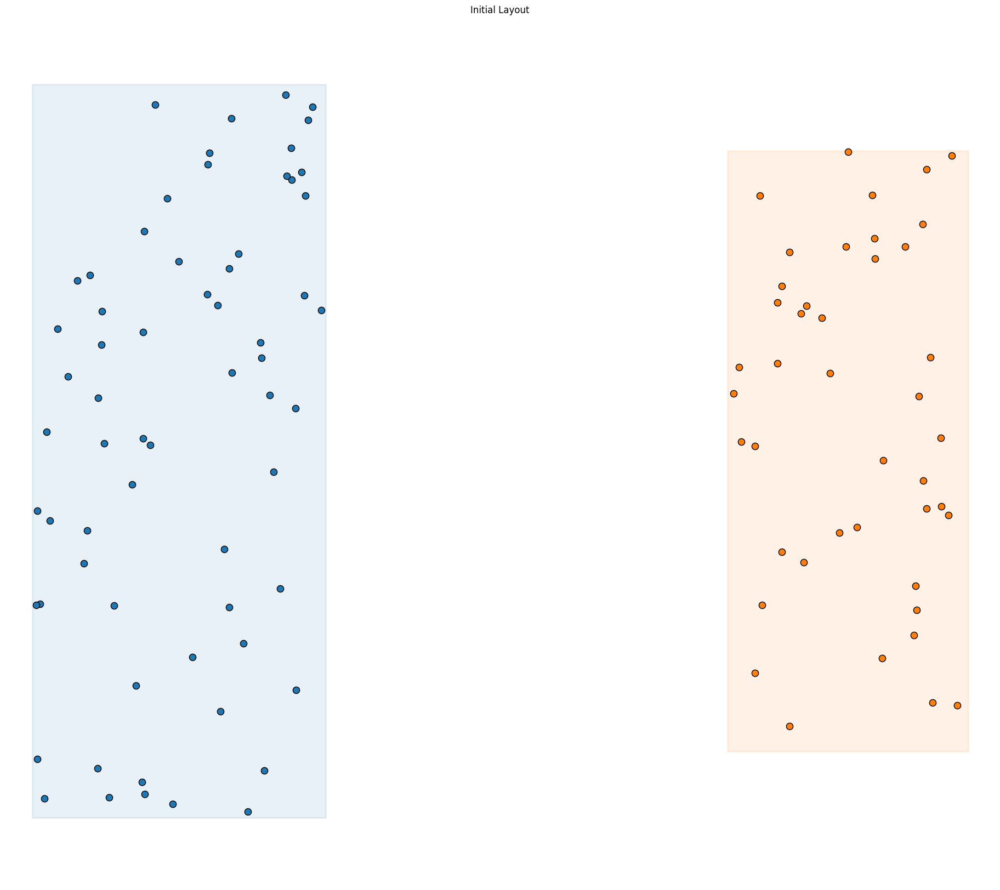

Subgraph 'Youngest Devonian Strata' converged at iteration 1 with max movement 0.000000
Subgraph 'Youngest Devonian Strata' newly converged at iteration 1
Subgraph 'Gap in the Sequence of Devonshi' converged at iteration 1 with max movement 0.000000
Subgraph 'Gap in the Sequence of Devonshi' newly converged at iteration 1


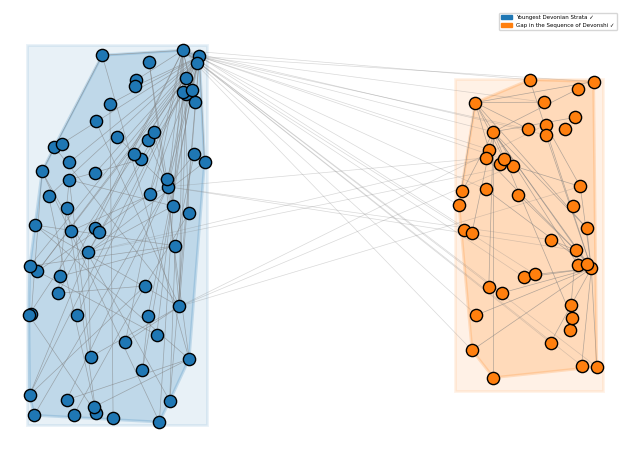

In [9]:

dot_file_path = data_name_3
subgraph_names = ["Youngest Devonian Strata", "Gap in the Sequence of Devonshi"]

# Process the DOT file and get subgraphs data
subgraphs_data = process_dot_file_for_subgraphs(dot_file_path, subgraph_names)

# array needed for further visualizations:
visualization_elements = []
# Visualize the subgraphs and get the graph and positions
G, pos, visualization_elements = draw_colorful_FDG_FR_inertia_subgraphs(
    subgraphs_data,
    output_name="devonshire_subgraphs_layout.png",
    iterations=300,
    display_node_id=False,
    save_frames=False,
    output_dir="../Output_subgraphs",
    separation_factor=2.0,
    subgraph_spacing=1.5,
    convergence_threshold=0.0005
)

In [10]:
# Get nodes in each cluster
cluster1_nodes = [node for node, attrs in subgraphs_data['subgraphs'][subgraph_names[0]]]
cluster2_nodes = [node for node, attrs in subgraphs_data['subgraphs'][subgraph_names[1]]]
inter_cluster_edges = [(u, v) for u, v in G.edges() if (u in cluster1_nodes and v in cluster2_nodes) or (u in cluster1_nodes and v in cluster2_nodes)]

In [11]:
def force_directed_edge_bundling(G, pos, P=7, S=0.03, I=50, compatibility_threshold=0.06):
    
    def edge_compatibility(e1, e2):
        return (angle_compatibility(e1, e2) * scale_compatibility(e1, e2) * position_compatibility(e1, e2) * visibility_compatibility(e1, e2))
    
    def angle_compatibility(e1, e2):
        v1 = pos[e1[1]] - pos[e1[0]]
        v2 = pos[e2[1]] - pos[e2[0]]
        norm1, norm2 = np.linalg.norm(v1), np.linalg.norm(v2)
        if norm1 == 0 or norm2 == 0:
            return 0
        cosine = np.dot(v1, v2) / (norm1 * norm2)
        return abs(cosine)
    
    def scale_compatibility(e1, e2):
        l1 = np.linalg.norm(pos[e1[1]] - pos[e1[0]])
        l2 = np.linalg.norm(pos[e2[1]] - pos[e2[0]])
        if l1 == 0 or l2 == 0:
            return 0
        return 2.0 / ((l1/l2) + (l2/l1))
    
    def position_compatibility(e1, e2):
        mid1 = (pos[e1[0]] + pos[e1[1]]) / 2.0
        mid2 = (pos[e2[0]] + pos[e2[1]]) / 2.0
        l1 = np.linalg.norm(pos[e1[1]] - pos[e1[0]])
        denom = l1 + np.linalg.norm(mid1 - mid2)
        return l1 / (denom + 1e-6)
    
    def visibility_compatibility(e1, e2):
        def project_point(p, a, b):
            ab = b - a
            t = np.dot(p - a, ab) / (np.dot(ab, ab) + 1e-6)
            return a + t * ab
        mid1 = (pos[e1[0]] + pos[e1[1]]) / 2.0
        mid2 = (pos[e2[0]] + pos[e2[1]]) / 2.0
        proj1 = project_point(mid1, pos[e2[0]], pos[e2[1]])
        d1 = np.linalg.norm(mid1 - proj1)
        l2 = np.linalg.norm(pos[e2[1]] - pos[e2[0]])
        return max(0, 1 - 2*d1/(l2 + 1e-6))
    
    # Control Points
    def initialize_control_points(e):
        cp = [pos[e[0]].copy()]
        for i in range(1, P+1):
            t = i / (P+1)
            cp.append((1-t) * pos[e[0]] + t * pos[e[1]])
        cp.append(pos[e[1]].copy())
        return cp

    # Force Functions
    def apply_spring_force(prev, current, next_, rest_length):
        force = np.zeros_like(current)
        for neighbor in (prev, next_):
            delta = neighbor - current
            dist = np.linalg.norm(delta)
            if dist != 0:
                force += (delta / dist) * (dist - rest_length)
        return force
    
    def apply_electrostatic_force(p, q, k=0.01):
        delta = q - p
        dist = np.linalg.norm(delta) + 1e-6
        return k * delta / (dist**2)
    edge_control_points = {e: initialize_control_points(e) for e in G.edges()}
    
    # Compatibility Calculation 
    edges_list = list(G.edges())
    compatible_edges = {}
    for e1 in edges_list:
        compatible_edges[e1] = []
        mid1 = (pos[e1[0]] + pos[e1[1]]) / 2.0
        for e2 in edges_list:
            if e1 == e2:
                continue
            comp = edge_compatibility(e1, e2)
            mid2 = (pos[e2[0]] + pos[e2[1]]) / 2.0
            if comp > compatibility_threshold and np.linalg.norm(mid1 - mid2) < max(np.linalg.norm(pos[e1[1]]-pos[e1[0]]), np.linalg.norm(pos[e2[1]]-pos[e2[0]])):
                compatible_edges[e1].append(e2)
    
    # -- Iterative Simulation --
    for _ in range(I):
        new_edge_control_points = {}
        for e in edges_list:
            cp = edge_control_points[e]
            new_cp = [cp[0].copy()] 
            total_length = np.linalg.norm(pos[e[1]] - pos[e[0]])
            rest_length = total_length / (P+1)

            for i in range(1, len(cp)-1):
                force = np.zeros_like(cp[i])
                force += apply_spring_force(cp[i-1], cp[i], cp[i+1], rest_length)
                
                for e2 in compatible_edges[e]:
                    force += apply_electrostatic_force(cp[i], edge_control_points[e2][i])
                
                new_point = cp[i] + S * force
                new_cp.append(new_point)
            new_cp.append(cp[-1].copy())  
            new_edge_control_points[e] = new_cp
        edge_control_points = new_edge_control_points

    return edge_control_points

def apply_fdeb_to_inter_cluster_edges(G, pos, cluster1, cluster2, **kwargs):
    inter_cluster_edges = [(u, v) for u, v in G.edges() if (u in cluster1 and v in cluster2) or (u in cluster2 and v in cluster1)]
    subG = G.edge_subgraph(inter_cluster_edges).copy()
    return force_directed_edge_bundling(subG, pos, **kwargs)

In [12]:
def actual_drawing_boundled(subgraph_name, region, color_map, nodes, subgraph_nodes, pos, edges, node_to_subgraph, node_size, font_size, edge_width, view_x_min, view_x_max, view_y_min, view_y_max, save_frames, full_output_dir, frame_count, subgraph_regions, subgraph_converged, max_movement_by_subgraph, num_subgraphs, iteration, display_node_id, bundled_edges):
    # Draw the graph at intervals or when a subgraph converges
    plt.clf()
    
    # Set fixed axis limits to maintain consistent zoom
    plt.xlim(view_x_min, view_x_max)
    plt.ylim(view_y_min, view_y_max)
    
    # Draw region boundaries
    for subgraph_name, region in subgraph_regions.items():
        color = color_map[subgraph_name]
        rect = Rectangle(
            (region['x_min'], region['y_min']),
            region['width'], region['height'],
            fill=True, alpha=0.1, linewidth=2,
            edgecolor=color, facecolor=color, zorder=0
        )
        plt.gca().add_patch(rect)
    
    # Draw subgraph convex hulls
    for subgraph_name, sg_node_list in subgraph_nodes.items():
        if sg_node_list:
            # Get positions of all nodes in this subgraph
            x_coords = [pos[node][0] for node in sg_node_list]
            y_coords = [pos[node][1] for node in sg_node_list]
            
            if x_coords and y_coords and len(x_coords) > 2:
                try:
                    # Calculate the convex hull
                    points = np.vstack((x_coords, y_coords)).T
                    hull = ConvexHull(points)
                    hull_points = points[hull.vertices]
                    
                    # Draw hull
                    color = color_map[subgraph_name]
                    polygon = Polygon(hull_points, fill=True, alpha=0.2, 
                                     facecolor=color, edgecolor=color, 
                                     linewidth=2, zorder=0.5)
                    plt.gca().add_patch(polygon)
                except:
                    pass  # Skip hull drawing if it fails
    
    # list of bundled edges
    il_edges = list(bundled_edges.keys())
    il_edges

    # Draw all edges
    for u, v in edges:
        # Skip if this edge is already in the bundled edges
        if (u, v) in il_edges or (v, u) in il_edges:
            continue
        # Get edge type for styling
        #edge_type = G.edges[u, v].get('edge_type', 'default')
        color = 'gray'
        linestyle = '-'
        
        
        # Cross-subgraph edges are fainter
        alpha = 0.3 if node_to_subgraph[u] != node_to_subgraph[v] else 0.6
        
        plt.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]], 
                color=color, alpha=alpha, zorder=1, 
                linewidth=edge_width, linestyle=linestyle)
        
    # Draw bundled edges
    for e, control_points in bundled_edges.items():
        xs, ys = zip(*control_points)
        plt.plot(xs, ys, color='orange', alpha=0.6, zorder=1)
    
    # Draw nodes
    for node in nodes:
        # Get node attributes
        node_type = G.nodes[node].get('type', '')
        subgraph_name = node_to_subgraph[node]
        marker = 'o'
        
        # Get color from subgraph
        node_color = color_map[subgraph_name]
        
        plt.scatter(pos[node][0], pos[node][1], 
                   s=node_size, color=node_color, 
                   edgecolor='black', zorder=2, marker=marker)
        
        # Display node labels if requested
        if display_node_id:
            # Use node title as label if available, otherwise use node ID
            label = G.nodes[node].get('title', node)
            if len(label) > 20:
                label = label[:17] + "..."
            plt.text(pos[node][0], pos[node][1], label, 
                    ha='center', va='center', fontsize=font_size, 
                    fontname='sans-serif', zorder=3)
    
    # Add legends
    legend_patches = []
    for subgraph_name, color in color_map.items():
        # Add convergence status to the legend
        status = "✓" if subgraph_converged[subgraph_name] else f"({max_movement_by_subgraph[subgraph_name]:.4f})"
        legend_patches.append(Patch(color=color, label=f"{subgraph_name} {status}"))
    
    plt.legend(handles=legend_patches, loc='best', fontsize=font_size)
    
    
    plt.axis('off')
    plt.tight_layout()
    
    # Save the current frame if requested
    if save_frames:
        frame_path = os.path.join(full_output_dir, f"subgraph_layout_iter_{frame_count:04d}.png")
        plt.savefig(frame_path, dpi=150)
        print(f"Saved frame {frame_count} to {frame_path}")
    
    # Pause to allow interface update
    plt.pause(0.01)

In [13]:

def smooth_edge(x_coords, y_coords, kernel_width=11, sigma=2):

    # Generate Gaussian kernel
    kernel = gaussian(kernel_width, std=sigma)
    kernel /= kernel.sum()  # Normalize the kernel so weights add to one

    # Convolve x and y coordinates with the kernel
    smoothed_x = convolve(x_coords, kernel, mode='same')
    smoothed_y = convolve(y_coords, kernel, mode='same')

    # Fix boundary conditions: keep edge endpoints fixed
    smoothed_x[0], smoothed_x[-1] = x_coords[0], x_coords[-1]
    smoothed_y[0], smoothed_y[-1] = y_coords[0], y_coords[-1]

    return smoothed_x, smoothed_y

def resample_edge(x_coords, y_coords, num_points=100):

    # Compute cumulative distance along the edge
    distances = np.sqrt(np.diff(x_coords)**2 + np.diff(y_coords)**2)
    cumulative_distances = np.insert(np.cumsum(distances), 0, 0)

    # Generate equally spaced distances
    equally_spaced_distances = np.linspace(0, cumulative_distances[-1], num_points)

    # Interpolate x and y coordinates at equally spaced distances
    resampled_x = np.interp(equally_spaced_distances, cumulative_distances, x_coords)
    resampled_y = np.interp(equally_spaced_distances, cumulative_distances, y_coords)

    return resampled_x, resampled_y

def perform_additional_smoothing(edge_control_points, smooth_iterations=2, kernel_width=7, sigma=1.5):

    # We can reuse the smooth_bundled_edges function for additional smoothing
    further_smoothed_edges = smooth_bundled_edges(edge_control_points, iterations=smooth_iterations, kernel_width=kernel_width, sigma=sigma)
    
    # Optionally resample points to ensure equal spacing after additional smoothing
    resampled_smoothed_edges = resample_edge_points(further_smoothed_edges)
    
    return resampled_smoothed_edges

# Complete workflow function that includes initial bundling, smoothing, and additional smoothing
def complete_edge_bundling_workflow(G, pos, cluster1, cluster2, fdeb_params={'P': 6, 'S': 0.03, 'I': 50, 'compatibility_threshold': 0.06},
                                   initial_smoothing={'iterations': 2, 'kernel_width': 5, 'sigma': 1}, additional_smoothing={'iterations': 2, 'kernel_width': 7, 'sigma': 1.5}):

    #Extracting inter-cluster edges
    inter_cluster_edges = [(u, v) for u, v in G.edges() if (u in cluster1 and v in cluster2) or (u in cluster2 and v in cluster1)]
    subgraph = G.edge_subgraph(inter_cluster_edges).copy()
    
    # Applying force-directed edge bundling
    bundled_edges = force_directed_edge_bundling(subgraph, pos, **fdeb_params)
    
    # Applying initial smoothing
    initially_smoothed_edges = smooth_bundled_edges(bundled_edges, **initial_smoothing)
    initially_smoothed_edges = resample_edge_points(initially_smoothed_edges)
    
    # Applying additional smoothing
    further_smoothed_edges = perform_additional_smoothing(initially_smoothed_edges, **additional_smoothing)
    
    return further_smoothed_edges


def smooth_bundled_edges(edge_control_points, iterations=1, kernel_width=5, sigma=1):

    # Ensure kernel width is odd
    if kernel_width % 2 == 0:
        kernel_width += 1
    
    # Create and normalize Gaussian kernel
    kernel = scipy.signal.windows.gaussian(kernel_width, std=sigma)
    kernel = kernel / np.sum(kernel)  # Normalize to ensure weights sum to 1
    
    smoothed_control_points = {}
    
    for edge, points in edge_control_points.items():
        # Convert list of points to separate arrays of x and y coordinates
        x_coords = np.array([p[0] for p in points])
        y_coords = np.array([p[1] for p in points])
        
        # Save the original endpoints
        start_point = x_coords[0], y_coords[0]
        end_point = x_coords[-1], y_coords[-1]
        
        # Apply smoothing for the specified number of iterations
        for _ in range(iterations):
            # Smooth x and y coordinates separately
            x_smoothed = smooth_coordinates(x_coords, kernel)
            y_smoothed = smooth_coordinates(y_coords, kernel)
            
            # Update coordinates
            x_coords = x_smoothed
            y_coords = y_smoothed
            
            # Restore the original endpoints (they should remain fixed)
            x_coords[0], y_coords[0] = start_point
            x_coords[-1], y_coords[-1] = end_point
        
        # Convert back to list of points
        smoothed_points = [np.array([x, y]) for x, y in zip(x_coords, y_coords)]
        smoothed_control_points[edge] = smoothed_points
    
    return smoothed_control_points

def smooth_coordinates(coords, kernel):

    n = len(coords)
    k = len(kernel) // 2  # Half-width of kernel
    smoothed = np.zeros_like(coords)
    
    for i in range(n):
        # Determine valid indices for kernel application
        start_idx = max(0, i - k)
        end_idx = min(n, i + k + 1)
        kernel_start = k - (i - start_idx)
        kernel_end = k + (end_idx - i)
        
        # Extract valid portion of kernel
        valid_kernel = kernel[kernel_start:kernel_end]
        
        # Normalize the valid portion of kernel to ensure weights sum to 1
        valid_kernel = valid_kernel / np.sum(valid_kernel)
        
        # Compute weighted average using valid portions
        smoothed[i] = np.sum(valid_kernel * coords[start_idx:end_idx])
    
    return smoothed

def resample_edge_points(edge_control_points, num_points=None):

    resampled_points = {}
    
    for edge, points in edge_control_points.items():
        if num_points is None:
            num_points = len(points)
        
        # Calculate the total length of the path
        total_length = 0
        segments = []
        
        for i in range(len(points) - 1):
            segment_length = np.linalg.norm(points[i+1] - points[i])
            total_length += segment_length
            segments.append((points[i], points[i+1], segment_length))
        
        # Resample points at equal distances
        resampled = [points[0]]  # Start with the original first point
        
        for i in range(1, num_points - 1):
            target_length = total_length * i / (num_points - 1)
            
            # Find the segment containing this point
            current_length = 0
            for start, end, length in segments:
                if current_length + length >= target_length:
                    # Interpolate within this segment
                    ratio = (target_length - current_length) / length
                    new_point = start + ratio * (end - start)
                    resampled.append(new_point)
                    break
                current_length += length
        
        resampled.append(points[-1])  # End with the original last point
        resampled_points[edge] = resampled
    
    return resampled_points

# Augment the apply_fdeb_to_inter_cluster_edges function to include smoothing
def apply_fdeb_with_smoothing(G, pos, cluster1, cluster2, smooth_iterations=2, kernel_width=5, sigma=1, **kwargs):

    # First apply FDEB
    bundled_edges = apply_fdeb_to_inter_cluster_edges(G, pos, cluster1, cluster2, **kwargs)
    
    # Then smooth the results
    smoothed_edges = smooth_bundled_edges(bundled_edges, iterations=smooth_iterations, 
                                          kernel_width=kernel_width, sigma=sigma)
    
    # Resample the points to ensure equal spacing
    resampled_edges = resample_edge_points(smoothed_edges)
    
    return resampled_edges


## step 6:

In [14]:
def data_processing(data_name):
    """
    Processes the input data file and returns a list of nodes and edges adm their dictionaries.
    
    Input:
    - data_name: The name of the input data file (DOT format)
    """
    # Load the graph directly with NetworkX
    dataforfile = os.path.basename(data_name) #used for file creation
    nx_graph = nx.nx_pydot.read_dot(data_name)

    # Check graph type
    is_directed = nx.is_directed(nx_graph)
    print(f"Graph is {'directed' if is_directed else 'undirected'}")

    # Extract nodes and edges and their attributes
    nodes = nx_graph.nodes(data=True)
    edges = nx_graph.edges(data=True)

    # Create an array of dictionaries, one for each edge
    edges_dict = []
    for source, target, attrs in edges:
        # Add the original edge direction
        edge_dict = {
            "edge_nodes": (source, target),
            "directed": is_directed
        }

        # Add all attributes from the attrs dictionary
        for attr_name, attr_value in attrs.items():    
            edge_dict[attr_name] = attr_value

        edges_dict.append(edge_dict)

        # For undirected graphs, add the reverse edge as well
        if not is_directed:
            reverse_edge_dict = {
                "edge_nodes": (target, source),
                "directed": is_directed
            }

            # Copy all attributes from the original edge
            for attr_name, attr_value in attrs.items():    
                reverse_edge_dict[attr_name] = attr_value

            edges_dict.append(reverse_edge_dict)

    nodes_dict = []
    for node_id, attrs in nodes:
        node_dict = {
            "node_id": node_id
        }

        # Add all attributes from the attrs dictionary
        for attr_name, attr_value in attrs.items():        
            node_dict[attr_name] = attr_value

        nodes_dict.append(node_dict)

    # Basic graph information
    print(f"Number of nodes: {len(nodes)}")
    if is_directed:
        print(f"Number of edges: {len(edges)}")
    else:
        print(f"Original Number of Edges:  {len(edges)} \n -- after doubling edges -- \nNumber of edges: {len(edges) * (2 if not is_directed else 1)}")

    return nodes_dict, edges_dict, nodes, edges


def floyd_warshall(nodes_dict, edges_dict):
    """
    Implements the Floyd-Warshall algorithm to find shortest paths between all pairs of nodes in a graph.
    
    Input:
    - nodes_dict: A list of dictionaries where each dict contains 'node_id' and other attributes
    - edges_dict: A list of dictionaries where each dict contains 'edge_nodes' (source, target) tuple
                  and other attributes including possibly weight information
    
    Output:
    - distance_matrix: A 2D matrix where distance_matrix[i][j] is the shortest path distance from node i to node j
    - node_ids: The list of node IDs in the order they appear in the distance matrix
    
    Algorithm explanation:
    The Floyd-Warshall algorithm finds shortest paths between all pairs of nodes by:
    1. Initializing a distance matrix D with infinity for all non-adjacent nodes
    2. Setting D[i,i] = 0 for all nodes (distance from a node to itself)2
    3. Setting D[i,j] = weight for each direct edge (i,j)
    4. Considering each node k as a potential intermediate in paths between i and j
    5. If going through k yields a shorter path, updating D[i,j] accordingly
    
    Time Complexity: O(|V|³) where |V| is the number of nodes
    """
    
    # Extract node IDs from nodes_dict
    node_ids = [node['node_id'] for node in nodes_dict]
    n = len(node_ids)
    
    # Create node to index mapping for the matrix
    node_to_idx = {node_id: i for i, node_id in enumerate(node_ids)}
    
    # Initialize distance matrix with infinity
    distance_matrix = [[float('inf') for _ in range(n)] for _ in range(n)]
    
    # Set diagonal elements to 0 (distance from a node to itself)
    for i in range(n):
        distance_matrix[i][i] = 0
    
    # Set edge weights
    for edge in edges_dict:
        source, target = edge['edge_nodes']
        
        # Clean up node IDs (remove quotes if present)
        source = source.strip('"')
        target = target.strip('"')
        
        if source in node_to_idx and target in node_to_idx:
            # Determine the weight - look for a weight attribute, default to 1 if not found
            weight = 1
            if 'weight' in edge:
                try:
                    weight = float(edge['weight'].strip('"'))
                except (ValueError, AttributeError):
                    weight = 1
            elif 'len' in edge:
                try:
                    weight = float(edge['len'].strip('"'))
                except (ValueError, AttributeError):
                    weight = 1
                
            i, j = node_to_idx[source], node_to_idx[target]
            distance_matrix[i][j] = weight
            
            # If the graph is undirected, add the reverse edge as well
            # Uncomment this if your graph is undirected
            # distance_matrix[j][i] = weight
    
    # Floyd-Warshall algorithm
    for k in range(n):
        for i in range(n):
            for j in range(n):
                if distance_matrix[i][j] > distance_matrix[i][k] + distance_matrix[k][j]:
                    distance_matrix[i][j] = distance_matrix[i][k] + distance_matrix[k][j]
    
    return distance_matrix, node_ids
    
def plot_coloured_distance_matrix(distance_matrix, node_ids=None, cmap='viridis_r', figsize=(10, 8)):
    """
    Visualizes the distance matrix from Floyd-Warshall algorithm as a heatmap with annotations.
    
    Parameters:
    - distance_matrix: 2D matrix of shortest path distances between all pairs of nodes
    - node_ids: List of node IDs in the order they appear in the distance matrix (optional)
    - cmap: Colormap to use for the heatmap (default: 'viridis_r')
    - figsize: Figure size (width, height) in inches
    
    Returns:
    - matplotlib figure and axes objects
    """
    
    # Convert to numpy array if not already
    distance_matrix = np.array(distance_matrix)
    
    # Create a masked array for infinity values
    mask = np.isinf(distance_matrix)
    masked_matrix = np.ma.masked_array(distance_matrix, mask)
    
    # Create figure and axes
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot heatmap
    im = ax.imshow(masked_matrix, cmap=cmap)
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Shortest Path Distance')
    
    # Set title and labels
    ax.set_title('Shortest Path Distances (Floyd-Warshall Algorithm)')
    
    if node_ids is not None:
        # Clean node IDs (remove quotes if present)
        clean_node_ids = [nid.strip('"') if isinstance(nid, str) else nid for nid in node_ids]
        
        # Only show node labels if there are not too many
        if len(node_ids) <= 30:
            ax.set_xticks(np.arange(len(node_ids)))
            ax.set_yticks(np.arange(len(node_ids)))
            ax.set_xticklabels(clean_node_ids, rotation=45, ha='right')
            ax.set_yticklabels(clean_node_ids)
    
    ax.set_xlabel('Destination Node')
    ax.set_ylabel('Source Node')
    
    # Add text annotations with distances
    if distance_matrix.shape[0] <= 20:  # Only add annotations for smaller matrices
        for i in range(distance_matrix.shape[0]):
            for j in range(distance_matrix.shape[1]):
                value = distance_matrix[i, j]
                text = 'Inf' if np.isinf(value) else f'{value:.1f}'
                text_color = 'white' if not np.isinf(value) and value > np.nanmean(masked_matrix) else 'black'
                ax.text(j, i, text, ha='center', va='center', color=text_color)
    
    # Add a grid to better separate cells
    ax.set_xticks(np.arange(distance_matrix.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(distance_matrix.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=1)
    
    plt.tight_layout()
    return fig, ax

def folder_for_projections(file_name):
    # Define the base output directory one level up from current directory
    parent_dir = os.path.dirname(os.getcwd())
    output_dir = os.path.join(parent_dir, "Step6_outputs-" + file_name[11:])

    # Define subdirectories
    subdirs = ["MDS", "tSNE", "ISOMAP"]

    # Create main output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Created main directory: {output_dir}")

    # Create subdirectories
    for subdir in subdirs:
        subdir_path = os.path.join(output_dir, subdir)
        if not os.path.exists(subdir_path):
            os.makedirs(subdir_path)
            print(f"Created directory: {subdir_path}")

        # Create 2D and 3D folders inside ISOMAP
        if subdir == "ISOMAP":
            for dimension in ["2D", "3D"]:
                dimension_path = os.path.join(subdir_path, dimension)
                if not os.path.exists(dimension_path):
                    os.makedirs(dimension_path)
                    print(f"Created directory: {dimension_path}")
        
    return output_dir

def mds_2d_projection(distance_matrix, node_ids, edges, output_dir):
    """
    Performs MDS projection on the distance matrix and saves the results.
    
    Input:
    - distance_matrix: The distance matrix from floyd_warshall
    - node_ids: The list of node IDs from floyd_warshall
    - output_dir: Directory to save the MDS plot
    - n_components: Number of dimensions for MDS (default is 2)
    
    Output:
    - 
    """ 
    mds = MDS(n_components=2, dissimilarity='precomputed')

    # Fit the MDS model to your data
    mds_distance_matrix_reduced = mds.fit_transform(distance_matrix)

    print('Dimesnion of X after MDS = ',mds_distance_matrix_reduced.shape)

    # Plot the reduced data
    plt.figure(figsize=(10, 8))
    plt.scatter(mds_distance_matrix_reduced[:, 0], mds_distance_matrix_reduced[:, 1], s=50)

    # add edges
    for edge in edges:
        source, target, _ = edge
        source = source.strip('"')
        target = target.strip('"')

        # Get the indices of the source and target nodes
        source_idx = node_ids.index(source)
        target_idx = node_ids.index(target)

        # Get the coordinates of the source and target nodes
        source_coords = mds_distance_matrix_reduced[source_idx]
        target_coords = mds_distance_matrix_reduced[target_idx]

        # Plot the edge
        plt.plot([source_coords[0], target_coords[0]], [source_coords[1], target_coords[1]], 'k-', alpha=0.1)

    # Add labels for each point
    for i in range(len(mds_distance_matrix_reduced)):
        node_label = str(i+1)  # Adjust if you have actual node IDs
        plt.annotate(node_label, 
                     (mds_distance_matrix_reduced[i, 0], mds_distance_matrix_reduced[i, 1]), 
                     fontsize=12)

    plt.title("MDS of the Distance Matrix \n n_components = 2")
    plt.xlabel("First MDS Component")
    plt.ylabel("Second MDS Component")
    plt.grid(True)

    # Save the plot
    # Function to get next available file number
    def get_next_file_number():
        existing_files = [f for f in os.listdir(output_dir) 
                         if f.startswith('mds_visualization_') and f.endswith('.png')]
        if not existing_files:
            return 1
        numbers = [int(f.split('_')[2].split('.')[0]) for f in existing_files]
        return max(numbers) + 1

    # Save the plot with incremental number
    file_number = get_next_file_number()
    output_file = os.path.join(output_dir, f"MDS/mds_visualization_{file_number}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')

    # Show the plot after saving
    plt.show()

    print(f"Plot saved as: {output_file}")

    return mds_distance_matrix_reduced

def tsne_2d_projection(distance_matrix_np, node_ids, edges, output_dir, perplexity, angle):
    tsne = TSNE(
        n_components=2,           # Reduced to 2 dimensions
        metric='precomputed',     # This is crucial - tells t-SNE we're providing distances
        learning_rate='auto',     
        init='random',            
        perplexity= perplexity,  # Default is 30
        angle=angle,  
        random_state=42)

    # Apply t-SNE to the NumPy array version of the distance matrix
    tsne_distance_matrix_reduced = tsne.fit_transform(distance_matrix_np)
    print('Dimesnion of X after t-SNE = ', tsne_distance_matrix_reduced.shape)
    # Get t-SNE parameters for the title
    tsne_params = f"perplexity={tsne.perplexity}, learning_rate={tsne.learning_rate}, n_components={tsne.n_components}, method={tsne.method}"
    # Visualize the result
    plt.figure(figsize=(10, 8))
    plt.scatter(tsne_distance_matrix_reduced[:, 0], tsne_distance_matrix_reduced[:, 1], s=100)
    # add edges
    for edge in edges:
        source, target, _ = edge
        source = source.strip('"')
        target = target.strip('"')
        # Get the indices of the source and target nodes
        source_idx = node_ids.index(source)
        target_idx = node_ids.index(target)
        # Get the coordinates of the source and target nodes
        source_coords = tsne_distance_matrix_reduced[source_idx]
        target_coords = tsne_distance_matrix_reduced[target_idx]
        # Plot the edge
        plt.plot([source_coords[0], target_coords[0]], [source_coords[1], target_coords[1]], 'k-', alpha=0.1)
    
    # Add labels for each point
    for i in range(len(tsne_distance_matrix_reduced)):
        node_label = str(i+1)  # Adjust if you have actual node IDs
        plt.annotate(node_label, 
                     (tsne_distance_matrix_reduced[i, 0], tsne_distance_matrix_reduced[i, 1]), 
                     fontsize=12)
    plt.title(f't-SNE Projection of Distance Matrix\n({tsne_params})')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.grid(True)
    
    # Function to get next available file number
    def get_next_file_number():
        existing_files = [f for f in os.listdir(output_dir) 
                         if f.startswith('tSNE_visualization_') and f.endswith('.png')]
        if not existing_files:
            return 1
        numbers = [int(f.split('_')[2].split('.')[0]) for f in existing_files]
        return max(numbers) + 1
    
    # Save the plot with incremental number
    file_number = get_next_file_number()
    output_file = os.path.join(output_dir, f"tSNE/tsne_visualization_{file_number}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')

    # Show the plot after saving
    plt.show()
    print(f"Plot saved as: {output_file}")

    return tsne_distance_matrix_reduced


def isomap_2d_projection(distance_matrix_np, node_ids, edges, output_dir, n_neighbors = 60):

    # Create Isomap object
    isomap = Isomap(
        n_components=2,          # Reduce to 2 dimensions
        metric='precomputed',    # Indicate we're using a precomputed distance matrix
        n_neighbors=n_neighbors          # Number of neighbors to consider for each point
    )

    # Apply Isomap to the distance matrix
    isomap_results = isomap.fit_transform(distance_matrix_np)
    print('Dimension of X after Isomap =', isomap_results.shape)

    # Get ISOMAP parameters for the title
    isomap_params = f"n_components={isomap.n_components}, n_neighbors={isomap.n_neighbors}"

    # Visualize the results
    plt.figure(figsize=(10, 8))
    plt.scatter(isomap_results[:, 0], isomap_results[:, 1], s=100)

    # add edges
    for edge in edges:
        source, target, _ = edge
        source = source.strip('"')
        target = target.strip('"')

        # Get the indices of the source and target nodes
        source_idx = node_ids.index(source)
        target_idx = node_ids.index(target)

        # Get the coordinates of the source and target nodes
        source_coords = isomap_results[source_idx]
        target_coords = isomap_results[target_idx]

        # Plot the edge
        plt.plot([source_coords[0], target_coords[0]], [source_coords[1], target_coords[1]], 'k-', alpha=0.1)

    # Add labels for each point
    for i in range(len(isomap_results)):
        node_label = str(i+1)  # Adjust if you have actual node IDs
        plt.annotate(node_label, 
                    (isomap_results[i, 0], isomap_results[i, 1]), 
                    fontsize=12)

    plt.title(f'ISOMAP Projection of Distance Matrix\n({isomap_params})')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.grid(True)
    plt.tight_layout()
    
    # Function to get next available file number
    def get_next_file_number():
        existing_files = [f for f in os.listdir(output_dir) 
                         if f.startswith('"ISOMAP/2D/ISOMAP_visualization_') and f.endswith('.png')]
        if not existing_files:
            return 1
        numbers = [int(f.split('_')[2].split('.')[0]) for f in existing_files]
        return max(numbers) + 1

    # Save the plot with incremental number and parameters
    file_number = get_next_file_number()
    output_file = os.path.join(output_dir, 
                              f"ISOMAP/2D/ISOMAP_visualization_{file_number}_comp{isomap.n_components}_neigh{isomap.n_neighbors}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')

    # Show the plot after saving
    plt.show()

    print(f"Plot saved in 2D folder as: {output_file}")

    return isomap_results


def isomap_3d_projection(distance_matrix_np, node_ids, edges, output_dir, n_neighbors=60):

    # Create Isomap object
    isomap = Isomap(
        n_components=3,          # Reduce to 3 dimensions
        metric='precomputed',    # Indicate we're using a precomputed distance matrix
        n_neighbors= n_neighbors            # Number of neighbors to consider for each point
    )

    # Apply Isomap to the distance matrix
    isomap_results = isomap.fit_transform(distance_matrix_np)
    print('Dimension of X after Isomap =', isomap_results.shape)


    # plot isomap 3D with possibility to rotate the view point
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(isomap_results[:, 0], isomap_results[:, 1], isomap_results[:, 2], s=50)

    # add edges
    for edge in edges:
        source, target, _ = edge
        source = source.strip('"')
        target = target.strip('"')

        # Get the indices of the source and target nodes
        source_idx = node_ids.index(source)
        target_idx = node_ids.index(target)

        # Get the coordinates of the source and target nodes
        source_coords = isomap_results[source_idx]
        target_coords = isomap_results[target_idx]

        # Plot the edge
        ax.plot([source_coords[0], target_coords[0]], [source_coords[1], target_coords[1]], [source_coords[2], target_coords[2]], 'k-', alpha=0.2)

    # Add labels for each point
    for i in range(len(isomap_results)):
        node_label = str(i+1)  # Adjust if you have actual node IDs
        ax.text(isomap_results[i, 0], isomap_results[i, 1], isomap_results[i, 2], node_label, fontsize=6)

    # Get ISOMAP parameters for the title
    isomap_params = f"n_components={isomap.n_components}, n_neighbors={isomap.n_neighbors}"

    # Set title and labels
    ax.set_title(f'3D ISOMAP Projection\n({isomap_params})')
    ax.set_xlabel('Dimension 1')
    ax.set_ylabel('Dimension 2')
    ax.set_zlabel('Dimension 3')

    # Function to get next available file number
    def get_next_file_number():
        existing_files = [f for f in os.listdir(output_dir) 
                         if f.startswith('ISOMAP/3D/ISOMAP_3D_') and f.endswith('.png')]
        if not existing_files:
            return 1
        numbers = [int(f.split('_')[2].split('.')[0]) for f in existing_files]
        return max(numbers) + 1

    # Save the plot with incremental number and parameters
    file_number = get_next_file_number()
    output_file = os.path.join(output_dir, 
                              f"ISOMAP/3D/ISOMAP_3D_{file_number}_comp{isomap.n_components}_neigh{isomap.n_neighbors}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')

    plt.show()

    print(f"3D plot saved as: {output_file}")

    return isomap_results

## step 7

In [15]:
def normalized_stress(distance_matrix, dr_matrix):
    """
    Calculate the normalized stress quality metric between original distance matrix
    and its lower-dimensional projection.
    
    Parameters:
    -----------
    distance_matrix : numpy.ndarray
        Original distance matrix with shape (n_samples, n_samples)
    dr_matrix : numpy.ndarray
        Projected lower-dimensional coordinates with shape (n_samples, n_dimensions)
    
    Returns:
    --------
    float
        Normalized stress value (lower is better, range [0,1] where 0 is perfect)
    """
    
    n_samples = distance_matrix.shape[0]
    
    numerator = 0.0
    denominator = 0.0
    
    # Iterate over all pairs of points (i,j) where i < j to avoid duplicates
    for i in range(n_samples):
        for j in range(i+1, n_samples):
            # Original distance (already computed)
            dist_original = np.sqrt(np.sum((distance_matrix[i] - distance_matrix[j])**2))
            
            # Calculate Euclidean distance in projected space
            dist_projected = np.sqrt(np.sum((dr_matrix[i] - dr_matrix[j])**2))
            
            # Accumulate to numerator and denominator
            numerator += (dist_original - dist_projected)**2
            denominator += dist_original**2
    
    if denominator == 0:
        return float('inf')  # Avoid division by zero
    
    normalized_stress_value = numerator / denominator
    
    return normalized_stress_value

def plot_shepard_diagram(distance_matrix, dr_matrix, save_path=None):
    """
    Create a Shepard diagram to visualize how well the dimensionality reduction
    preserves the original distances.
    
    Parameters:
    -----------
    distance_matrix : numpy.ndarray
        Original distance matrix with shape (n_samples, n_samples)
    dr_matrix : numpy.ndarray
        Projected lower-dimensional coordinates with shape (n_samples, n_dimensions)
    save_path : str, optional
        Path to save the diagram. If None, the diagram is not saved.
    
    Returns:
    --------
    fig, ax : matplotlib figure and axes objects
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.stats import linregress
    
    n_samples = distance_matrix.shape[0]
    
    # Compute all pairwise distances in the projected space
    projected_distances = []
    original_distances = []
    
    for i in range(n_samples):
        for j in range(i+1, n_samples):  # Only unique pairs
            # Get original distance
            original_dist = np.sqrt(np.sum((distance_matrix[i] - distance_matrix[j])**2))
            
            # Calculate projected distance
            projected_dist = np.sqrt(np.sum((dr_matrix[i] - dr_matrix[j])**2))
            
            original_distances.append(original_dist)
            projected_distances.append(projected_dist)
    
    # Convert to numpy arrays
    original_distances = np.array(original_distances)
    projected_distances = np.array(projected_distances)
    
    # Create the scatter plot
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Plot scatter points
    ax.scatter(original_distances, projected_distances, alpha=0.5, s=10)
    
    # Add y=x reference line
    max_dist = max(np.max(original_distances), np.max(projected_distances))
    ax.plot([0, max_dist], [0, max_dist], 'r--', label='Perfect preservation (y=x)')
    
    # Calculate linear regression line
    slope, intercept, r_value, _, _ = linregress(original_distances, projected_distances)
    ax.plot(original_distances, slope * original_distances + intercept, 'g-', 
            label=f'Linear fit (angular coefficient={r_value:.3f})')
    
    # Add labels and title
    ax.set_xlabel('Original Distances')
    ax.set_ylabel('Projected Distances')
    ax.set_title('Shepard Diagram: Original vs. Projected Distances')
    ax.grid(True)
    ax.legend()
    
    # title
    ax.set_title(f'Shepard Diagram: Original vs. Projected Distances')
    
    # Save figure if path is provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.tight_layout()
    return fig, ax

def trustworthiness(distance_matrix, reduced_matrix, n_neighbors=5):
    """
    Calculate the trustworthiness of a dimensionality reduction.
    
    Trustworthiness measures if the points that appear close in the low-dimensional 
    projection were also close in the original high-dimensional space.
    
    Parameters:
    -----------
    distance_matrix : numpy.ndarray
        Original data points or distance representation with shape (n_samples, n_features)
    reduced_matrix : numpy.ndarray
        Projected low-dimensional data with shape (n_samples, n_features_low)
    n_neighbors : int, optional (default=5)
        Number of neighbors to consider
        
    Returns:
    --------
    float
        Trustworthiness score between 0 and 1 (1 is perfect trustworthiness)
    """
    
    n_samples = distance_matrix.shape[0]
    
    # Compute pairwise distances in high-dimensional space
    high_dist_matrix = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(i+1, n_samples):
            dist = np.sqrt(np.sum((distance_matrix[i] - distance_matrix[j])**2))
            high_dist_matrix[i, j] = dist
            high_dist_matrix[j, i] = dist
    
    # Compute pairwise distances in low-dimensional space
    low_dist_matrix = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(i+1, n_samples):
            dist = np.sqrt(np.sum((reduced_matrix[i] - reduced_matrix[j])**2))
            low_dist_matrix[i, j] = dist
            low_dist_matrix[j, i] = dist
    
    # Find k-nearest neighbors in high-dimensional space
    high_neighbors = np.zeros((n_samples, n_neighbors), dtype=int)
    for i in range(n_samples):
        # Get distances from point i to all other points
        dist_i = high_dist_matrix[i].copy()
        # Set distance to self to infinity to exclude it
        dist_i[i] = np.inf
        # Find indices of k nearest neighbors
        high_neighbors[i] = np.argsort(dist_i)[:n_neighbors]
    
    # Find k-nearest neighbors in low-dimensional space
    low_neighbors = np.zeros((n_samples, n_neighbors), dtype=int)
    for i in range(n_samples):
        # Get distances from point i to all other points
        dist_i = low_dist_matrix[i].copy()
        # Set distance to self to infinity to exclude it
        dist_i[i] = np.inf
        # Find indices of k nearest neighbors
        low_neighbors[i] = np.argsort(dist_i)[:n_neighbors]
    
    # For each point, build a set of its neighbors in high-dimensional space
    high_neighbors_set = {}
    for i in range(n_samples):
        high_neighbors_set[i] = set(high_neighbors[i])
    
    # Calculate trustworthiness
    sum_penalty = 0
    
    for i in range(n_samples):
        # Find the neighbors in low_dim that were not neighbors in high_dim
        for j in range(n_neighbors):
            neighbor = low_neighbors[i, j]
            if neighbor not in high_neighbors_set[i]:
                # Calculate the rank of this neighbor in the original space
                # (excluding the points that are in the k-neighborhood)
                rank = 0
                for sample in range(n_samples):
                    if (sample != i and 
                        sample != neighbor and 
                        sample not in high_neighbors_set[i] and
                        high_dist_matrix[i, sample] < high_dist_matrix[i, neighbor]):
                        rank += 1
                        
                sum_penalty += (rank - n_neighbors)
    
    # Apply the formula for trustworthiness
    coeff = 2.0 / (n_samples * n_neighbors * (2 * n_samples - 3 * n_neighbors - 1))
    trustworthiness_value = 1 - coeff * sum_penalty
    
    return trustworthiness_value

def continuity(distance_matrix, reduced_matrix, n_neighbors=5):
    """
    Calculate the continuity of a dimensionality reduction.
    
    Continuity measures if the points that were close in the original high-dimensional 
    space remain close in the low-dimensional projection.
    
    Parameters:
    -----------
    distance_matrix : numpy.ndarray
        Original data points or distance representation with shape (n_samples, n_features)
    reduced_matrix : numpy.ndarray
        Projected low-dimensional data with shape (n_samples, n_features_low)
    n_neighbors : int, optional (default=5)
        Number of neighbors to consider
        
    Returns:
    --------
    float
        Continuity score between 0 and 1 (1 is perfect continuity)
    """
    import numpy as np
    
    n_samples = distance_matrix.shape[0]
    
    # Compute pairwise distances in high-dimensional space
    high_dist_matrix = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(i+1, n_samples):
            dist = np.sqrt(np.sum((distance_matrix[i] - distance_matrix[j])**2))
            high_dist_matrix[i, j] = dist
            high_dist_matrix[j, i] = dist
    
    # Compute pairwise distances in low-dimensional space
    low_dist_matrix = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(i+1, n_samples):
            dist = np.sqrt(np.sum((reduced_matrix[i] - reduced_matrix[j])**2))
            low_dist_matrix[i, j] = dist
            low_dist_matrix[j, i] = dist
    
    # Find k-nearest neighbors in high-dimensional space
    high_neighbors = np.zeros((n_samples, n_neighbors), dtype=int)
    for i in range(n_samples):
        # Get distances from point i to all other points
        dist_i = high_dist_matrix[i].copy()
        # Set distance to self to infinity to exclude it
        dist_i[i] = np.inf
        # Find indices of k nearest neighbors
        high_neighbors[i] = np.argsort(dist_i)[:n_neighbors]
    
    # Find k-nearest neighbors in low-dimensional space
    low_neighbors = np.zeros((n_samples, n_neighbors), dtype=int)
    for i in range(n_samples):
        # Get distances from point i to all other points
        dist_i = low_dist_matrix[i].copy()
        # Set distance to self to infinity to exclude it
        dist_i[i] = np.inf
        # Find indices of k nearest neighbors
        low_neighbors[i] = np.argsort(dist_i)[:n_neighbors]
    
    # For each point, build a set of its neighbors in low-dimensional space
    low_neighbors_set = {}
    for i in range(n_samples):
        low_neighbors_set[i] = set(low_neighbors[i])
    
    # Calculate continuity
    sum_penalty = 0
    
    for i in range(n_samples):
        # Find the neighbors in high_dim that are not neighbors in low_dim
        for j in range(n_neighbors):
            neighbor = high_neighbors[i, j]
            if neighbor not in low_neighbors_set[i]:
                # Calculate the rank of this neighbor in the projected space
                # (excluding the points that are in the k-neighborhood)
                rank = 0
                for sample in range(n_samples):
                    if (sample != i and 
                        sample != neighbor and 
                        sample not in low_neighbors_set[i] and
                        low_dist_matrix[i, sample] < low_dist_matrix[i, neighbor]):
                        rank += 1
                        
                sum_penalty += (rank - n_neighbors)
    
    # Apply the formula for continuity
    coeff = 2.0 / (n_samples * n_neighbors * (2 * n_samples - 3 * n_neighbors - 1))
    continuity_value = 1 - coeff * sum_penalty
    
    return continuity_value




# Usage:

## step 1

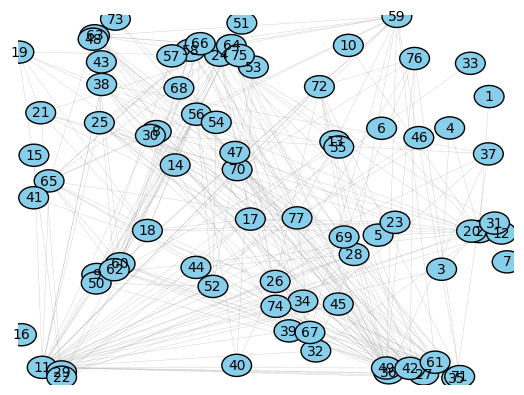

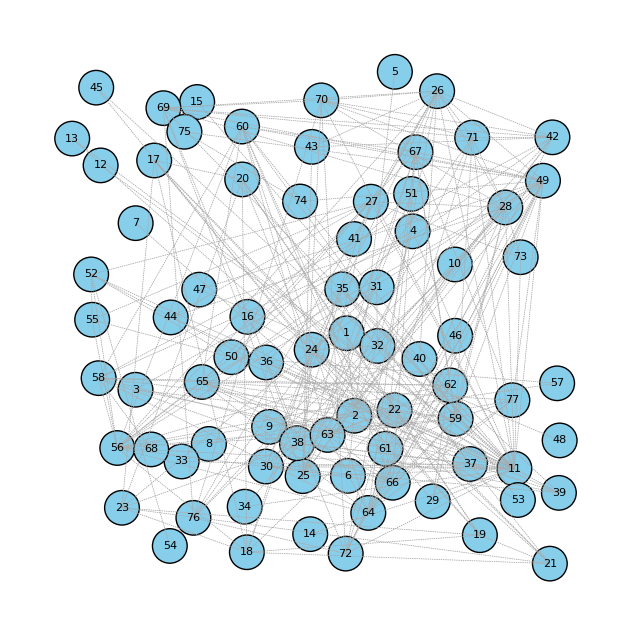

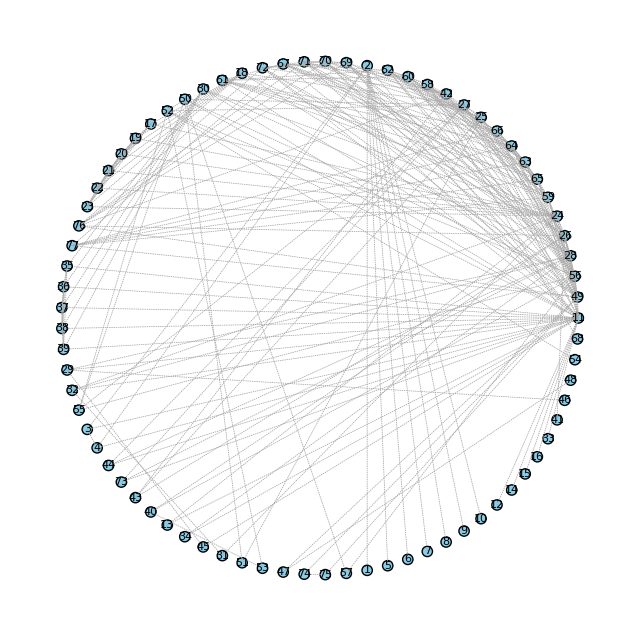

In [16]:
file_name = data_name_2
Random(file_name)
UniqueRandom(file_name,show_edge_labels = False)
Circular(file_name)


## step 2

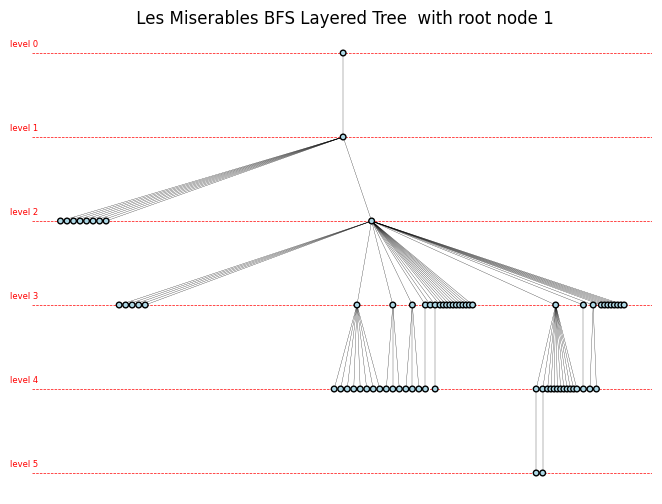

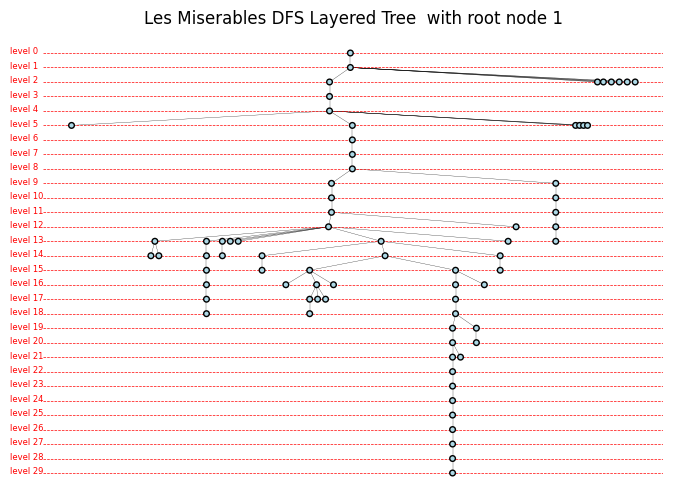

In [17]:
# choosing the graph and the root node
file_name = data_name_2
graph = parse_dot_file_bfs_dfs(file_name)
root_node = "1"

#running bfs and dfs on the graph
bfs_result = bfs_tree(graph, root_node)
dfs_result = dfs_tree(graph, root_node)

# plotting the trees with level-based layout with the nodes ids
display_node_id = False # by default, it displays the node ids with display_node_id = True
draw_layered_tree(bfs_result, " Les Miserables BFS Layered Tree  with root node 1", display_node_id)
draw_layered_tree(dfs_result, "Les Miserables DFS Layered Tree  with root node 1", display_node_id) 

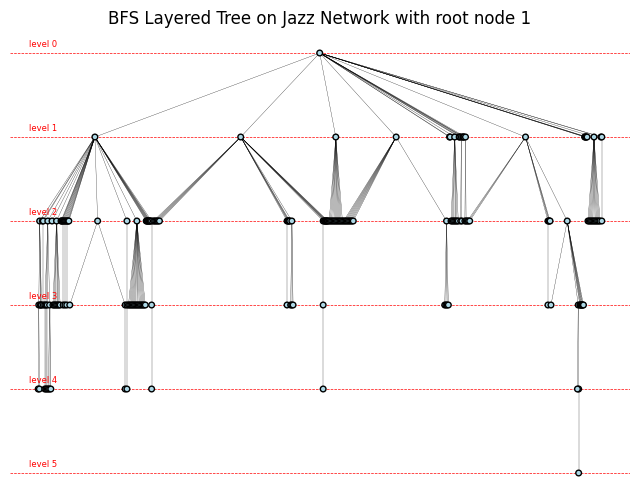

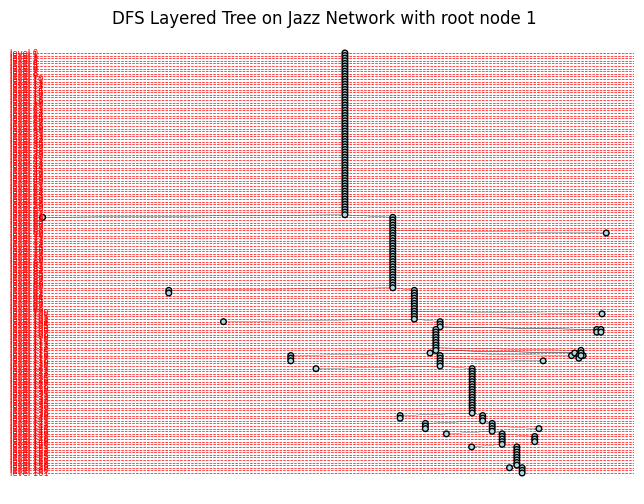

In [18]:
# choosing the graph and the root node
file_name = data_name_1
graph = parse_dot_file_bfs_dfs(file_name)
root_node = "1"

#running bfs and dfs on the graph
bfs_result = bfs_tree(graph, root_node)
dfs_result = dfs_tree(graph, root_node)

# plotting the trees with level-based layout with the nodes ids
display_node_id = False # by default, it displays the node ids with display_node_id = True
draw_layered_tree(bfs_result, "BFS Layered Tree on Jazz Network with root node 1", display_node_id)
draw_layered_tree(dfs_result, "DFS Layered Tree on Jazz Network with root node 1", display_node_id) 

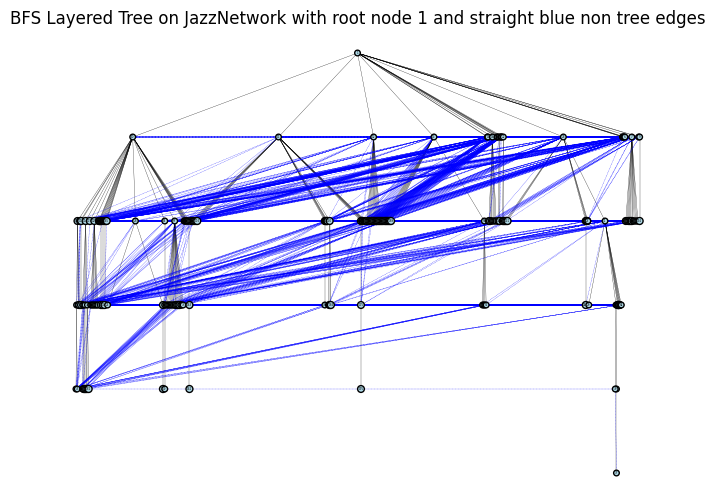

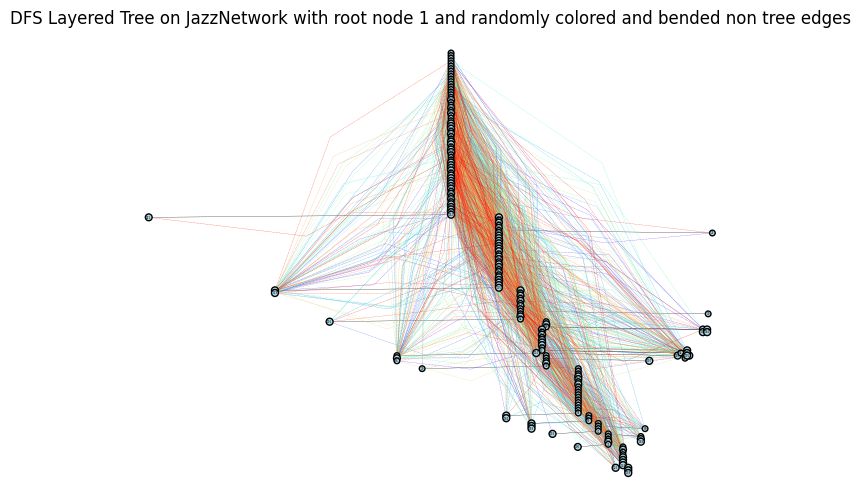

In [19]:
all_edges = extract_edges(graph)
non_tree_edges_bfs = missing_edges(bfs_result, all_edges)
non_tree_edges_dfs = missing_edges(dfs_result, all_edges)

draw_tree_with_all_edges(non_tree_edges_bfs, bfs_result, "BFS Layered Tree on JazzNetwork with root node 1 and straight blue non tree edges", random=False) #with straight blue lines
draw_tree_with_all_edges(non_tree_edges_dfs, dfs_result, "DFS Layered Tree on JazzNetwork with root node 1 and randomly colored and bended non tree edges") #with random curved lines

## step 3

Saved frame 1 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0001.png


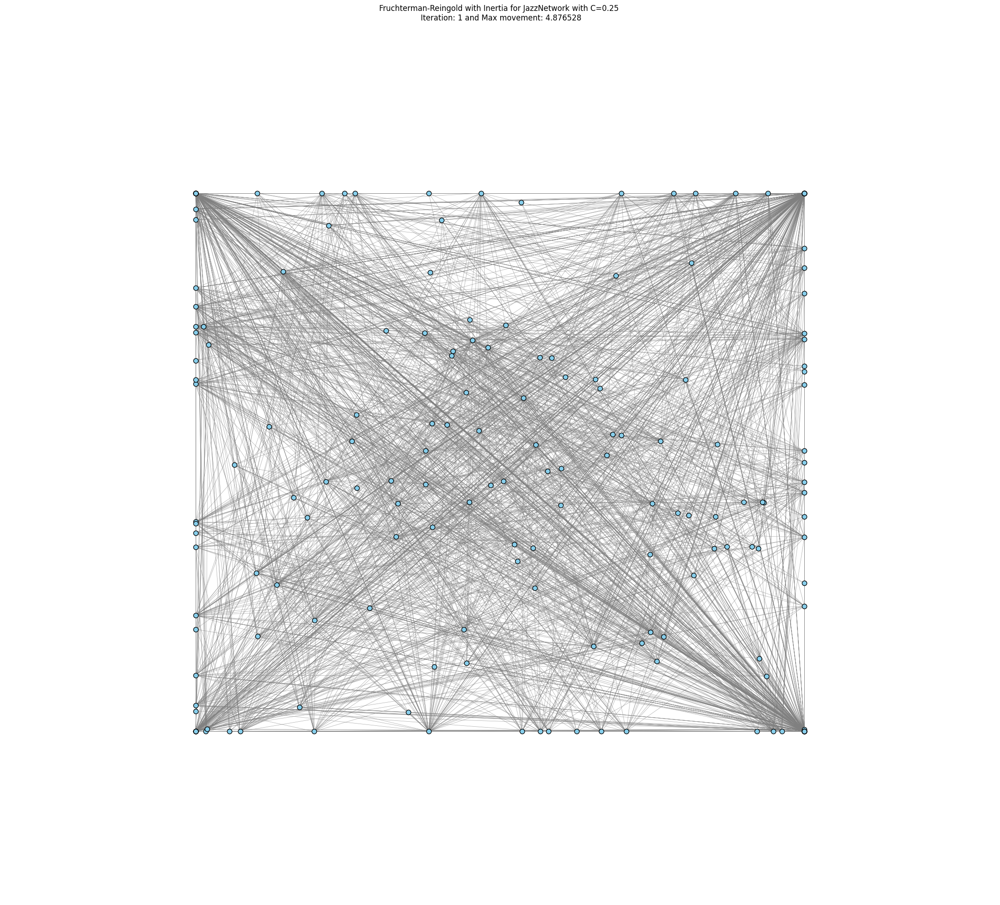

Saved frame 11 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0011.png


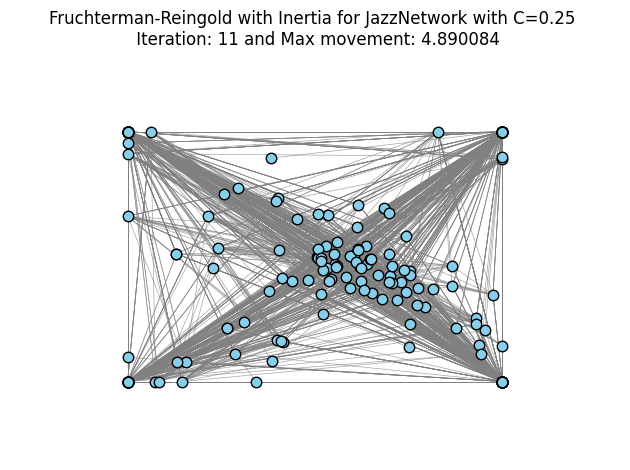

Saved frame 21 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0021.png


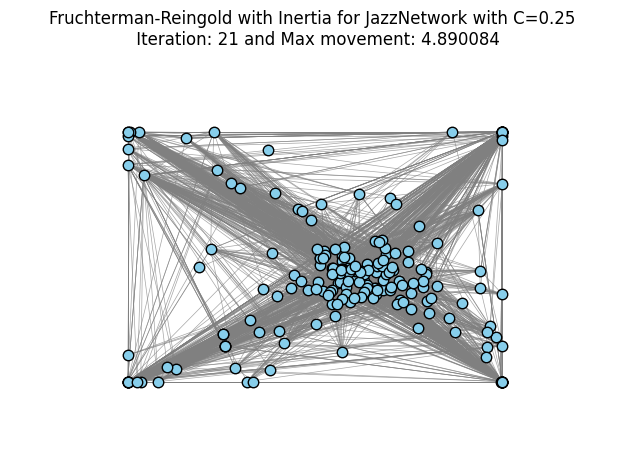

Saved frame 31 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0031.png


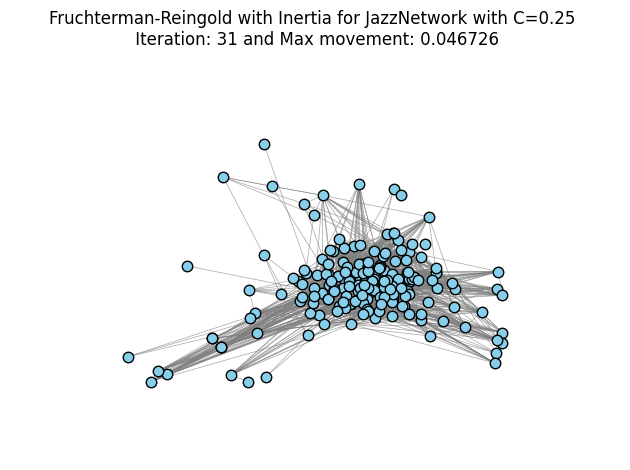

Saved frame 41 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0041.png


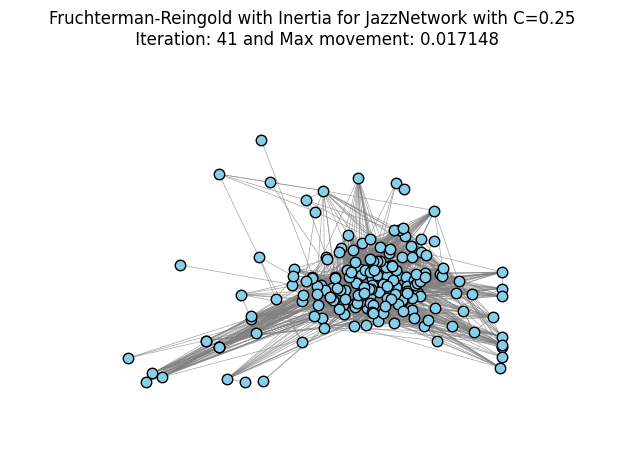

Saved frame 51 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0051.png


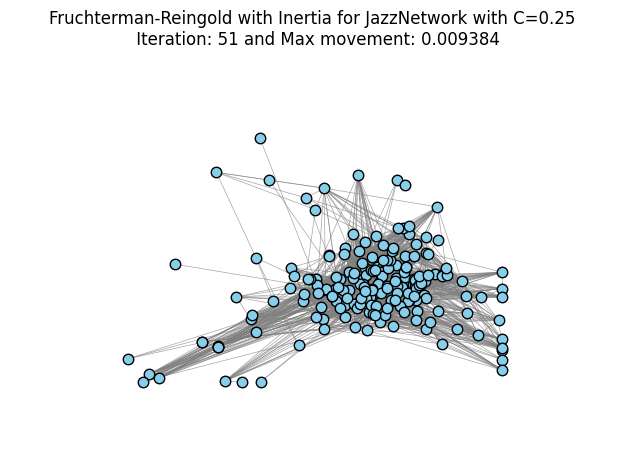

Saved frame 61 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0061.png


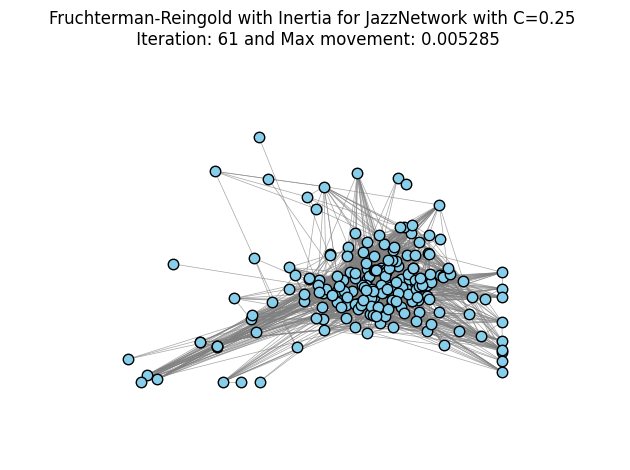

Saved frame 71 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0071.png


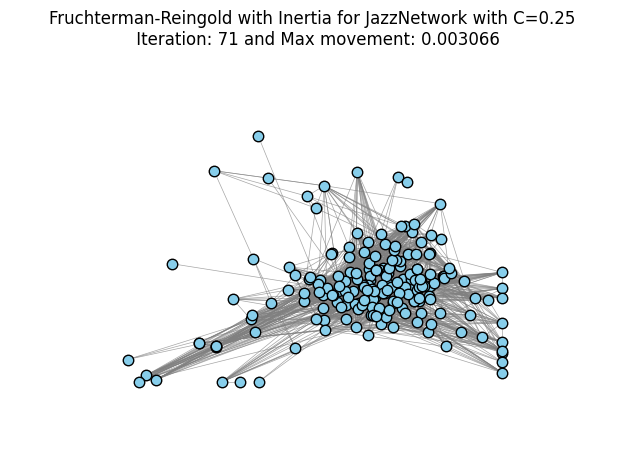

Saved frame 81 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0081.png


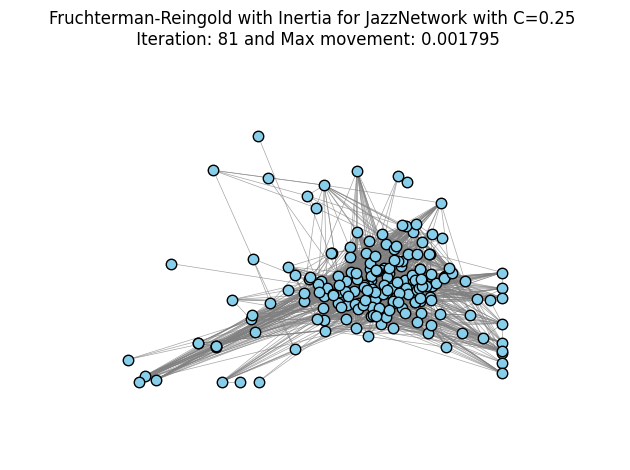

Saved frame 91 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0091.png


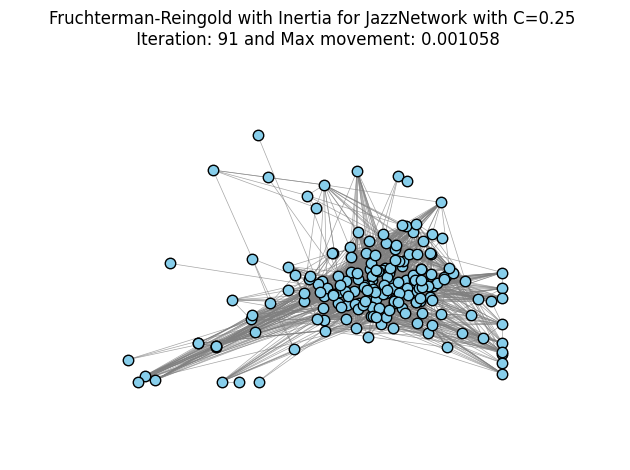

Saved frame 93 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0093.png


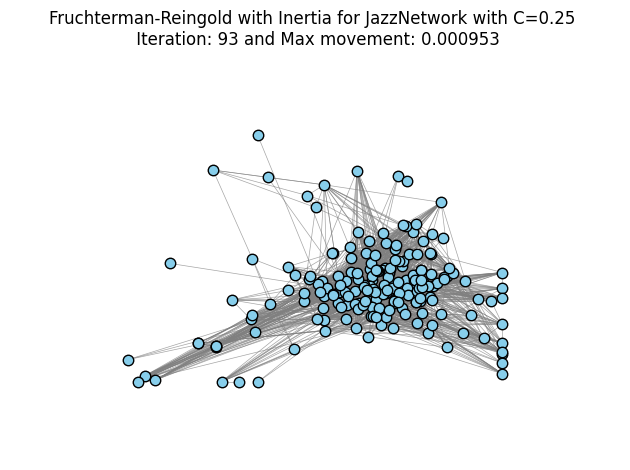

Algorithm converged at iteration 93 with maximum movement 0.000953


In [20]:
# without color scaling
draw_force_directed_graph_fruchterman_reingold_inertia(
    file_name, 
    iterations=300,
    C=0.25,  
    convergence_threshold=0.001,
    display_node_id=False)

Saved frame 1 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0001.png


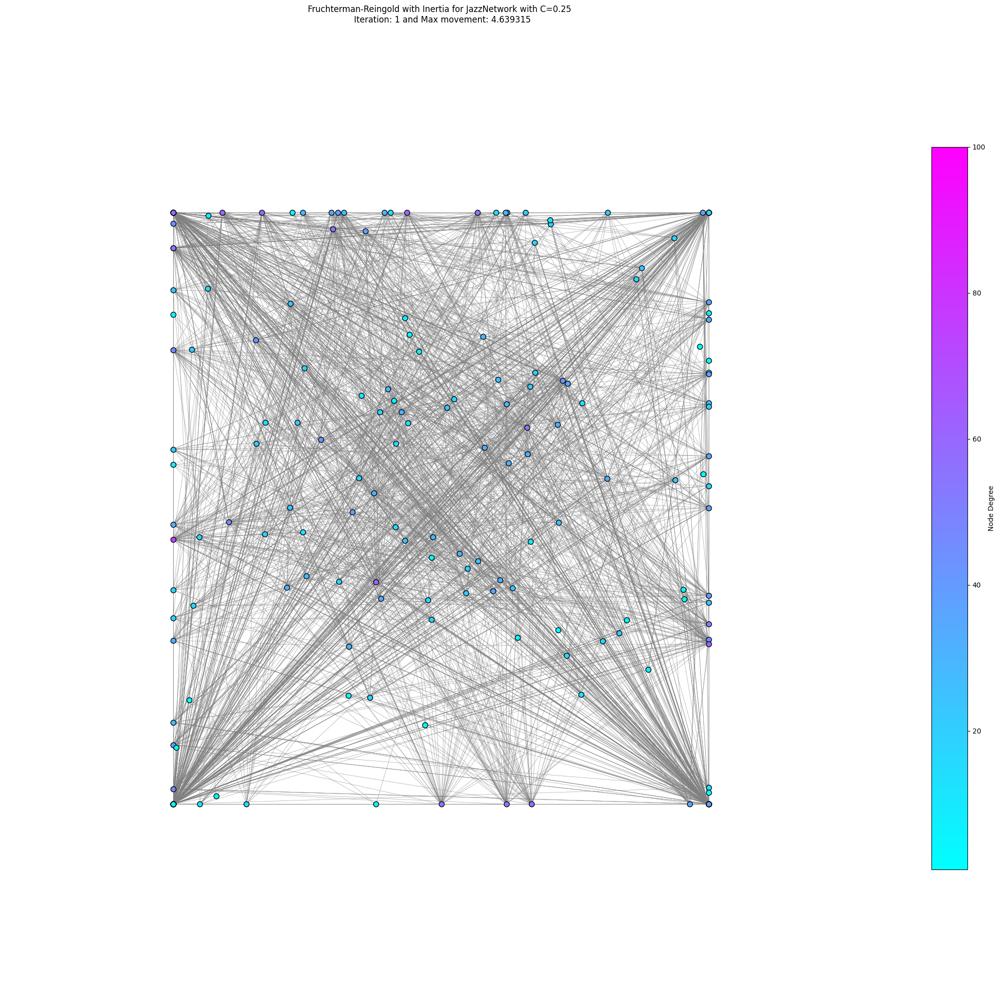

Saved frame 11 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0011.png


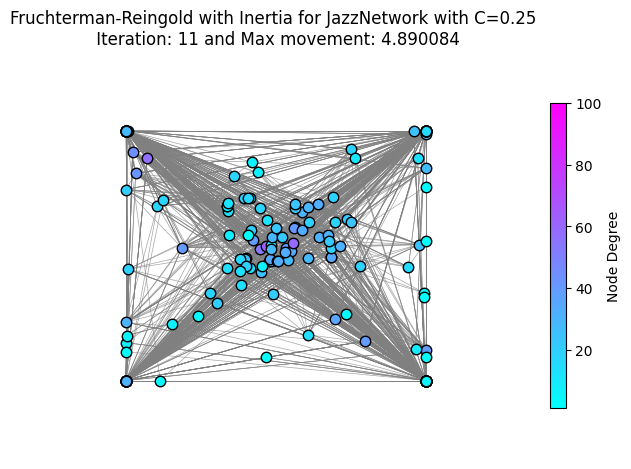

Saved frame 21 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0021.png


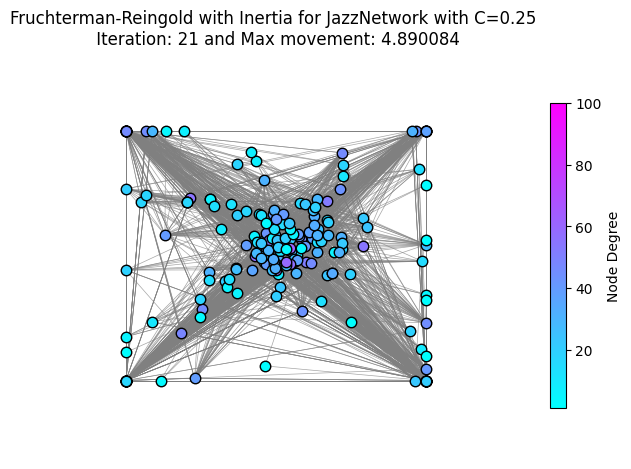

Saved frame 31 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0031.png


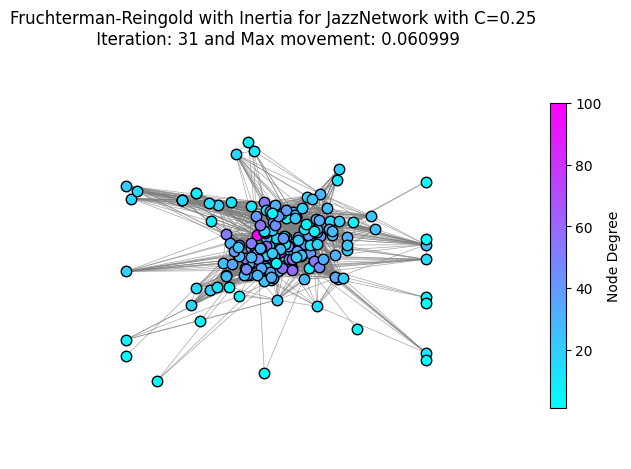

Saved frame 41 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0041.png


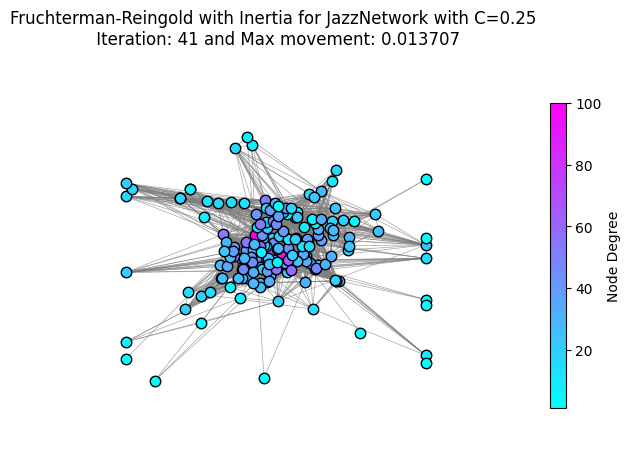

Saved frame 51 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0051.png


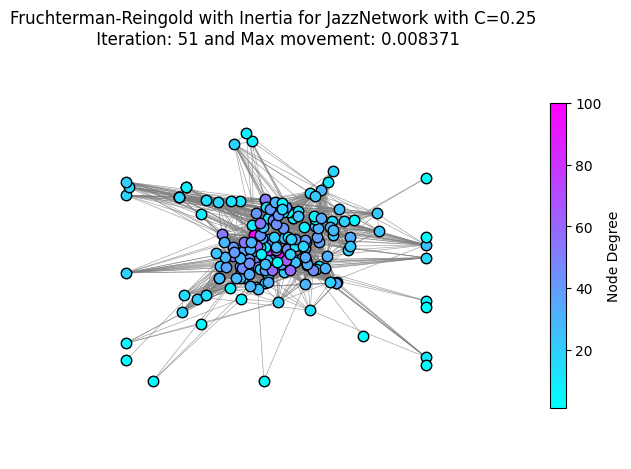

Saved frame 61 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0061.png


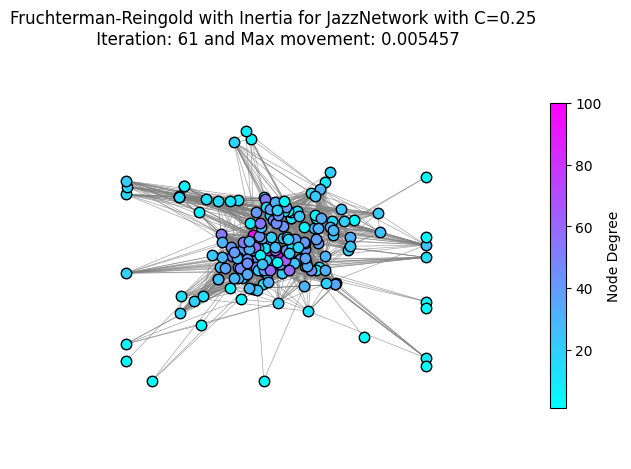

Saved frame 71 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0071.png


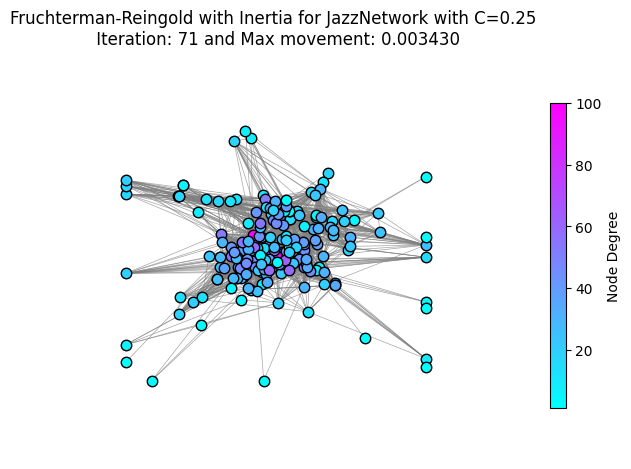

Saved frame 81 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0081.png


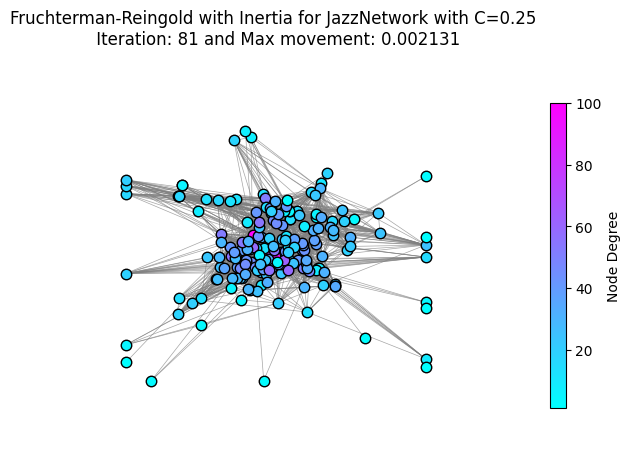

Saved frame 91 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0091.png


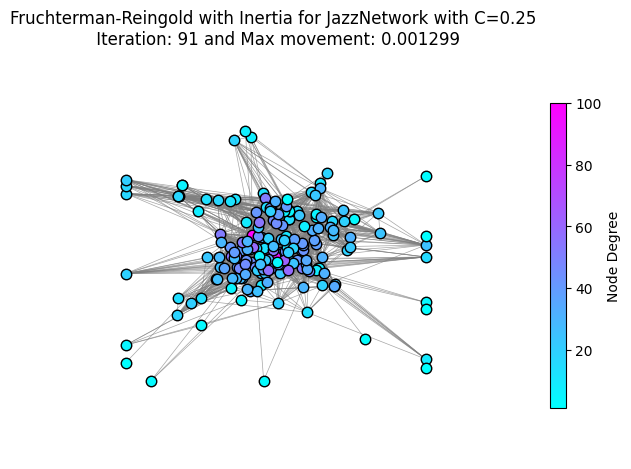

Saved frame 97 to ../Outputs_force\JazzNetwork.dot\JazzNetworkFRI_C0.25_iter0097.png


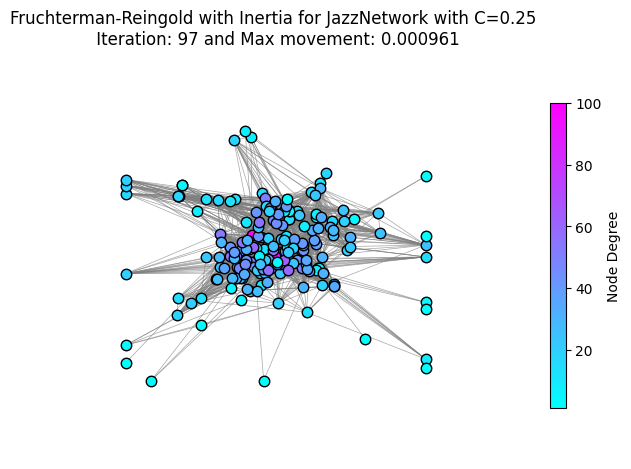

Algorithm converged at iteration 97 with maximum movement 0.000961


In [21]:
# with color scaling
draw_colorful_force_directed_graph_fruchterman_reingold_inertia(
    file_name, 
    iterations=300,
    C=0.25,  
    convergence_threshold=0.001,
    display_node_id=False)

## Step 4 (and qulity metrics results for step7)

### Circular Layout for directed/undirected graphs

Graph is directed


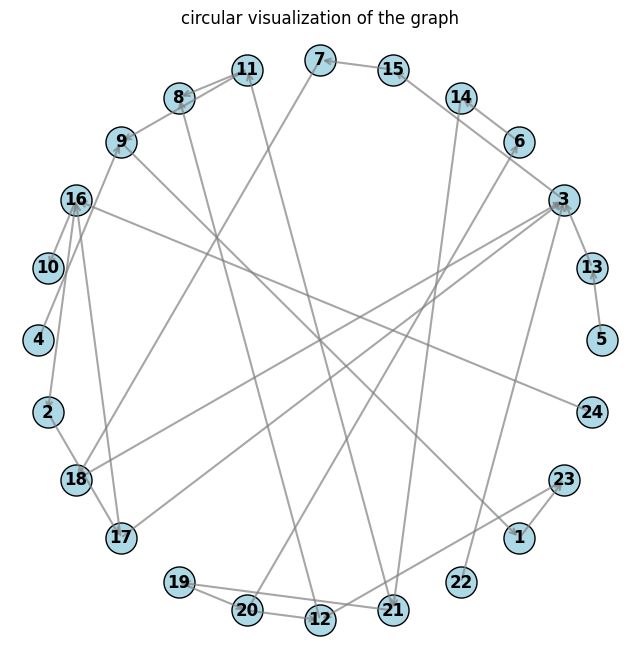

In [22]:
#for both directed and undirected graphs
dot_file = data_name_9
nodes, edges = parse_dot_file(dot_file)
circular_visualize_graph(nodes, edges)

### Resolve cycles with trivial heuristic

Graph is directed

Number of edges that have been reversed: 11

List of reversed edges: [('9', '4'), ('3', '18'), ('16', '17'), ('3', '17'), ('6', '20'), ('8', '12'), ('19', '21'), ('11', '21'), ('3', '22'), ('12', '23'), ('16', '24')]


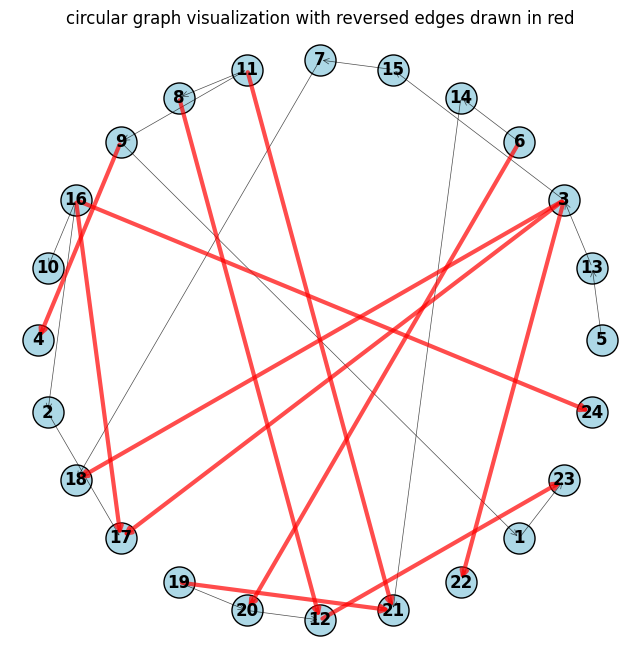

In [23]:
dot_file = data_name_9
nodes, edges = parse_dot_file(dot_file)
A, A_reverse = trivial_heuristic(nodes, edges)
final_edges, A_reversed = reversed_edges(A, A_reverse)
circular_reverse_graph(nodes, final_edges, A_reversed, A)

### Layer Assignment & number of crossings

Graph is directed

Number of edges that have been reversed: 11

List of reversed edges: [('9', '4'), ('3', '18'), ('16', '17'), ('3', '17'), ('6', '20'), ('8', '12'), ('19', '21'), ('11', '21'), ('3', '22'), ('12', '23'), ('16', '24')]


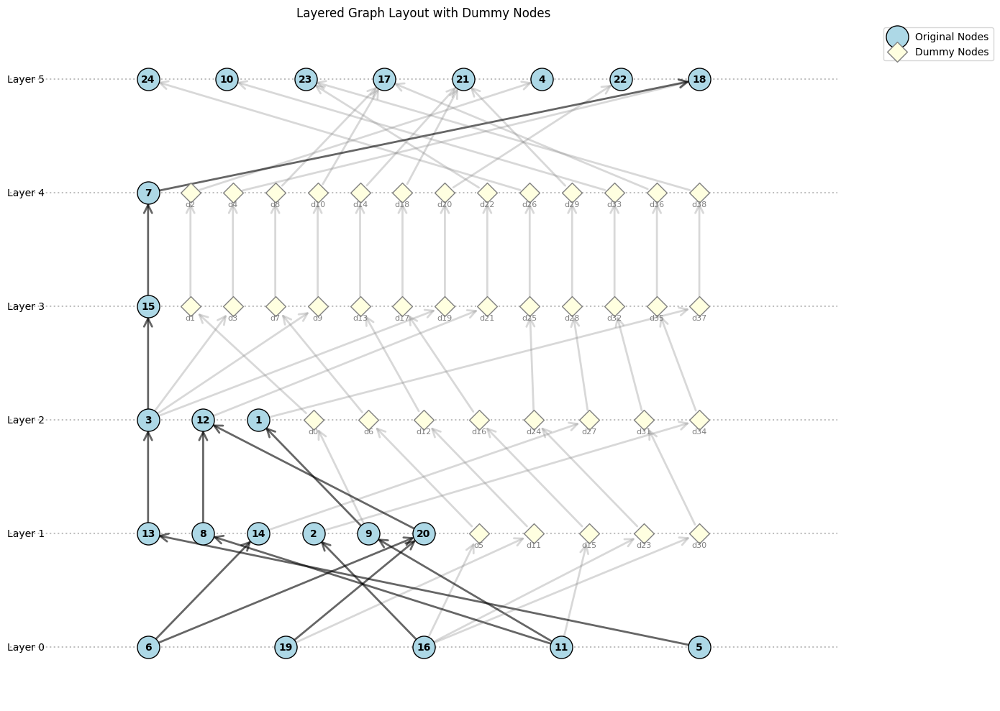

In [24]:
#layer assignment
dot_file = data_name_9
nodes, edges = parse_dot_file(dot_file)

A, A_reverse = trivial_heuristic(nodes, edges)
final_edges, A_reversed = reversed_edges(A, A_reverse)

layers, modified_edges, dummy_mapping  = sugiyama_layer_assignment(nodes, final_edges)
positions = draw_layered_graph(layers, modified_edges, dummy_mapping)

In [25]:
#number of crossings
num_crossings, crossing_pairs = count_edge_crossings(positions, modified_edges)
print(f"Number of edge crossings: {num_crossings}")
print("Crossing edge pairs:")
for edge_pair in crossing_pairs:
    print(f"  {edge_pair[0]} crosses {edge_pair[1]}")

Number of edge crossings: 130
Crossing edge pairs:
  ('9', 'dummy_0') crosses ('14', 'dummy_27')
  ('9', 'dummy_0') crosses ('2', 'dummy_34')
  ('9', 'dummy_0') crosses ('20', '12')
  ('dummy_0', 'dummy_1') crosses ('3', 'dummy_3')
  ('dummy_0', 'dummy_1') crosses ('3', 'dummy_9')
  ('dummy_0', 'dummy_1') crosses ('3', 'dummy_19')
  ('dummy_0', 'dummy_1') crosses ('12', 'dummy_21')
  ('dummy_0', 'dummy_1') crosses ('1', 'dummy_37')
  ('dummy_2', '4') crosses ('dummy_8', '17')
  ('dummy_2', '4') crosses ('dummy_10', '17')
  ('dummy_2', '4') crosses ('dummy_14', '21')
  ('dummy_2', '4') crosses ('dummy_18', '21')
  ('dummy_2', '4') crosses ('dummy_22', '23')
  ('dummy_2', '4') crosses ('dummy_26', '24')
  ('dummy_2', '4') crosses ('dummy_29', '21')
  ('dummy_2', '4') crosses ('7', '18')
  ('dummy_2', '4') crosses ('dummy_33', '10')
  ('dummy_2', '4') crosses ('dummy_36', '17')
  ('dummy_2', '4') crosses ('dummy_38', '23')
  ('dummy_4', '18') crosses ('dummy_8', '17')
  ('dummy_4', '18') 

### Cross Minimizing


Initial crossing count: 130
----------------------------------------

Iteration 1
After downward sweep: 24 crossings
After upward sweep: 18 crossings

Iteration 2
After downward sweep: 11 crossings
After upward sweep: 10 crossings

Iteration 3
After downward sweep: 11 crossings
After upward sweep: 10 crossings

Pattern repeats (same crossing counts as previous iteration), stopping...

Final crossing count: 10
Total reduction: 120 crossings


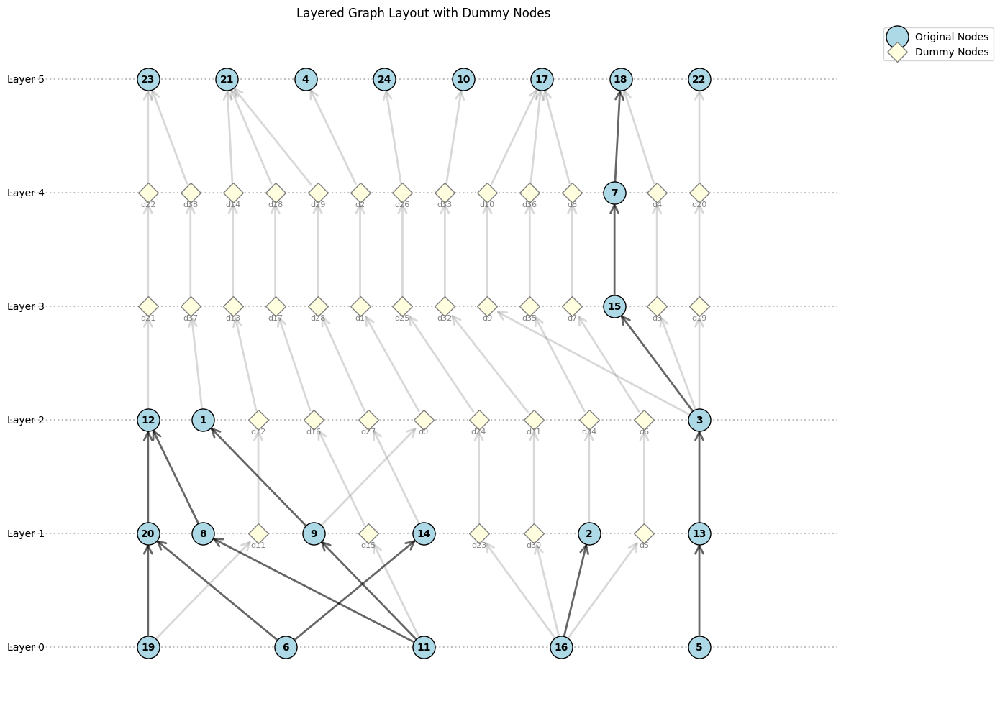

In [26]:
#apply the crossing minimization 

layers, modified_edges, dummy_mapping = sugiyama_layer_assignment(nodes, final_edges)

# Apply crossing minimization
optimized_layers = minimize_crossings(
    layers=layers.copy(),  # Create a copy to preserve original
    edges=modified_edges,
    max_iterations=10,
    method='barycenter'  # or 'median'
)

# Visualize the result
positions = draw_layered_graph(optimized_layers, modified_edges, dummy_mapping)
plt.show()


Initial crossing count: 130
----------------------------------------

Iteration 1
After downward sweep: 24 crossings
After upward sweep: 18 crossings

Iteration 2
After downward sweep: 11 crossings
After upward sweep: 10 crossings

Iteration 3
After downward sweep: 11 crossings
After upward sweep: 10 crossings

Pattern repeats (same crossing counts as previous iteration), stopping...

Final crossing count: 10
Total reduction: 120 crossings


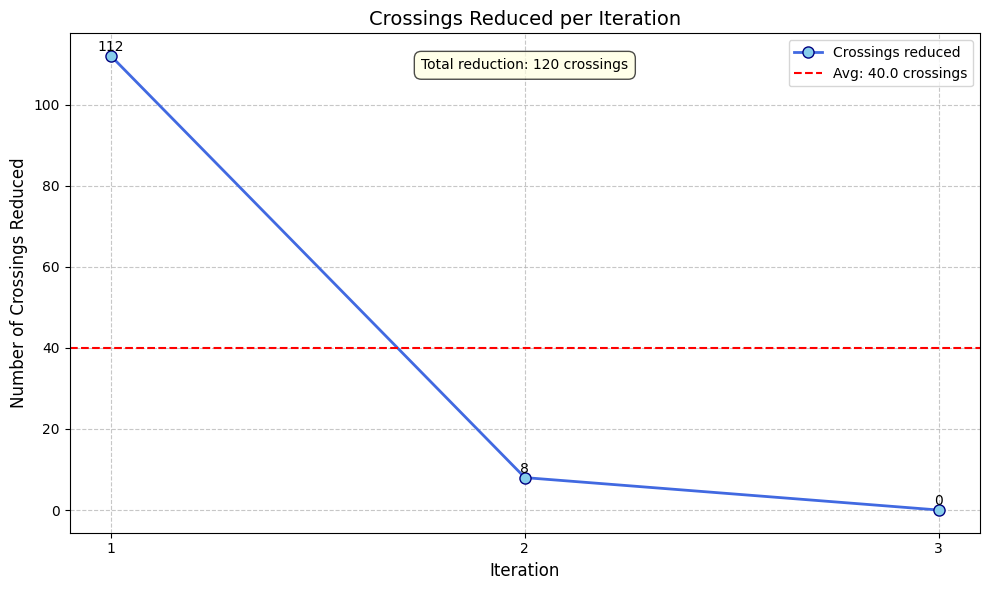

In [27]:
# Apply crossing minimization with detailed output
crossing_stats = minimize_crossings(
    layers=layers.copy(),
    edges=modified_edges,
    max_iterations=10,
    method='barycenter',  # or 'median'
    collect_stats =True  
)

# Extract data from crossing_stats (excluding the summary at the end)
iterations = [stat['iteration'] for stat in crossing_stats[:-1]]
crossings_reduced = [stat['crossings_reduced'] for stat in crossing_stats[:-1]]

# Create the line plot
plt.figure(figsize=(10, 6))
plt.plot(iterations, crossings_reduced, 'o-', color='royalblue', linewidth=2, 
         markersize=8, markerfacecolor='skyblue', markeredgecolor='navy', 
         label='Crossings reduced')

# Add a horizontal line showing the average reduction
avg_reduction = np.mean(crossings_reduced)
plt.axhline(y=avg_reduction, color='red', linestyle='--', 
            label=f'Avg: {avg_reduction:.1f} crossings')

# Add value labels above each point
for i, value in enumerate(crossings_reduced):
    plt.text(iterations[i], value + 0.5, f'{value:.0f}', 
             ha='center', va='bottom')

# Add title and labels
plt.title('Crossings Reduced per Iteration', fontsize=14)
plt.xlabel('Iteration', fontsize=12)
plt.ylabel('Number of Crossings Reduced', fontsize=12)
plt.xticks(iterations)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

# Add the total reduction as an annotation
total_reduction = crossing_stats[-1]['total_reduction']
plt.annotate(f'Total reduction: {total_reduction} crossings', 
             xy=(0.5, 0.95), xycoords='axes fraction',
             ha='center', va='top', 
             bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow', alpha=0.7))

plt.tight_layout()
plt.show()

### Node positioning


Found 5 nodes in layer 0
Finding paths from node 19 (1/5)
Finding paths from node 6 (2/5)
Finding paths from node 11 (3/5)
Finding paths from node 16 (4/5)
Finding paths from node 5 (5/5)
Found 16 total paths from layer 0 nodes
Optimizing node positions to straighten paths...
Preparing optimization for 63 nodes across 6 layers
Created 57 ordering constraints
Initial total deviation: 0.5229
Starting optimization...


c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\my_envi\Lib\site-packages\scipy\optimize\_slsqp_py.py:435: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


Iteration 10: Deviation = 0.0784 (Improved by 85.01%)
Iteration 20: Deviation = 0.0767 (Improved by 85.33%)
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.09459655382707699
            Iterations: 21
            Function evaluations: 1358
            Gradient evaluations: 21
Optimization succeeded: Optimization terminated successfully

Final results:
Initial total deviation: 0.5229
Final total deviation: 0.0767
Improved by 85.33%
Moved 62 out of 63 nodes

Top 5 paths with greatest improvement:
1. Path 11 → 23: Improved by 0.1401 (95.1%)
2. Path 6 → 21: Improved by 0.0763 (81.5%)
3. Path 6 → 23: Improved by 0.0424 (88.3%)
4. Path 5 → 17: Improved by 0.0392 (71.1%)
5. Path 11 → 23: Improved by 0.0391 (92.9%)


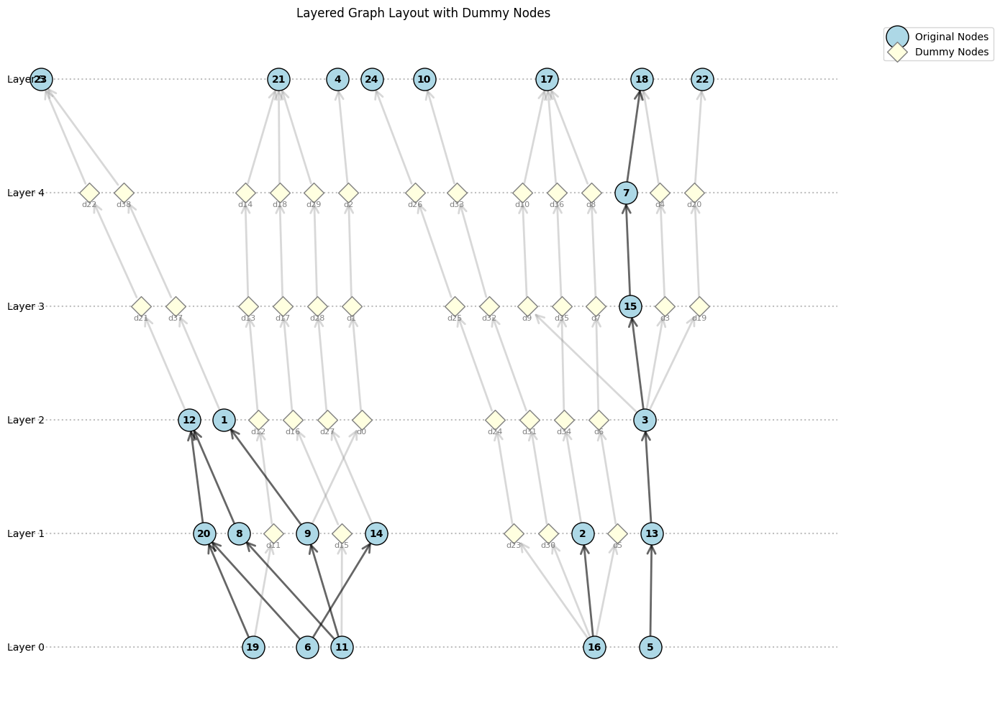

In [28]:
# First get all paths show output
paths = build_paths_from_layer_0(positions, modified_edges, dummy_mapping, max_depth=10)

# Optimize positions to straighten paths
optimized_positions = straighten_paths_quadratic_program(
    paths, 
    positions, 
    dummy_mapping, 
    min_distance=0.05,
    max_iterations=300
)

positions_draw_layered_graph(optimized_layers, modified_edges, dummy_mapping, optimized_positions)

### Quality Metrics

In [29]:
#edge Crossings 
n_cross, cross = count_edge_crossings_final(optimized_positions,modified_edges)
print(f"\nNumber of edge crossings after optimization: {n_cross}")
print("\nCrossing edge pairs after optimization:")
for edge_pair in cross:
    print(f"  {edge_pair[0]} crosses {edge_pair[1]}")


Number of edge crossings after optimization: 10

Crossing edge pairs after optimization:
  ('9', 'dummy_0') crosses ('dummy_15', 'dummy_16')
  ('9', 'dummy_0') crosses ('14', 'dummy_27')
  ('dummy_6', 'dummy_7') crosses ('3', 'dummy_9')
  ('3', 'dummy_9') crosses ('dummy_34', 'dummy_35')
  ('6', '20') crosses ('19', 'dummy_11')
  ('19', 'dummy_11') crosses ('11', '8')
  ('dummy_11', 'dummy_12') crosses ('9', '1')
  ('11', 'dummy_15') crosses ('6', '14')
  ('6', '14') crosses ('11', '8')
  ('6', '14') crosses ('11', '9')


In [30]:
# Calculate crossing angles
crossings, crossing_edge_pairs = count_edge_crossings_final(optimized_positions, modified_edges)

angle_results = calculate_crossing_angles(optimized_positions, crossing_edge_pairs)


crossings=0
for edge1, edge2, angle in angle_results:
    print(f"Edges {edge1} and {edge2} cross at an angle of {angle:.2f}°")
    crossings+=1
print(f"\nTotal number of crossings: {crossings}")

Edges ('9', 'dummy_0') and ('dummy_15', 'dummy_16') cross at an angle of 8.58°
Edges ('9', 'dummy_0') and ('14', 'dummy_27') cross at an angle of 8.58°
Edges ('dummy_6', 'dummy_7') and ('3', 'dummy_9') cross at an angle of 9.48°
Edges ('3', 'dummy_9') and ('dummy_34', 'dummy_35') cross at an angle of 9.48°
Edges ('6', '20') and ('19', 'dummy_11') cross at an angle of 10.17°
Edges ('19', 'dummy_11') and ('11', '8') cross at an angle of 10.17°
Edges ('dummy_11', 'dummy_12') and ('9', '1') cross at an angle of 5.70°
Edges ('11', 'dummy_15') and ('6', '14') cross at an angle of 5.71°
Edges ('6', '14') and ('11', '8') cross at an angle of 14.24°
Edges ('6', '14') and ('11', '9') cross at an angle of 8.57°

Total number of crossings: 10


In [31]:
#stress
stress_distribution = analyze_stress_distribution(optimized_positions, modified_edges)

Mean stress per pair: 1.8041
Median stress per pair: 2.0000
Max stress per pair: 5.0776
Standard deviation: 1.1918


### Edge reversing & drawing

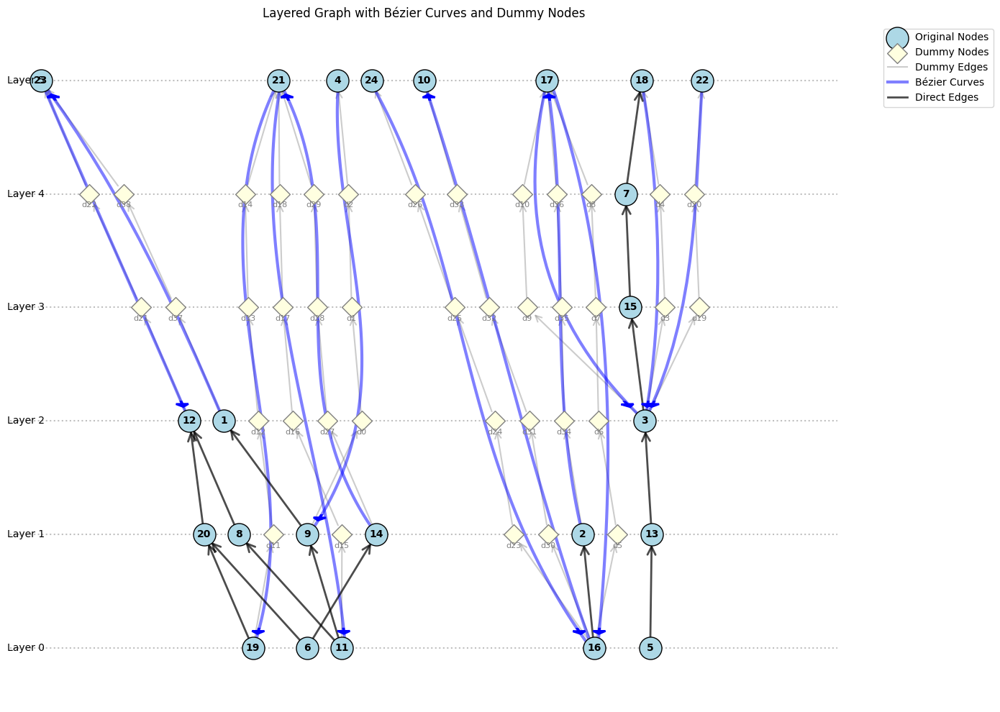

In [32]:
# with dummy nodes
positions = positions_draw_layered_graph_with_bezier(
    optimized_positions,
    optimized_layers, 
    modified_edges, 
    dummy_mapping,
    original_edges=edges,  # Pass original edges to determine direction
    show_dummies=True  # Set to True to show dummy nodes
)
plt.show()

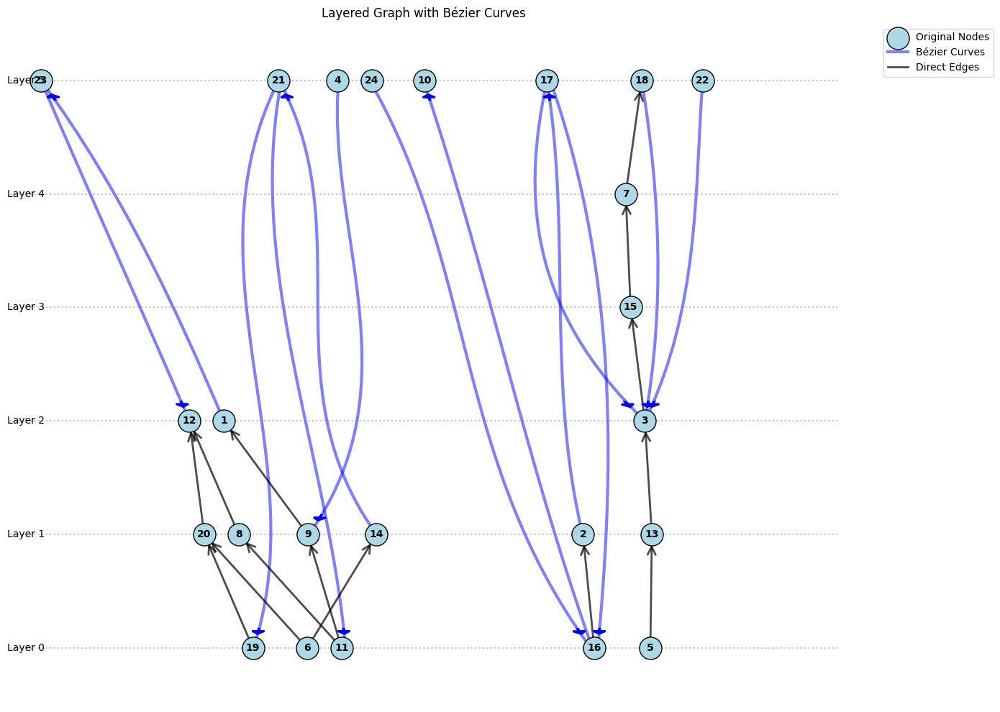

In [33]:
# without dummy nodes
positions = positions_draw_layered_graph_with_bezier(
    optimized_positions,
    optimized_layers, 
    modified_edges, 
    dummy_mapping,
    original_edges=edges,  # Pass original edges to determine direction
    show_dummies=False  # Set to True to show dummy nodes
)
plt.show()

## step 5

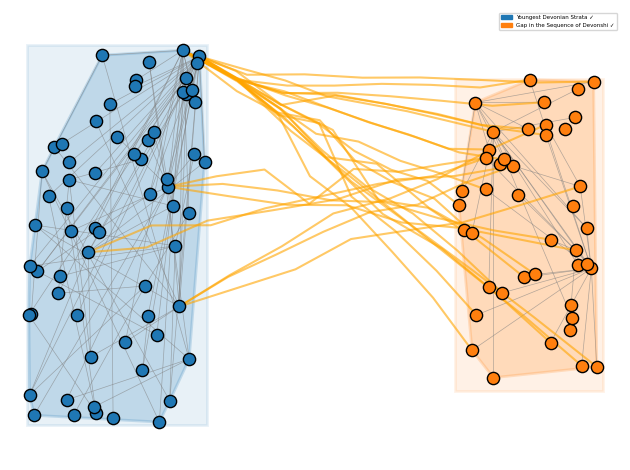

In [34]:
# Apply FDEB to inter-cluster edges
bundled_edges = apply_fdeb_to_inter_cluster_edges(G, pos, cluster1_nodes, cluster2_nodes, P=6, S=0.03, I=50, compatibility_threshold=0.06)

# drawing: 
actual_drawing_boundled(*visualization_elements, bundled_edges)

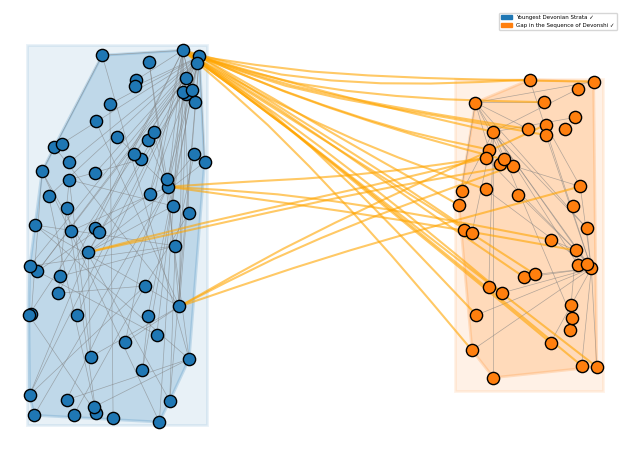

In [35]:
smoothed_bundled_edges = bundled_edges
# Apply additional smoothing to the already smoothed bundled edges
further_smoothed_edges = perform_additional_smoothing(smoothed_bundled_edges, smooth_iterations=2, kernel_width=7, sigma=1.5)

# drawing: 
actual_drawing_boundled(*visualization_elements, further_smoothed_edges)

## step 6

### distance matrix e preparation for DR algorithms

Graph is undirected
Number of nodes: 198
Original Number of Edges:  2742 
 -- after doubling edges -- 
Number of edges: 5484


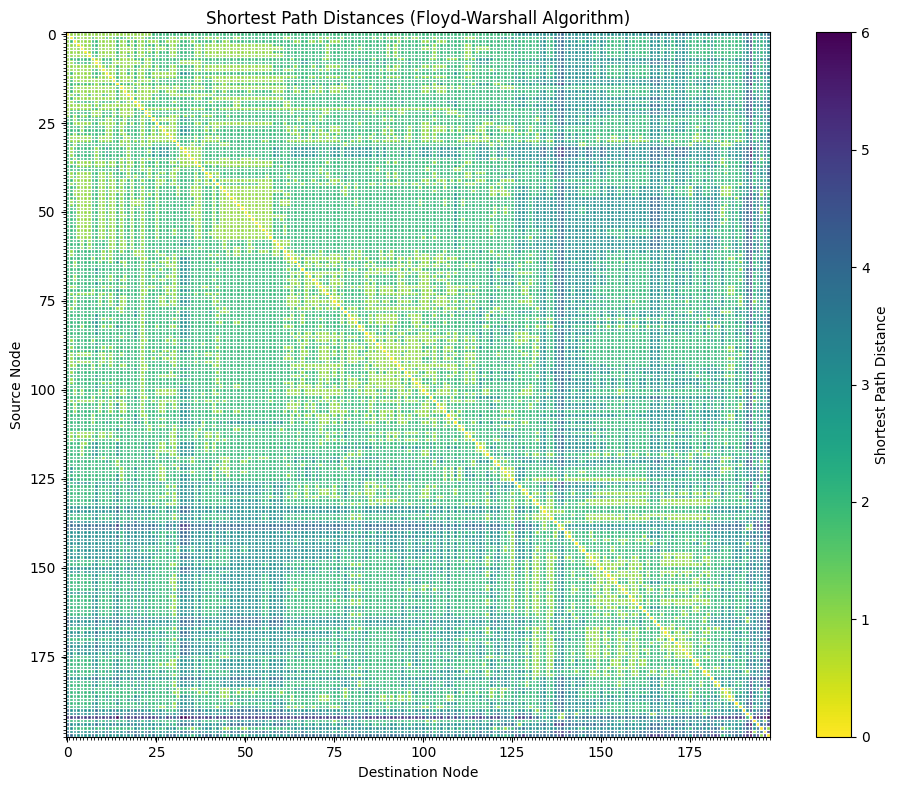

In [36]:
nodes_dict, edges_dict, nodes, edges = data_processing(data_name_1)
distance_matrix, node_ids = floyd_warshall(nodes_dict, edges_dict)
fig, ax = plot_coloured_distance_matrix(distance_matrix, node_ids)
plt.show()

In [37]:
# Convert the distance matrix to a NumPy array (for t-SNE and ISOMAP) and creates a folder to store the projections
distance_matrix_np = np.array(distance_matrix)

output_dir = folder_for_projections(file_name)

Created main directory: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot
Created directory: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\MDS
Created directory: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\tSNE
Created directory: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\ISOMAP
Created directory: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\ISOMAP\2D
Created directory: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\ISOMAP\3D


### mds

Dimesnion of X after MDS =  (198, 2)


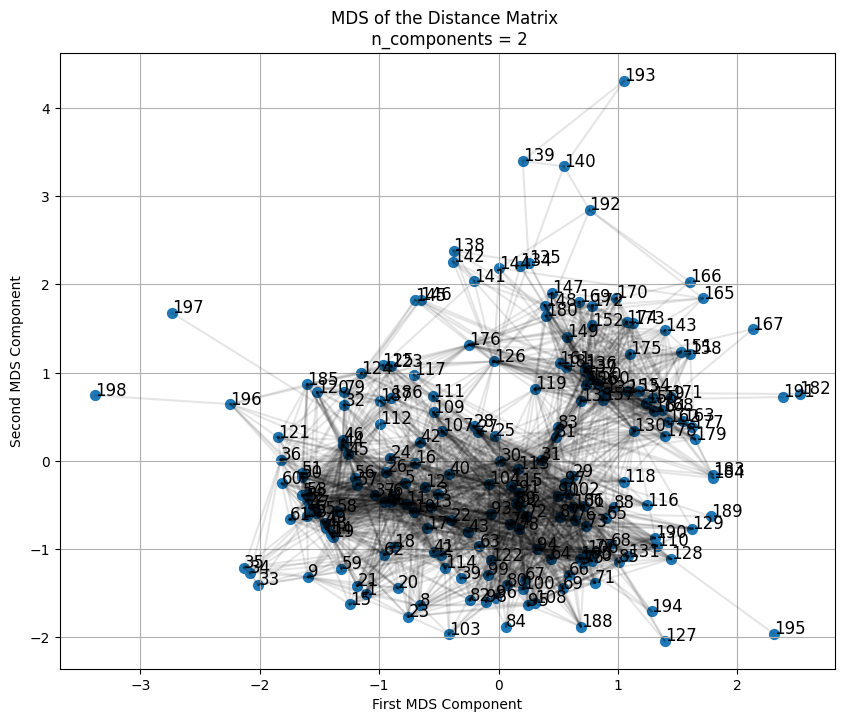

Plot saved as: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\MDS/mds_visualization_1.png


In [38]:
mds_distance_matrix_reduced = mds_2d_projection(distance_matrix, node_ids, edges, output_dir)

### t-sne

In [39]:
# Define the perplexity range based on the number of nodes
lower = max(2, int(0.05 * len(node_ids))) # 5%
upper = max(3, int(0.10 * len(node_ids))) # 10%

print(f"Adviced perplexity range: {lower} to {upper}")

Adviced perplexity range: 9 to 19


Dimesnion of X after t-SNE =  (198, 2)


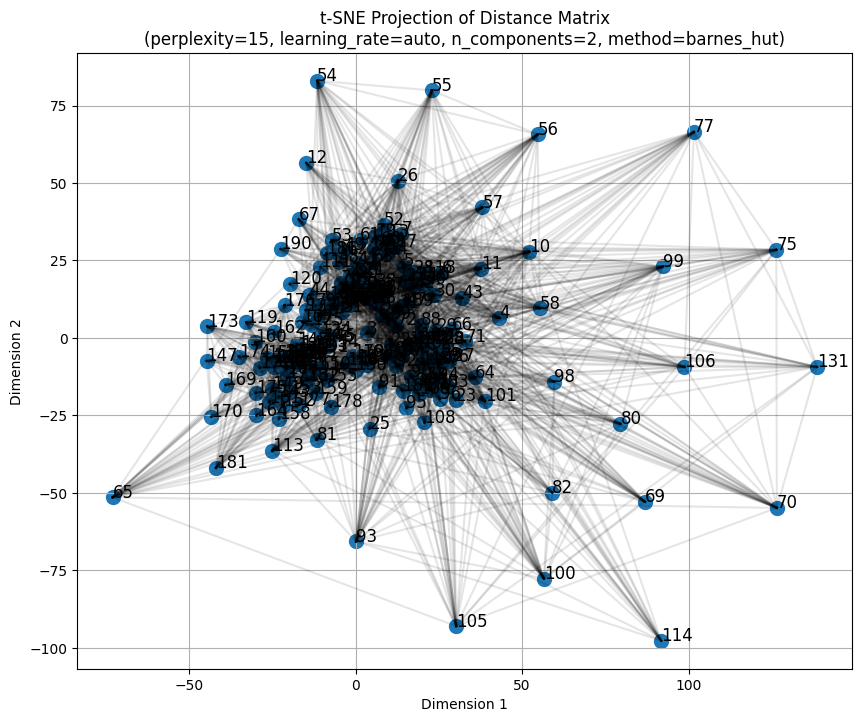

Plot saved as: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\tSNE/tsne_visualization_1.png


In [40]:
tsne_distance_matrix_reduced = tsne_2d_projection(distance_matrix_np, node_ids, edges, output_dir, perplexity=15, angle=0.5)

### isomap

#### 2D

Dimension of X after Isomap = (198, 2)


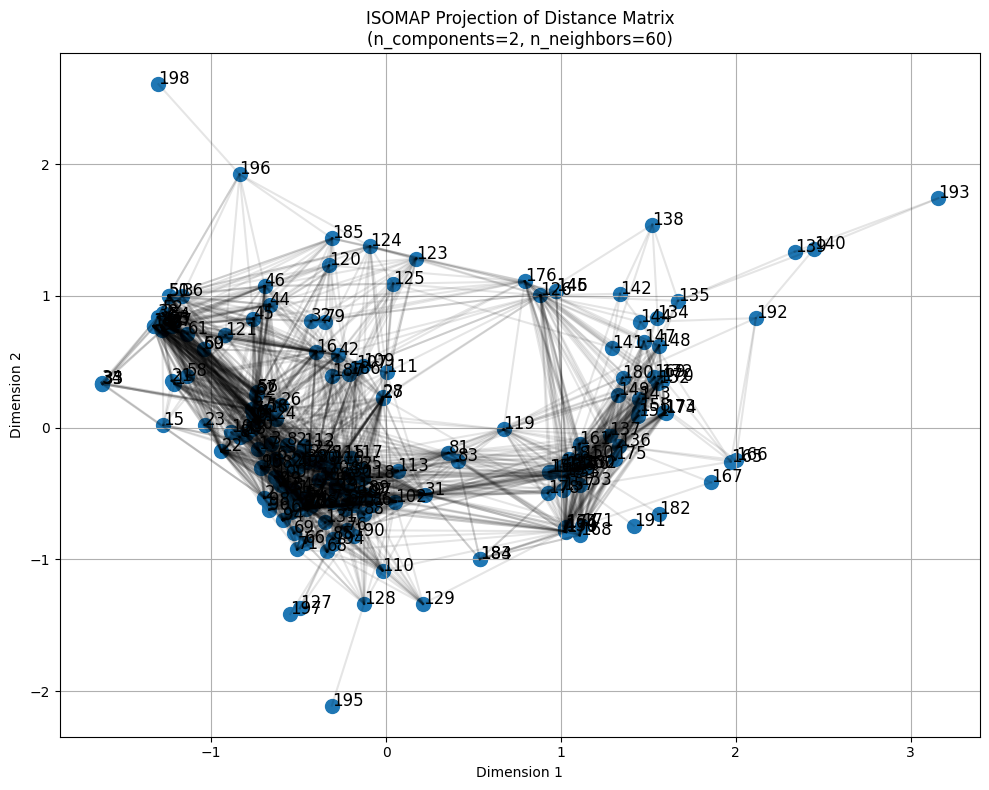

Plot saved in 2D folder as: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\ISOMAP/2D/ISOMAP_visualization_1_comp2_neigh60.png


In [41]:
isomap_distance_matrix_reduced_2d = isomap_2d_projection(distance_matrix_np, node_ids, edges, output_dir, n_neighbors=60)

#### 3D

Dimension of X after Isomap = (198, 3)


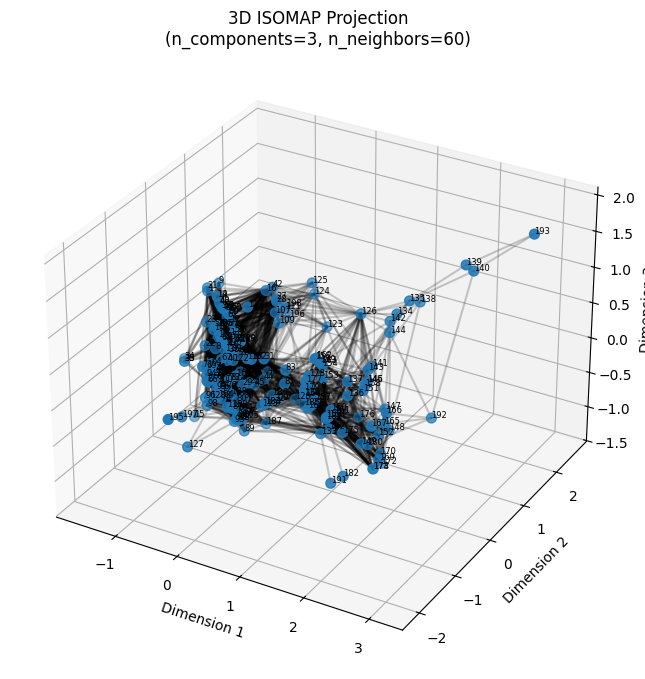

3D plot saved as: c:\Users\Hari\Desktop\dataVisproj\Data-Visualization-CurryPasta\Step6_outputs-JazzNetwork.dot\ISOMAP/3D/ISOMAP_3D_1_comp3_neigh60.png


In [42]:
isomap_distance_matrix_reduced_3d = isomap_3d_projection(distance_matrix_np, node_ids, edges, output_dir, n_neighbors=60)

## step 7 (run step 6 before)

### DR Projections quality metrics

#### Normalized stress

In [43]:
# MDS
mds_stress = normalized_stress(distance_matrix_np, mds_distance_matrix_reduced)
print(f"Normalized Stress for MDS: {mds_stress:.4f}")

# t-SNE
tsne_stress = normalized_stress(distance_matrix_np, tsne_distance_matrix_reduced)
print(f"Normalized Stress for t-SNE: {tsne_stress:.4f}")

# isomap 2D
isomap_stress = normalized_stress(distance_matrix_np, isomap_distance_matrix_reduced_2d)
print(f"Normalized Stress for t-SNE: {isomap_stress:.4f}")

Normalized Stress for MDS: 0.7114
Normalized Stress for t-SNE: 11.0713
Normalized Stress for t-SNE: 0.7805


#### Shepard diagram

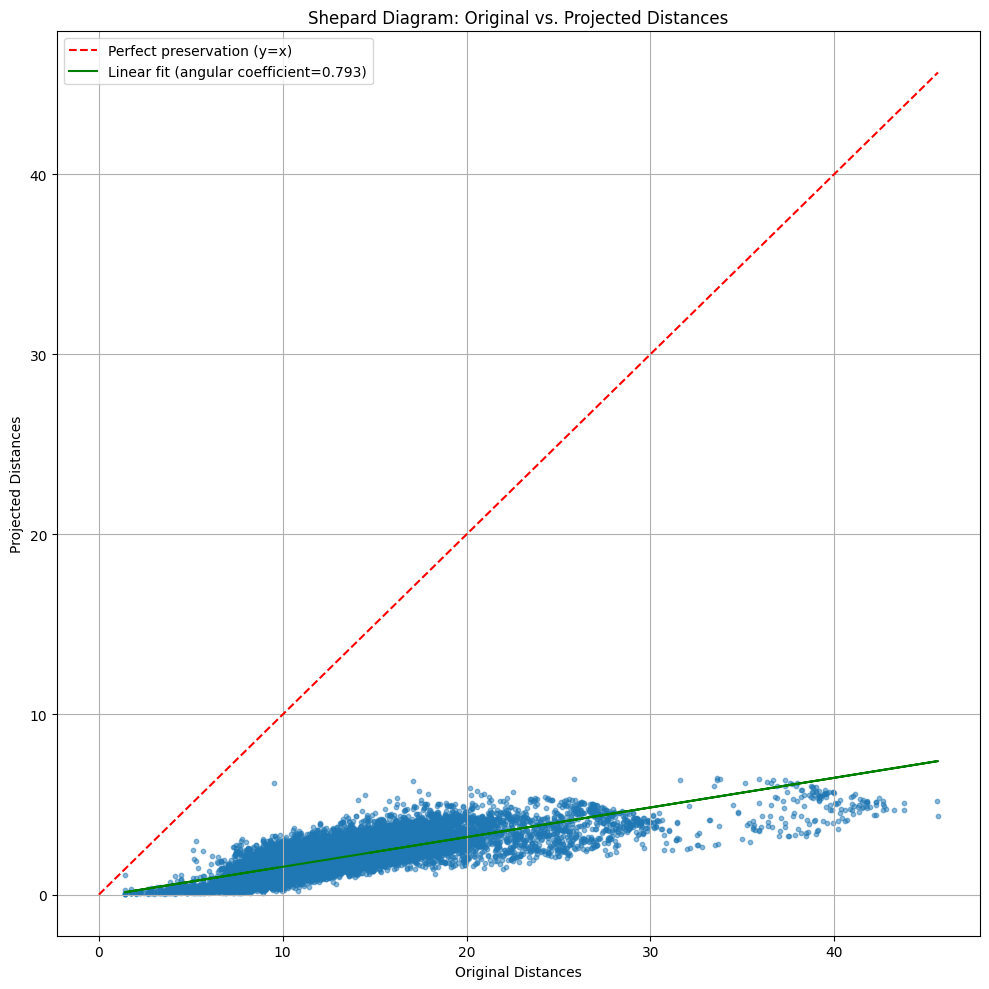

In [44]:
# MDS
fig, ax = plot_shepard_diagram(distance_matrix_np, mds_distance_matrix_reduced)
plt.show()

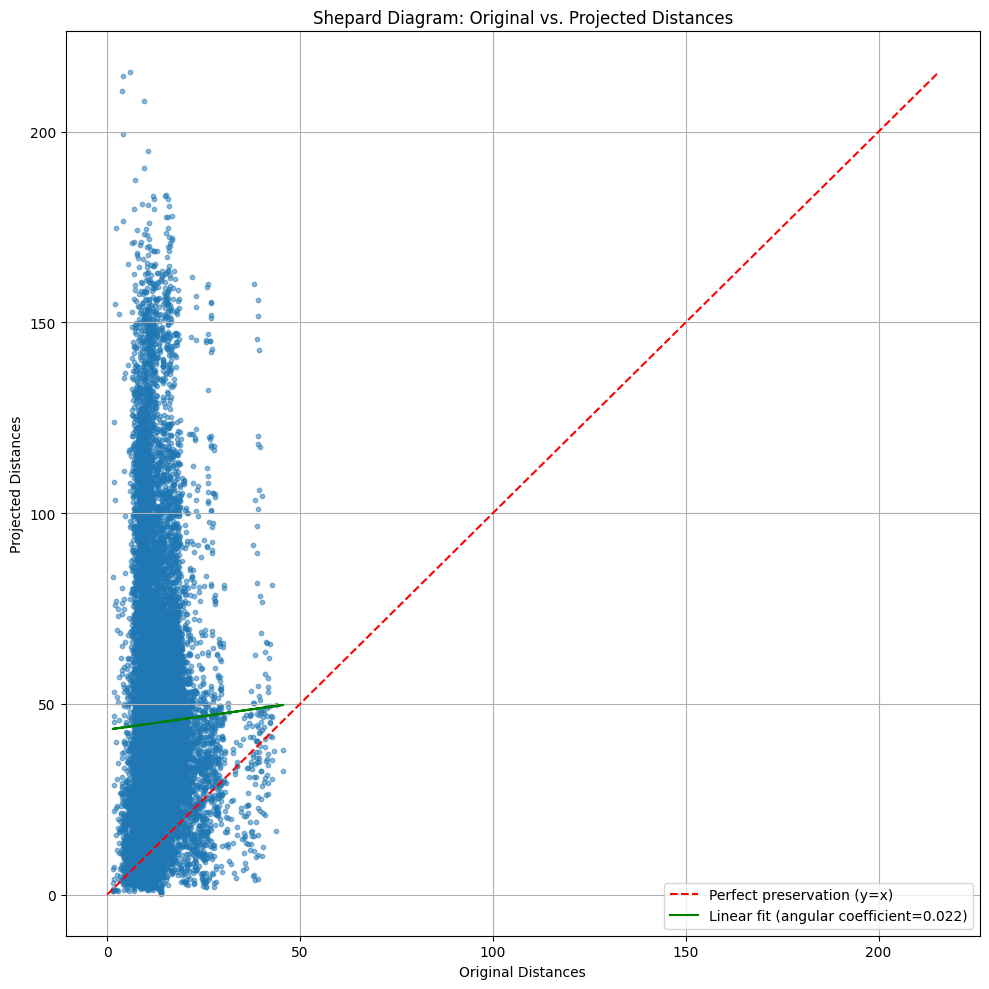

In [45]:
# t-SNE
fig, ax = plot_shepard_diagram(distance_matrix_np, tsne_distance_matrix_reduced)
plt.show()

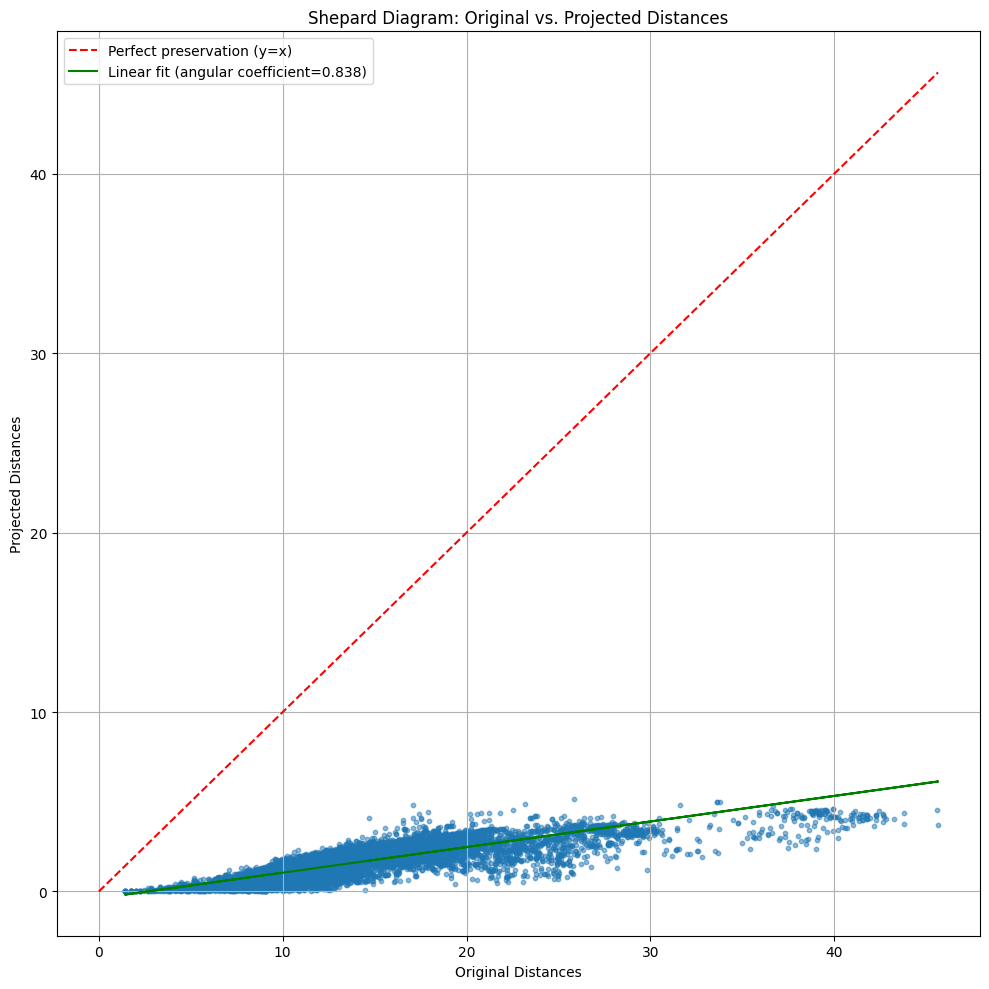

In [46]:
# isomap 2D
fig, ax = plot_shepard_diagram(distance_matrix_np, isomap_distance_matrix_reduced_2d)
plt.show()

#### Trustworthiness

In [47]:
# MDS
trust_score_MDS = trustworthiness(distance_matrix_np, mds_distance_matrix_reduced, n_neighbors=10)
print(f"Trustworthiness score of MDS: {trust_score_MDS:.4f}")

# t-SNE
trust_score_tsne = trustworthiness(distance_matrix_np, tsne_distance_matrix_reduced, n_neighbors=10)
print(f"Trustworthiness score of t-SNE: {trust_score_tsne:.4f}")

# isomap 2D
trust_score_isomap = trustworthiness(distance_matrix_np, isomap_distance_matrix_reduced_2d, n_neighbors=10)
print(f"Trustworthiness score of ISOMAP: {trust_score_isomap:.4f}")

Trustworthiness score of MDS: 0.9841
Trustworthiness score of t-SNE: 0.8332
Trustworthiness score of ISOMAP: 0.9451


#### Continuity

In [48]:
# MDS
cont_score_MDS = continuity(distance_matrix_np, mds_distance_matrix_reduced, n_neighbors=10)
print(f"Continuity score of MDS: {trust_score_MDS:.4f}")

# t-SNE
cont_score_tsne = continuity(distance_matrix_np, tsne_distance_matrix_reduced, n_neighbors=10)
print(f"Continuity score of t-SNE: {trust_score_tsne:.4f}")

# isomap 2D
cont_score_isomap = continuity(distance_matrix_np, isomap_distance_matrix_reduced_2d, n_neighbors=10)
print(f"Continuity score of ISOMAP: {cont_score_isomap:.4f}")

Continuity score of MDS: 0.9841
Continuity score of t-SNE: 0.8332
Continuity score of ISOMAP: 0.9666
